# For this particular assignment, the data of different types of wine sales in the 20th century is to be analysed. Both of these data are from the same company but of different wines. As an analyst in the ABC Estate Wines, you are tasked to analyse and forecast Wine Sales in the 20th century.

**Rose**

In [1]:
#importing necessary libraries
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt

**1. Read the data as an appropriate Time Series data and plot the data.**

In [2]:
rose_df = pd.read_csv("Rose.csv",parse_dates = True,index_col=0)

In [3]:
rose_df.head()

,Rose
YearMonth,
1980-01-01,112.0
1980-02-01,118.0
1980-03-01,129.0
1980-04-01,99.0
1980-05-01,116.0


In [4]:
rose_df.tail()

,Rose
YearMonth,
1995-03-01,45.0
1995-04-01,52.0
1995-05-01,28.0
1995-06-01,40.0
1995-07-01,62.0


In [5]:
rose_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 187 entries, 1980-01-01 to 1995-07-01
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Rose    185 non-null    float64
dtypes: float64(1)
memory usage: 2.9 KB


In [6]:
rose_df.shape

(187, 1)

In [7]:
rose_df.isnull().sum()

Rose    2
dtype: int64

The time series data has 2 missing values. These values need to be imputed. Let us look at the place where the dataset has missing values.

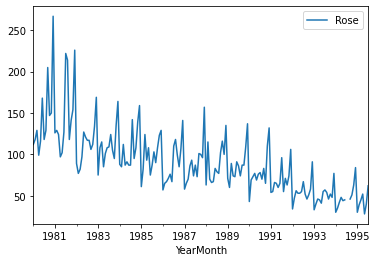

In [8]:
rose_df.plot();

We can see that the dataset has 2 missing values in the year 1994.

In [9]:
rose_df.loc["1994-01" : "1994-12"]

,Rose
YearMonth,
1994-01-01,30.0
1994-02-01,35.0
1994-03-01,42.0
1994-04-01,48.0
1994-05-01,44.0
1994-06-01,45.0
1994-07-01,NaN
1994-08-01,NaN
1994-09-01,46.0


In [10]:
rose_df = rose_df.interpolate()

In [11]:
rose_df.isnull().sum()

Rose    0
dtype: int64

In [12]:
rose_df.loc["1994-01" : "1994-12"]

,Rose
YearMonth,
1994-01-01,30.000000
1994-02-01,35.000000
1994-03-01,42.000000
1994-04-01,48.000000
1994-05-01,44.000000
1994-06-01,45.000000
1994-07-01,45.333333
1994-08-01,45.666667
1994-09-01,46.000000


Now, there are no missing values in the time-series data.

In [13]:
rose_df.duplicated().sum()

89

In [14]:
rose_df.index.nunique()

187

In [15]:
#importing rcparams
from  pylab import rcParams

In [16]:
rcParams["figure.figsize"] = 15,8

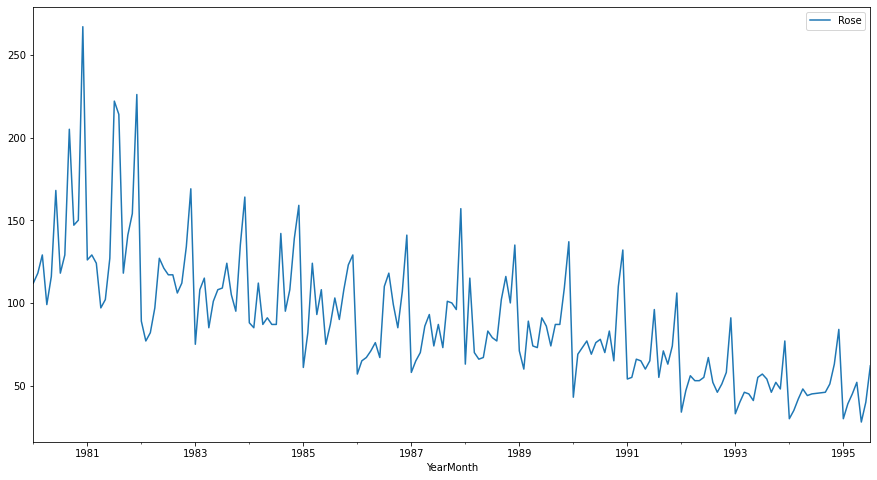

In [17]:
rose_df.plot();

After performing the linear interpolation for the missing data, the time series data has been plotted.

**2. Perform appropriate Exploratory Data Analysis to understand the data and also perform decomposition.**

Let us first use the describe function to find out the descriptive statistics of the data.

In [18]:
rose_df.describe().T

,count,mean,std,min,25%,50%,75%,max
Rose,187.0,89.914439,39.238325,28.0,62.5,85.0,111.0,267.0


The describe function looks at the dataset without looking at the time part of the data.

We can see that the data is almost normally distributed.

In [19]:
rose_df.skew()

Rose    1.26751
dtype: float64

<AxesSubplot:ylabel='Count'>

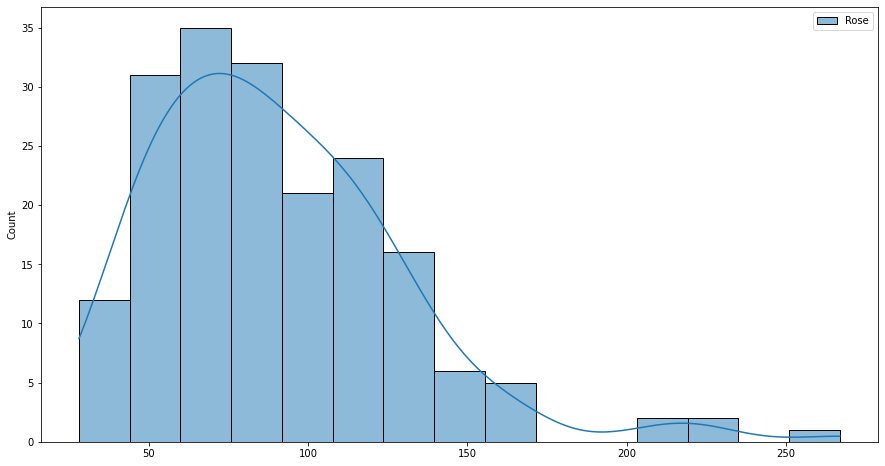

In [20]:
sns.histplot(rose_df, kde = True)

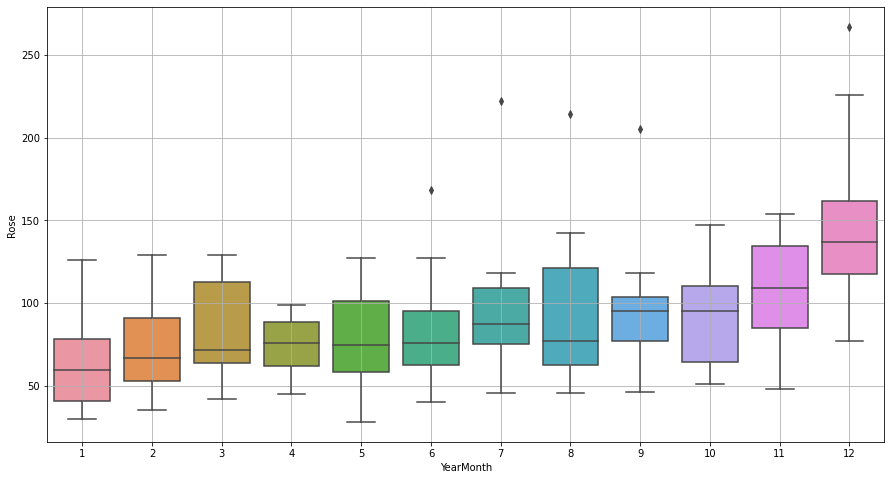

In [21]:
sns.boxplot(x=rose_df.index.month,y=rose_df["Rose"])
plt.grid()

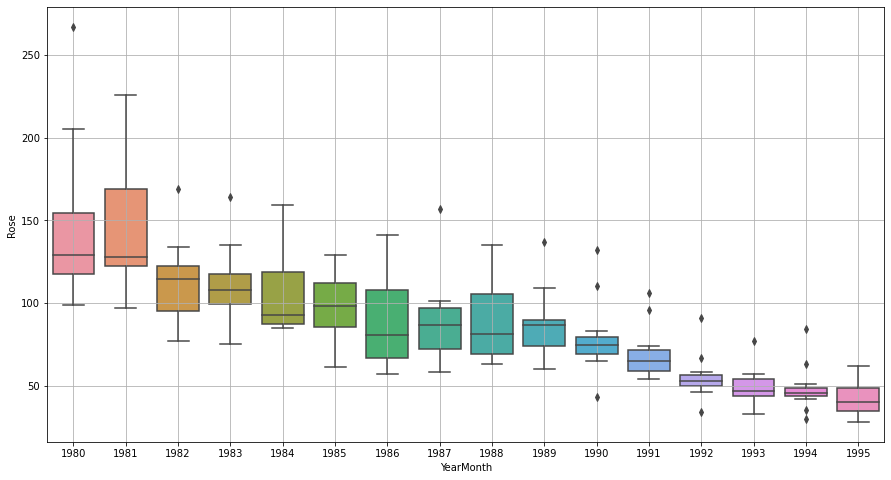

In [22]:
sns.boxplot(x=rose_df.index.year,y=rose_df["Rose"])
plt.grid()

In [23]:
monthly_sales_across_years = pd.pivot_table(rose_df, values = "Rose", columns = rose_df.index.month_name(), index = rose_df.index.year)
monthly_sales_across_years

YearMonth,April,August,December,February,January,July,June,March,May,November,October,September
YearMonth,,,,,,,,,,,,
1980,99.0,129.000000,267.0,118.0,112.0,118.000000,168.0,129.0,116.0,150.0,147.0,205.0
1981,97.0,214.000000,226.0,129.0,126.0,222.000000,127.0,124.0,102.0,154.0,141.0,118.0
1982,97.0,117.000000,169.0,77.0,89.0,117.000000,121.0,82.0,127.0,134.0,112.0,106.0
1983,85.0,124.000000,164.0,108.0,75.0,109.000000,108.0,115.0,101.0,135.0,95.0,105.0
1984,87.0,142.000000,159.0,85.0,88.0,87.000000,87.0,112.0,91.0,139.0,108.0,95.0
1985,93.0,103.000000,129.0,82.0,61.0,87.000000,75.0,124.0,108.0,123.0,108.0,90.0
1986,71.0,118.000000,141.0,65.0,57.0,110.000000,67.0,67.0,76.0,107.0,85.0,99.0
1987,86.0,73.000000,157.0,65.0,58.0,87.000000,74.0,70.0,93.0,96.0,100.0,101.0
1988,66.0,77.000000,135.0,115.0,63.0,79.000000,83.0,70.0,67.0,100.0,116.0,102.0


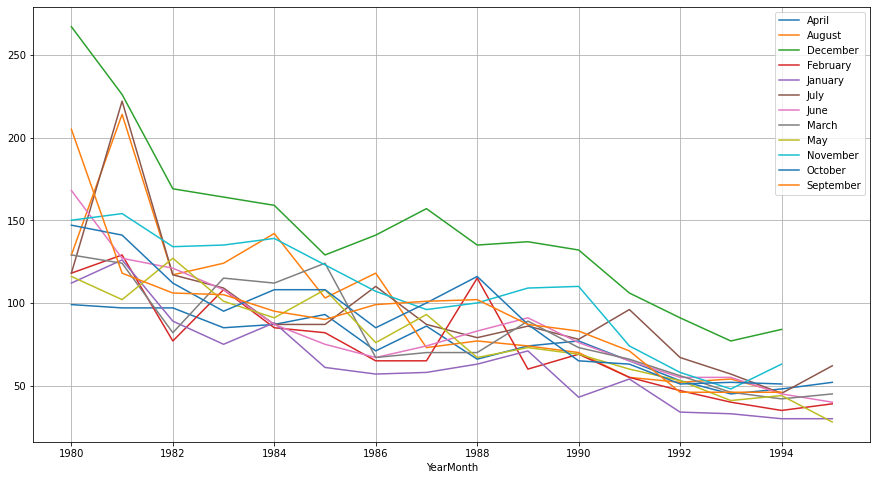

In [24]:
monthly_sales_across_years.plot()
plt.grid()
plt.legend(loc='best');

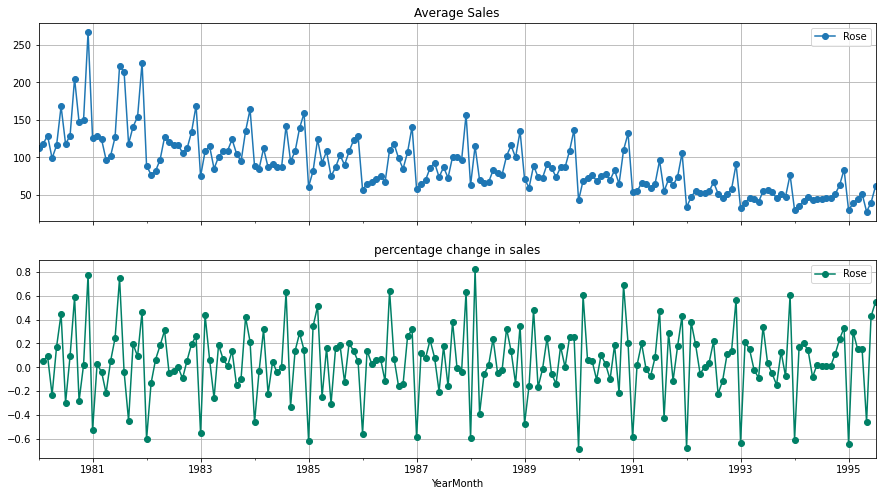

In [25]:
average = rose_df.groupby(rose_df.index)["Rose"].mean()
pct_change = rose_df.groupby(rose_df.index)["Rose"].sum().pct_change()

fig, (axis1,axis2) = plt.subplots(2,1, sharex = True, figsize = (15,8))

#Average Sales over time
ax1 = average.plot(legend = True, ax = axis1, marker = "o", title = "Average Sales", grid = True)
ax1.set_xticks(range(len(average)))
ax1.set_xticklabels(average.index.tolist())

#Percentage change for sales over time
ax2 = pct_change.plot(legend = True, ax = axis2, marker = "o", colormap = "summer", title = "percentage change in sales", grid = True)

C:\Users\srikanth\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Text(0.5, 1.0, 'Boxplot of Rose wine Sales')

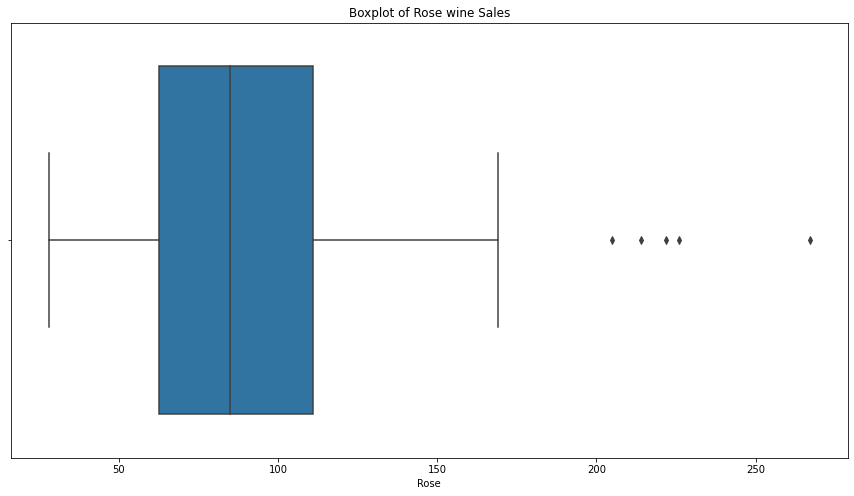

In [26]:
sns.boxplot(rose_df["Rose"]);
plt.title("Boxplot of Rose wine Sales")

In [27]:
def remove_outlier(col):
    Q1,Q3=col.quantile([0.25,0.75])
    IQR=Q3-Q1
    lower_range=Q1-(1.5*IQR)
    upper_range=Q3+(1.5*IQR)
    return lower_range,upper_range

In [28]:
LL1,UL1=remove_outlier(rose_df["Rose"])
print("The percentage of outliers in Rose wine sales Upper is",round(rose_df[rose_df["Rose"]>UL1]["Rose"].count()*100/len(rose_df),2),"%")
print("The percentage of outliers in Rose wine sales lower is",round(rose_df[rose_df["Rose"]<LL1]["Rose"].count()*100/len(rose_df),2),"%")

The percentage of outliers in Rose wine sales Upper is 2.67 %
The percentage of outliers in Rose wine sales lower is 0.0 %


In [29]:
#importing necessary library for performing decomposition
from statsmodels.tsa.seasonal import seasonal_decompose

In [30]:
rose_add_decompose = seasonal_decompose(rose_df, model = "additive")

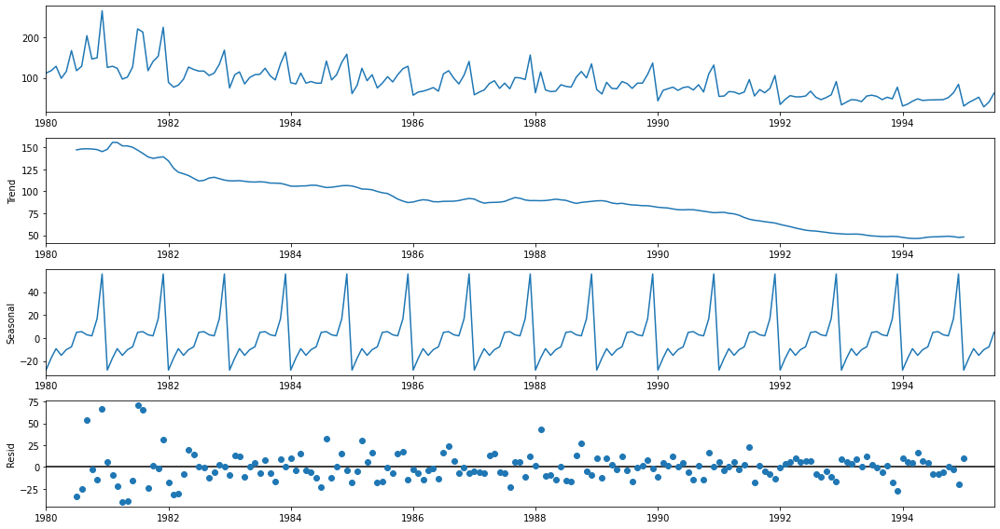

In [31]:
rose_add_decompose.plot();

From the decompostion that was done, we can see that the residual values are higher in the begining and gets lower towards the end. As there is a downward trend, the residuals are showing a little bit of a pattern.

Let us perform the multiplicative decomposition.

In [32]:
rose_mul_decompose = seasonal_decompose(rose_df, model = "multiplicative")

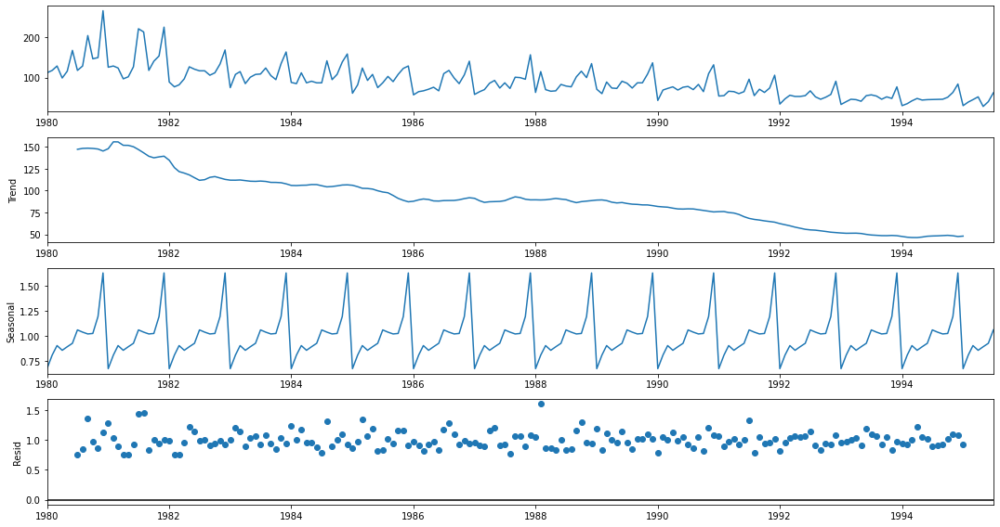

In [33]:
rose_mul_decompose.plot();

Now we can see that the residuals are almsot evenly distributed without a pattern.

**3. Split the data into training and test. The test data should start in 1991.**

In [34]:
rose_train = rose_df[rose_df.index<"1991"]
rose_test = rose_df[rose_df.index>="1991"]

In [35]:
rose_train.head()

,Rose
YearMonth,
1980-01-01,112.0
1980-02-01,118.0
1980-03-01,129.0
1980-04-01,99.0
1980-05-01,116.0


In [36]:
rose_train.tail()

,Rose
YearMonth,
1990-08-01,70.0
1990-09-01,83.0
1990-10-01,65.0
1990-11-01,110.0
1990-12-01,132.0


In [37]:
rose_test.head()

,Rose
YearMonth,
1991-01-01,54.0
1991-02-01,55.0
1991-03-01,66.0
1991-04-01,65.0
1991-05-01,60.0


In [38]:
rose_test.tail()

,Rose
YearMonth,
1995-03-01,45.0
1995-04-01,52.0
1995-05-01,28.0
1995-06-01,40.0
1995-07-01,62.0


In [39]:
rose_train.shape

(132, 1)

In [40]:
rose_test.shape

(55, 1)

The dataset has been split into train and test set, with the test set starting from the year 1991

**4. Build all the exponential smoothing models on the training data and evaluate the model using RMSE on the test data. Other additional models such as regression, naïve forecast models, simple average models, moving average models should also be built on the training data and check the performance on the test data using RMSE.**

**Simple Exponential Smoothing**

In [41]:
#importing necessary library
from statsmodels.tsa.api import SimpleExpSmoothing

In [42]:
SES_rose_train = rose_train.copy()
SES_rose_test = rose_test.copy()

In [43]:
print(SES_rose_train.head())

             Rose
YearMonth        
1980-01-01  112.0
1980-02-01  118.0
1980-03-01  129.0
1980-04-01   99.0
1980-05-01  116.0


In [44]:
print(SES_rose_test.head())

            Rose
YearMonth       
1991-01-01  54.0
1991-02-01  55.0
1991-03-01  66.0
1991-04-01  65.0
1991-05-01  60.0


In [45]:
SES_rose_model_1 = SimpleExpSmoothing(SES_rose_train["Rose"])

C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'
C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:427: FutureWarning: After 0.13 initialization must be handled at model creation
  warnings.warn(


In [46]:
SES_rose_model_autofit = SES_rose_model_1.fit(optimized = True)

In [47]:
SES_rose_model_autofit.params

{'smoothing_level': 0.0987493111726833,
 'smoothing_trend': nan,
 'smoothing_seasonal': nan,
 'damping_trend': nan,
 'initial_level': 134.38720226208358,
 'initial_trend': nan,
 'initial_seasons': array([], dtype=float64),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [48]:
rose_test_pred_SES = SES_rose_model_autofit.forecast(steps = len(SES_rose_test))

In [49]:
rose_test_pred_SES.head()

1991-01-01    87.104983
1991-02-01    87.104983
1991-03-01    87.104983
1991-04-01    87.104983
1991-05-01    87.104983
Freq: MS, dtype: float64

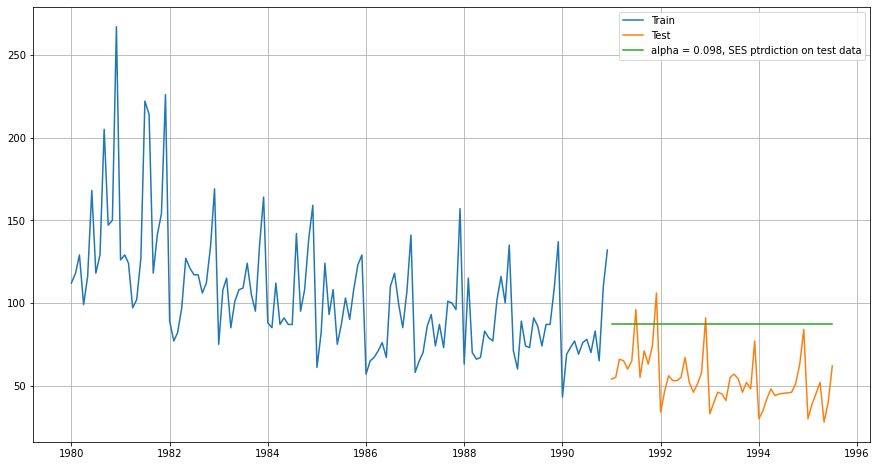

In [50]:
plt.plot(rose_train["Rose"], label = "Train")
plt.plot(rose_test["Rose"], label = "Test")
plt.plot(rose_test_pred_SES, label = "alpha = 0.098, SES ptrdiction on test data")
plt.legend(loc = "best")
plt.grid();

In [51]:
#Importing metrics for model evaluation
from sklearn import metrics

In [52]:
#defining a function to calculate MAPE
def MAPE(y, yhat):
    y, yhat = np.array(y), np.array(yhat)
    try:
        mape = round(np.sum(np.abs(yhat-y))/np.sum(y)*100,2)
    except:
        print("Observed values are empty")
        mape = np.nan
    return mape

In [53]:
rmse_rose_test_SES = metrics.mean_squared_error(rose_test["Rose"],rose_test_pred_SES, squared = False)

In [54]:
rmse_rose_test_SES

36.79622738288924

In [55]:
MAPE_rose_SES = MAPE(rose_test["Rose"],rose_test_pred_SES)

In [56]:
MAPE_rose_SES

63.88

In [57]:
resultsDF_rose = pd.DataFrame({"RMSE_Test":(rmse_rose_test_SES),
                                  "MAPE":(MAPE_rose_SES)
                                  }, index = ["Simple Exponential Smoothing, alpha = 0.098"])

In [58]:
resultsDF_rose_SES = pd.DataFrame({"RMSE_Test":(rmse_rose_test_SES),
                                  "MAPE":(MAPE_rose_SES)
                                  }, index = ["Simple Exponential Smoothing, alpha = 0.098"])

In [59]:
resultsDF_rose_SES

,RMSE_Test,MAPE
"Simple Exponential Smoothing, alpha = 0.098",36.796227,63.88


**Simple Exponential Smoothing using best alpha value**

In [60]:
bestDF_SES_model = pd.DataFrame({"Alpha values":[],
                                    "Test RMSE":[]
})

In [61]:
bestDF_SES_model

,Alpha values,Test RMSE


In [62]:
for i in np.arange(0.01,1,0.01):
    SES_model_alpha_i = SES_rose_model_1.fit(smoothing_level = i, optimized = False, use_brute = True)
    SES_rose_test["predict",i] = SES_model_alpha_i.forecast(steps = len(SES_rose_test))
    
    rmse_model_SES_i = metrics.mean_squared_error(rose_test["Rose"], SES_rose_test["predict",i], squared = False)
    
    bestDF_SES_model = bestDF_SES_model.append({"Alpha values": i,
                                                      "Test RMSE":rmse_model_SES_i
    }, ignore_index = True)

In [63]:
bestDF_SES_model.sort_values(by = "Test RMSE", ascending = True).head()

,Alpha values,Test RMSE
6,0.07,36.435772
7,0.08,36.462965
5,0.06,36.580469
8,0.09,36.604118
9,0.10,36.828033


The SES model gives the best result for the alpha value 0.07. Let us look at the predictions and the graph.

In [64]:
SES_model_alpha_07 = SES_rose_model_1.fit(smoothing_level = 0.07, optimized = False, use_brute = True)
SES_rose_test_predict_best = SES_model_alpha_07.forecast(steps = len(SES_rose_test))

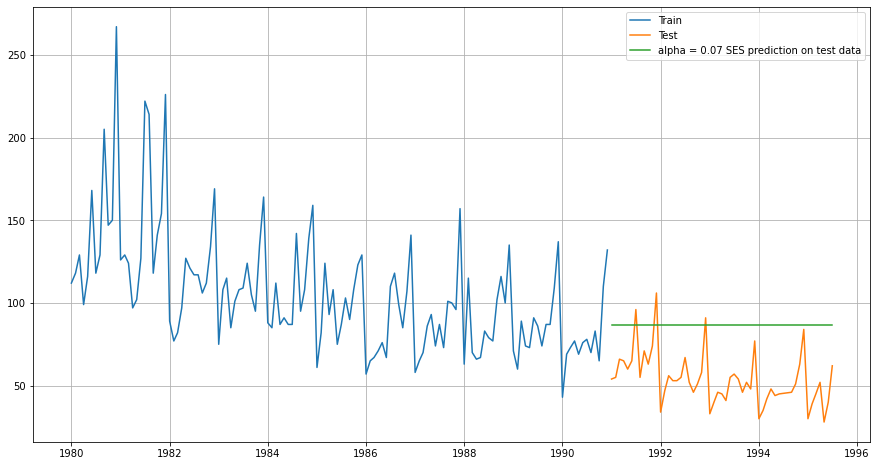

In [65]:
plt.plot(rose_train["Rose"], label = "Train")
plt.plot(rose_test["Rose"], label = "Test")
plt.plot(SES_rose_test_predict_best, label = "alpha = 0.07 SES prediction on test data")
plt.legend(loc = "best")
plt.grid();

In [66]:
rmse_model_SES_07 = metrics.mean_squared_error(rose_test["Rose"], SES_rose_test_predict_best, squared = False)

In [67]:
rmse_model_SES_07

36.43577152318438

In [68]:
MAPE_rose_SES_07 = MAPE(rose_test["Rose"],SES_rose_test_predict_best)

In [69]:
MAPE_rose_SES_07

63.22

In [70]:
resultsDF_rose_SES_best = pd.DataFrame({"RMSE_Test":(rmse_model_SES_07),
                                  "MAPE":(MAPE_rose_SES_07)
                                  }, index = ["Simple Exponential Smoothing, alpha = 0.07"])

In [71]:
resultsDF_rose_SES_best

,RMSE_Test,MAPE
"Simple Exponential Smoothing, alpha = 0.07",36.435772,63.22


In [72]:
resultsDF_rose = pd.concat([resultsDF_rose,resultsDF_rose_SES_best])

In [73]:
resultsDF_rose

,RMSE_Test,MAPE
"Simple Exponential Smoothing, alpha = 0.098",36.796227,63.88
"Simple Exponential Smoothing, alpha = 0.07",36.435772,63.22


**Double Exponential SMoothing**

In [74]:
#importing necessary library
from statsmodels.tsa.api import Holt

In [75]:
DES_rose_train = rose_train.copy()
DES_rose_test = rose_test.copy()

In [76]:
DES_rose_model_2 = Holt(DES_rose_train["Rose"])

C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'
C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:427: FutureWarning: After 0.13 initialization must be handled at model creation
  warnings.warn(


In [77]:
DES_rose_model_autofit = DES_rose_model_2.fit(optimized = True, use_brute = True)

In [78]:
DES_rose_model_autofit.params_formatted

,name,param,optimized
smoothing_level,alpha,0.017550,True
smoothing_trend,beta,0.000032,True
initial_level,l.0,138.820815,True
initial_trend,b.0,-0.492580,True


In [79]:
rose_test_pred_DES = DES_rose_model_autofit.forecast(steps = len(DES_rose_test))

In [80]:
rose_test_pred_DES.head()

1991-01-01    73.259732
1991-02-01    72.767150
1991-03-01    72.274569
1991-04-01    71.781987
1991-05-01    71.289405
Freq: MS, dtype: float64

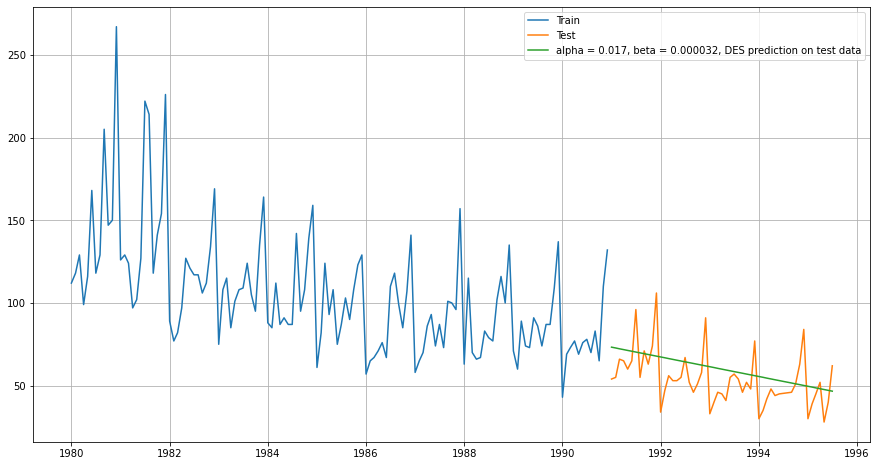

In [81]:
plt.plot(rose_train["Rose"], label = "Train")
plt.plot(rose_test["Rose"], label = "Test")
plt.plot(rose_test_pred_DES, label = "alpha = 0.017, beta = 0.000032, DES prediction on test data")
plt.legend(loc = "best")
plt.grid();

In [82]:
rmse_rose_test_DES = metrics.mean_squared_error(rose_test["Rose"],rose_test_pred_DES, squared = False)

In [83]:
rmse_rose_test_DES

15.707051651141704

In [84]:
MAPE_rose_DES = MAPE(rose_test["Rose"],rose_test_pred_DES)

In [85]:
MAPE_rose_DES

24.12

In [86]:
resultsDF_rose_DES = pd.DataFrame({"RMSE_Test":(rmse_rose_test_DES),
                                  "MAPE":(MAPE_rose_DES)
                                  }, index = ["Double Exponential Smoothing, alpha = 0.017, beta = 0.000032"])

In [87]:
resultsDF_rose_DES

,RMSE_Test,MAPE
"Double Exponential Smoothing, alpha = 0.017, beta = 0.000032",15.707052,24.12


In [88]:
resultsDF_rose = pd.concat([resultsDF_rose,resultsDF_rose_DES])

In [89]:
resultsDF_rose

,RMSE_Test,MAPE
"Simple Exponential Smoothing, alpha = 0.098",36.796227,63.88
"Simple Exponential Smoothing, alpha = 0.07",36.435772,63.22
"Double Exponential Smoothing, alpha = 0.017, beta = 0.000032",15.707052,24.12


**Double Explonential model using best alpha and beta values**

In [90]:
bestDF_DES_model = pd.DataFrame({"Alpha values":[],
                                 "Beta values":[], 
                                    "Test RMSE":[]
})

In [91]:
bestDF_DES_model

,Alpha values,Beta values,Test RMSE


In [92]:
for i in np.arange(0.01,1,0.01):
    for j in np.arange(0.01,1,0.01):
        DES_model_alpha_i_j = DES_rose_model_2.fit(smoothing_level = i, smoothing_trend = j, optimized = False, use_brute = True)
        DES_rose_test["predict",i,j] = DES_model_alpha_i_j.forecast(steps = len(DES_rose_test))
    
        rmse_model_DES_i_j = metrics.mean_squared_error(rose_test["Rose"], DES_rose_test["predict",i,j], squared = False)
    
        bestDF_DES_model = bestDF_DES_model.append({"Alpha values": i, 
                                                    "Beta values": j, 
                                                    "Test RMSE":rmse_model_DES_i_j}, ignore_index = True)    

In [93]:
bestDF_DES_model.sort_values(by = "Test RMSE", ascending = True).head()

,Alpha values,Beta values,Test RMSE
343,0.04,0.47,14.560058
222,0.03,0.25,14.683478
262,0.03,0.65,14.714918
300,0.04,0.04,14.895847
342,0.04,0.46,14.907935


In [94]:
DES_model_alpha_04_beta_47 = DES_rose_model_2.fit(smoothing_level = 0.04, smoothing_trend = 0.47, optimized = False, use_brute = True)
DES_rose_test_predict_best = DES_model_alpha_04_beta_47.forecast(steps = len(DES_rose_test))

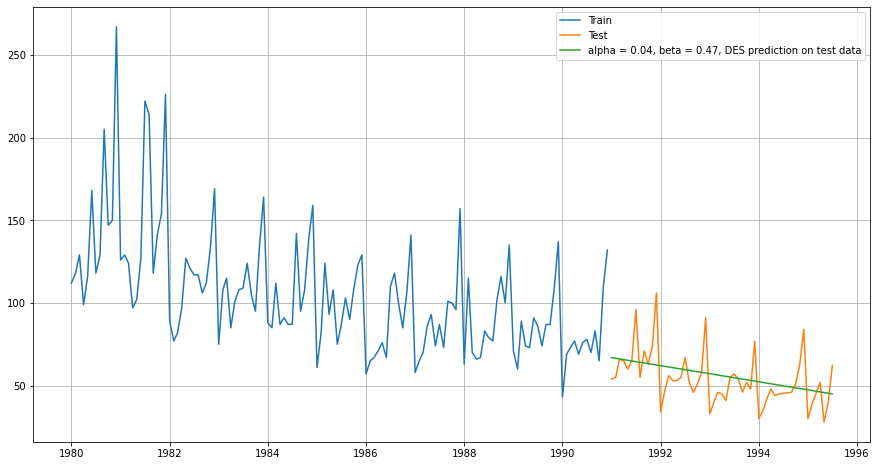

In [95]:
plt.plot(rose_train["Rose"], label = "Train")
plt.plot(rose_test["Rose"], label = "Test")
plt.plot(DES_rose_test_predict_best, label = "alpha = 0.04, beta = 0.47, DES prediction on test data")
plt.legend(loc = "best")
plt.grid();

In [96]:
rmse_model_DES_04_47 = metrics.mean_squared_error(rose_test["Rose"], DES_rose_test_predict_best, squared = False)

In [97]:
rmse_model_DES_04_47

14.560058084677587

In [98]:
MAPE_rose_DES_04_47 = MAPE(rose_test["Rose"],DES_rose_test_predict_best)

In [99]:
MAPE_rose_DES_04_47

19.94

In [100]:
resultsDF_rose_DES_best = pd.DataFrame({"RMSE_Test":(rmse_model_DES_04_47),
                                  "MAPE":(MAPE_rose_DES_04_47)
                                  }, index = ["Double Exponential Smoothing, alpha = 0.04, beta = 0.47"])

In [101]:
resultsDF_rose_DES_best

,RMSE_Test,MAPE
"Double Exponential Smoothing, alpha = 0.04, beta = 0.47",14.560058,19.94


In [102]:
resultsDF_rose = pd.concat([resultsDF_rose,resultsDF_rose_DES_best])

In [103]:
resultsDF_rose

,RMSE_Test,MAPE
"Simple Exponential Smoothing, alpha = 0.098",36.796227,63.88
"Simple Exponential Smoothing, alpha = 0.07",36.435772,63.22
"Double Exponential Smoothing, alpha = 0.017, beta = 0.000032",15.707052,24.12
"Double Exponential Smoothing, alpha = 0.04, beta = 0.47",14.560058,19.94


**Triple Exponential Smoothing Multiplicative model**

In [104]:
#importing necessary library
from statsmodels.tsa.api import ExponentialSmoothing

In [105]:
TES_rose_train = rose_train.copy()
TES_rose_test = rose_test.copy()

In [106]:
print(TES_rose_train.head())

             Rose
YearMonth        
1980-01-01  112.0
1980-02-01  118.0
1980-03-01  129.0
1980-04-01   99.0
1980-05-01  116.0


In [107]:
print(TES_rose_test.head())

            Rose
YearMonth       
1991-01-01  54.0
1991-02-01  55.0
1991-03-01  66.0
1991-04-01  65.0
1991-05-01  60.0


In [108]:
TES_rose_model_3 = ExponentialSmoothing(TES_rose_train["Rose"], trend = "multiplicative", seasonal = "multiplicative")

C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'
C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:427: FutureWarning: After 0.13 initialization must be handled at model creation
  warnings.warn(


In [109]:
TES_model_autofit = TES_rose_model_3.fit(optimized = True, use_brute = True)

C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:80: RuntimeWarning: overflow encountered in matmul
  return err.T @ err


In [110]:
TES_model_autofit.params

{'smoothing_level': 0.07684953464348428,
 'smoothing_trend': 0.05491647219884931,
 'smoothing_seasonal': 0.40977949772664024,
 'damping_trend': nan,
 'initial_level': 76.57052318384048,
 'initial_trend': 1.0043843302608235,
 'initial_seasons': array([1.75233949, 2.04184522, 1.94202985, 1.68685519, 1.9033056 ,
        2.23532321, 2.33532917, 2.48356053, 2.67170629, 2.20337541,
        2.37402434, 3.54491046]),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [111]:
rose_test_pred_TES = TES_model_autofit.forecast(steps = len(TES_rose_test))

In [112]:
rose_test_pred_TES.head()

1991-01-01    50.498002
1991-02-01    66.528416
1991-03-01    70.341975
1991-04-01    68.048162
1991-05-01    65.839128
Freq: MS, dtype: float64

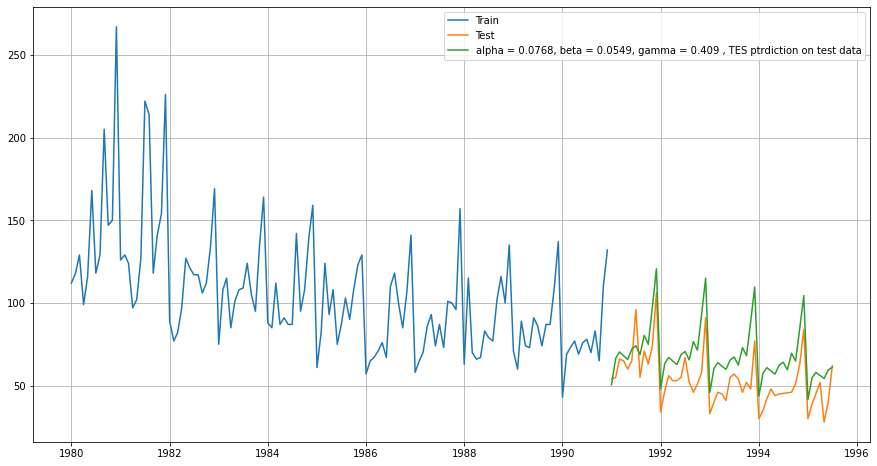

In [113]:
plt.plot(rose_train["Rose"], label = "Train")
plt.plot(rose_test["Rose"], label = "Test")
plt.plot(rose_test_pred_TES, label = "alpha = 0.0768, beta = 0.0549, gamma = 0.409 , TES ptrdiction on test data")
plt.legend(loc = "best")
plt.grid();

In [114]:
rmse_rose_test_TES = metrics.mean_squared_error(rose_test["Rose"],rose_test_pred_TES, squared = False)

In [115]:
rmse_rose_test_TES

17.739018702777205

In [116]:
MAPE_rose_TES = MAPE(rose_test["Rose"],rose_test_pred_TES)

In [117]:
MAPE_rose_TES

29.28

In [118]:
resultsDF_rose_TES = pd.DataFrame({"RMSE_Test":(rmse_rose_test_TES),
                                  "MAPE":(MAPE_rose_TES)
                                  }, index = ["Triple Exponential Smoothing (Multiplicative), alpha = 0.0768, beta = 0.0549, gamma = 0.409"])

In [119]:
resultsDF_rose_TES

,RMSE_Test,MAPE
"Triple Exponential Smoothing (Multiplicative), alpha = 0.0768, beta = 0.0549, gamma = 0.409",17.739019,29.28


In [120]:
resultsDF_rose = pd.concat([resultsDF_rose,resultsDF_rose_TES])

In [121]:
resultsDF_rose

,RMSE_Test,MAPE
"Simple Exponential Smoothing, alpha = 0.098",36.796227,63.88
"Simple Exponential Smoothing, alpha = 0.07",36.435772,63.22
"Double Exponential Smoothing, alpha = 0.017, beta = 0.000032",15.707052,24.12
"Double Exponential Smoothing, alpha = 0.04, beta = 0.47",14.560058,19.94
"Triple Exponential Smoothing (Multiplicative), alpha = 0.0768, beta = 0.0549, gamma = 0.409",17.739019,29.28


**Triple Exponential Smoothing Multipilcative based on alpha beta and gamma values**

In [122]:
bestDF_TES_model = pd.DataFrame({"Alpha values":[],
                                 "Beta values":[], 
                                 "Gamma values":[],
                                 "Test RMSE":[]
})

In [123]:
bestDF_TES_model

,Alpha values,Beta values,Gamma values,Test RMSE


In [124]:
for i in np.arange(0.1,1,0.1):
    for j in np.arange(0.1,1,0.1):
        for k in np.arange(0.1,1,0.1):
            TES_model_alpha_i_j_k = TES_rose_model_3.fit(smoothing_level = i, smoothing_trend = j, smoothing_seasonal = k, optimized = False, use_brute = True)
            TES_rose_test["predict",i,j,k] = TES_model_alpha_i_j_k.forecast(steps = len(TES_rose_test))
    
            rmse_model_TES_i_j_k = metrics.mean_squared_error(rose_test["Rose"], TES_rose_test["predict",i,j,k], squared = False)
    
            bestDF_TES_model = bestDF_TES_model.append({"Alpha values": i, 
                                                        "Beta values": j, 
                                                        "Gamma values": k, 
                                                        "Test RMSE":rmse_model_TES_i_j_k}, ignore_index = True)


In [125]:
bestDF_TES_model.sort_values(by = "Test RMSE", ascending = True).head()

,Alpha values,Beta values,Gamma values,Test RMSE
145,0.2,0.8,0.2,9.086461
136,0.2,0.7,0.2,9.103734
192,0.3,0.4,0.4,10.317563
176,0.3,0.2,0.6,10.346639
177,0.3,0.2,0.7,11.529316


In [126]:
TES_model_alpha_2_beta_8_gamma_2 = TES_rose_model_3.fit(smoothing_level = 0.2, smoothing_trend = 0.8, smoothing_seasonal = 0.2,  optimized = False, use_brute = True)
TES_rose_test_predict_best = TES_model_alpha_2_beta_8_gamma_2.forecast(steps = len(TES_rose_test))

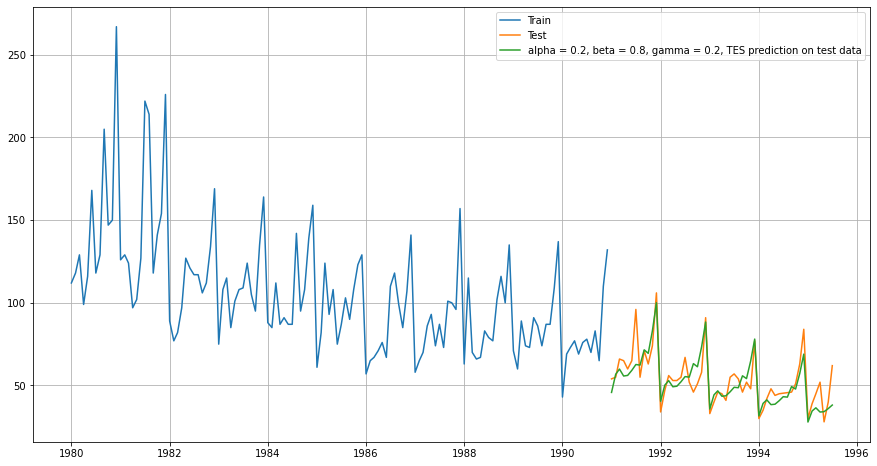

In [127]:
plt.plot(rose_train["Rose"], label = "Train")
plt.plot(rose_test["Rose"], label = "Test")
plt.plot(TES_rose_test_predict_best, label = "alpha = 0.2, beta = 0.8, gamma = 0.2, TES prediction on test data")
plt.legend(loc = "best")
plt.grid();

In [128]:
rmse_model_TES_2_8_2 = metrics.mean_squared_error(rose_test["Rose"], TES_rose_test_predict_best, squared = False)

In [129]:
rmse_model_TES_2_8_2 

9.086461289632455

In [130]:
MAPE_rose_TES_2_8_2 = MAPE(rose_test["Rose"], TES_rose_test_predict_best)

In [131]:
MAPE_rose_TES_2_8_2

12.48

In [132]:
resultsDF_rose_TES_best = pd.DataFrame({"RMSE_Test":(rmse_model_TES_2_8_2),
                                  "MAPE":(MAPE_rose_TES_2_8_2)
                                  }, index = ["Triple Exponential Multiplicaticve Smoothing, alpha = 0.2, beta = 0.8, gamma = 0.2"])

In [133]:
resultsDF_rose_TES_best

,RMSE_Test,MAPE
"Triple Exponential Multiplicaticve Smoothing, alpha = 0.2, beta = 0.8, gamma = 0.2",9.086461,12.48


In [134]:
resultsDF_rose = pd.concat([resultsDF_rose,resultsDF_rose_TES_best])

In [135]:
resultsDF_rose

,RMSE_Test,MAPE
"Simple Exponential Smoothing, alpha = 0.098",36.796227,63.88
"Simple Exponential Smoothing, alpha = 0.07",36.435772,63.22
"Double Exponential Smoothing, alpha = 0.017, beta = 0.000032",15.707052,24.12
"Double Exponential Smoothing, alpha = 0.04, beta = 0.47",14.560058,19.94
"Triple Exponential Smoothing (Multiplicative), alpha = 0.0768, beta = 0.0549, gamma = 0.409",17.739019,29.28
"Triple Exponential Multiplicaticve Smoothing, alpha = 0.2, beta = 0.8, gamma = 0.2",9.086461,12.48


**Regression Model**

In [136]:
#importing necessarry library
from sklearn.linear_model import LinearRegression

In [137]:
lr_rose_5 = LinearRegression()

In [138]:
LinReg_rose_train = rose_train.copy()
LinReg_rose_test = rose_test.copy()

In [139]:
train_time = [i+1 for i in range(len(rose_train))]
test_time = [i+133 for i in range(len(rose_test))]

In [140]:
LinReg_rose_train["time"] = train_time
LinReg_rose_test["time"] = test_time

In [141]:
LinReg_rose_train.head()

,Rose,time
YearMonth,,
1980-01-01,112.0,1
1980-02-01,118.0,2
1980-03-01,129.0,3
1980-04-01,99.0,4
1980-05-01,116.0,5


In [142]:
LinReg_rose_train.tail()

,Rose,time
YearMonth,,
1990-08-01,70.0,128
1990-09-01,83.0,129
1990-10-01,65.0,130
1990-11-01,110.0,131
1990-12-01,132.0,132


In [143]:
LinReg_rose_test.head()

,Rose,time
YearMonth,,
1991-01-01,54.0,133
1991-02-01,55.0,134
1991-03-01,66.0,135
1991-04-01,65.0,136
1991-05-01,60.0,137


In [144]:
LinReg_rose_test.tail()

,Rose,time
YearMonth,,
1995-03-01,45.0,183
1995-04-01,52.0,184
1995-05-01,28.0,185
1995-06-01,40.0,186
1995-07-01,62.0,187


In [145]:
lr_rose_5.fit(LinReg_rose_train[["time"]],LinReg_rose_train["Rose"])

LinearRegression()

In [146]:
rose_train_pred_lr = lr_rose_5.predict(LinReg_rose_train[["time"]])

In [147]:
LinReg_rose_train["Reg_on_Time"] = rose_train_pred_lr

In [148]:
rose_test_pred_lr = lr_rose_5.predict(LinReg_rose_test[["time"]])

In [149]:
LinReg_rose_test["Reg_on_Time"] = rose_test_pred_lr

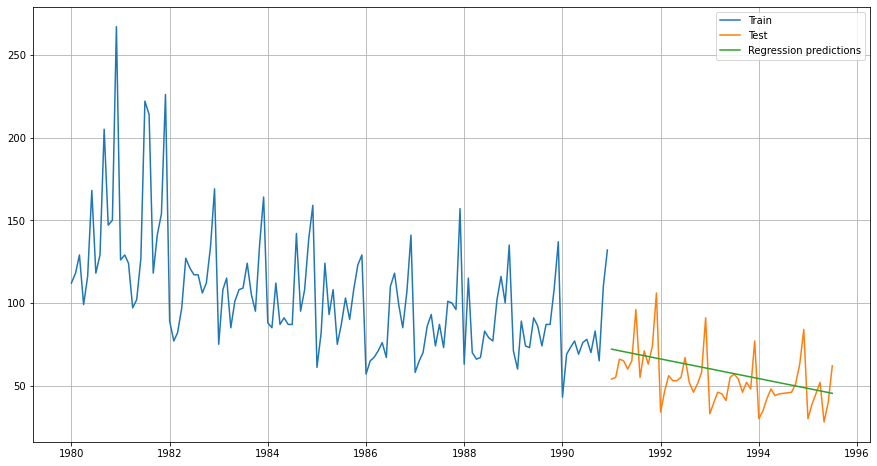

In [150]:
plt.plot(rose_train["Rose"], label = "Train")
plt.plot(rose_test["Rose"], label = "Test")
plt.plot(LinReg_rose_test["Reg_on_Time"], label = "Regression predictions")
plt.legend(loc = "best")
plt.grid();

In [151]:
rmse_rose_test_lr = metrics.mean_squared_error(rose_test["Rose"],rose_test_pred_lr, squared = False)

In [152]:
rmse_rose_test_lr

15.268955197146555

In [153]:
MAPE_rose_lr = MAPE(rose_test["Rose"],rose_test_pred_lr)

In [154]:
MAPE_rose_lr

22.82

In [155]:
resultsDF_rose_lr = pd.DataFrame({"RMSE_Test":(rmse_rose_test_lr),
                                  "MAPE":(MAPE_rose_lr)
                                  }, index = ["Linear Regression"])

In [156]:
resultsDF_rose_lr

,RMSE_Test,MAPE
Linear Regression,15.268955,22.82


In [157]:
resultsDF_rose = pd.concat([resultsDF_rose,resultsDF_rose_lr])

In [158]:
resultsDF_rose

,RMSE_Test,MAPE
"Simple Exponential Smoothing, alpha = 0.098",36.796227,63.88
"Simple Exponential Smoothing, alpha = 0.07",36.435772,63.22
"Double Exponential Smoothing, alpha = 0.017, beta = 0.000032",15.707052,24.12
"Double Exponential Smoothing, alpha = 0.04, beta = 0.47",14.560058,19.94
"Triple Exponential Smoothing (Multiplicative), alpha = 0.0768, beta = 0.0549, gamma = 0.409",17.739019,29.28
"Triple Exponential Multiplicaticve Smoothing, alpha = 0.2, beta = 0.8, gamma = 0.2",9.086461,12.48
Linear Regression,15.268955,22.82


**Naive Model**

In [159]:
Naive_rose_train = rose_train.copy()
Naive_rose_test = rose_test.copy()

In [160]:
rose_train.tail()

,Rose
YearMonth,
1990-08-01,70.0
1990-09-01,83.0
1990-10-01,65.0
1990-11-01,110.0
1990-12-01,132.0


In [161]:
Naive_rose_test["Naive"] = 132

In [162]:
Naive_rose_test["Naive"].head()

YearMonth
1991-01-01    132
1991-02-01    132
1991-03-01    132
1991-04-01    132
1991-05-01    132
Name: Naive, dtype: int64

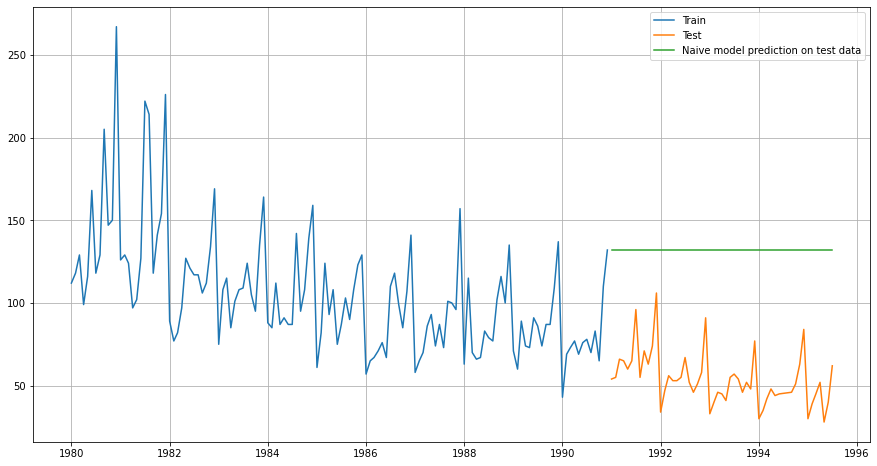

In [163]:
plt.plot(Naive_rose_train["Rose"], label = "Train")
plt.plot(Naive_rose_test["Rose"], label = "Test")
plt.plot(Naive_rose_test["Naive"], label = "Naive model prediction on test data")
plt.legend(loc = "best")
plt.grid();

In [164]:
rmse_rose_test_naive = metrics.mean_squared_error(Naive_rose_test["Rose"],Naive_rose_test["Naive"], squared = False)

In [165]:
rmse_rose_test_naive

79.71877337417347

In [166]:
MAPE_rose_naive = MAPE(Naive_rose_test["Rose"],Naive_rose_test["Naive"])

In [167]:
MAPE_rose_naive

145.1

In [168]:
resultsDF_rose_naive = pd.DataFrame({"RMSE_Test":(rmse_rose_test_naive),
                                  "MAPE":(MAPE_rose_naive)
                                  }, index = ["Naive Model"])

In [169]:
resultsDF_rose_naive

,RMSE_Test,MAPE
Naive Model,79.718773,145.1


In [170]:
resultsDF_rose = pd.concat([resultsDF_rose,resultsDF_rose_naive])

In [171]:
resultsDF_rose

,RMSE_Test,MAPE
"Simple Exponential Smoothing, alpha = 0.098",36.796227,63.88
"Simple Exponential Smoothing, alpha = 0.07",36.435772,63.22
"Double Exponential Smoothing, alpha = 0.017, beta = 0.000032",15.707052,24.12
"Double Exponential Smoothing, alpha = 0.04, beta = 0.47",14.560058,19.94
"Triple Exponential Smoothing (Multiplicative), alpha = 0.0768, beta = 0.0549, gamma = 0.409",17.739019,29.28
"Triple Exponential Multiplicaticve Smoothing, alpha = 0.2, beta = 0.8, gamma = 0.2",9.086461,12.48
Linear Regression,15.268955,22.82
Naive Model,79.718773,145.10


**Simple Average**

In [172]:
Simp_Avg_rose_train = rose_train.copy()
Simp_Avg_rose_test = rose_test.copy()

In [173]:
Simp_Avg_rose_test["Mean_forecast"] = rose_train["Rose"].mean()

In [174]:
Simp_Avg_rose_test.head()

,Rose,Mean_forecast
YearMonth,,
1991-01-01,54.0,104.939394
1991-02-01,55.0,104.939394
1991-03-01,66.0,104.939394
1991-04-01,65.0,104.939394
1991-05-01,60.0,104.939394


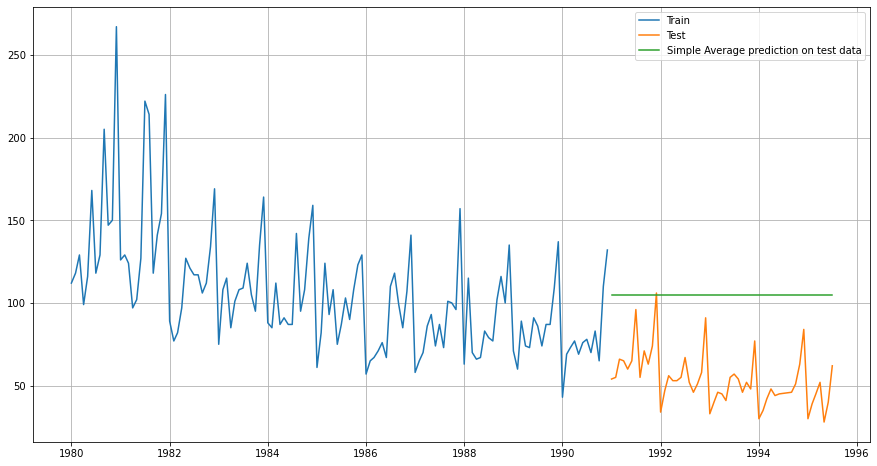

In [175]:
plt.plot(Simp_Avg_rose_train["Rose"], label = "Train")
plt.plot(Simp_Avg_rose_test["Rose"], label = "Test")
plt.plot(Simp_Avg_rose_test["Mean_forecast"], label = "Simple Average prediction on test data")
plt.legend(loc = "best")
plt.grid();

In [176]:
rmse_rose_test_simp_avg = metrics.mean_squared_error(Simp_Avg_rose_test["Rose"],Simp_Avg_rose_test["Mean_forecast"], squared = False)

In [177]:
rmse_rose_test_simp_avg

53.460569646114436

In [178]:
MAPE_rose_simp_avg = MAPE(Simp_Avg_rose_test["Rose"],Simp_Avg_rose_test["Mean_forecast"])

In [179]:
MAPE_rose_simp_avg

94.93

In [180]:
resultsDF_rose_simp_avg = pd.DataFrame({"RMSE_Test":(rmse_rose_test_simp_avg),
                                  "MAPE":(MAPE_rose_simp_avg)
                                  }, index = ["Simple Average Model"])

In [181]:
resultsDF_rose_simp_avg

,RMSE_Test,MAPE
Simple Average Model,53.46057,94.93


In [182]:
resultsDF_rose = pd.concat([resultsDF_rose,resultsDF_rose_simp_avg])

In [183]:
resultsDF_rose

,RMSE_Test,MAPE
"Simple Exponential Smoothing, alpha = 0.098",36.796227,63.88
"Simple Exponential Smoothing, alpha = 0.07",36.435772,63.22
"Double Exponential Smoothing, alpha = 0.017, beta = 0.000032",15.707052,24.12
"Double Exponential Smoothing, alpha = 0.04, beta = 0.47",14.560058,19.94
"Triple Exponential Smoothing (Multiplicative), alpha = 0.0768, beta = 0.0549, gamma = 0.409",17.739019,29.28
"Triple Exponential Multiplicaticve Smoothing, alpha = 0.2, beta = 0.8, gamma = 0.2",9.086461,12.48
Linear Regression,15.268955,22.82
Naive Model,79.718773,145.10
Simple Average Model,53.460570,94.93


**Moving Average model**

In [184]:
Moving_Average_rose = rose_df.copy()

In [185]:
Moving_Average_rose.head()

,Rose
YearMonth,
1980-01-01,112.0
1980-02-01,118.0
1980-03-01,129.0
1980-04-01,99.0
1980-05-01,116.0


In [186]:
Moving_Average_rose["Trailing_2"] = Moving_Average_rose["Rose"].rolling(2).mean()
Moving_Average_rose["Trailing_4"] = Moving_Average_rose["Rose"].rolling(4).mean()
Moving_Average_rose["Trailing_6"] = Moving_Average_rose["Rose"].rolling(6).mean()
Moving_Average_rose["Trailing_9"] = Moving_Average_rose["Rose"].rolling(9).mean()

In [187]:
Moving_Average_rose.head()

,Rose,Trailing_2,Trailing_4,Trailing_6,Trailing_9
YearMonth,,,,,
1980-01-01,112.0,NaN,NaN,NaN,NaN
1980-02-01,118.0,115.0,NaN,NaN,NaN
1980-03-01,129.0,123.5,NaN,NaN,NaN
1980-04-01,99.0,114.0,114.5,NaN,NaN
1980-05-01,116.0,107.5,115.5,NaN,NaN


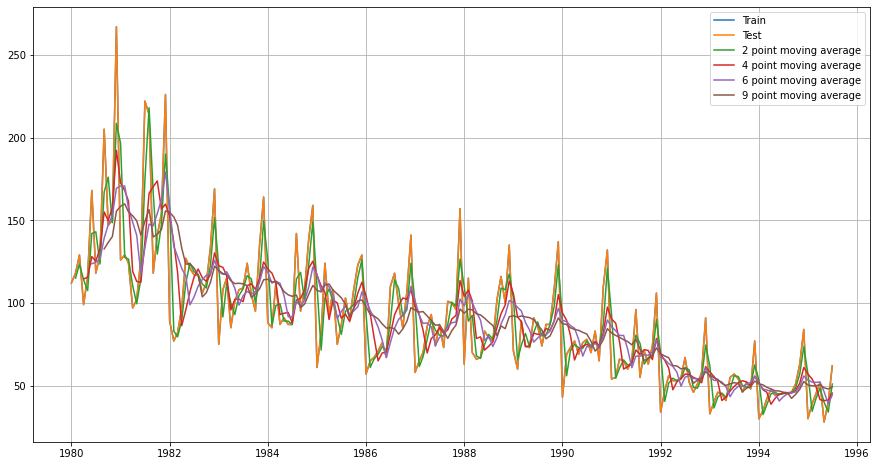

In [188]:
plt.plot(Moving_Average_rose["Rose"], label = "Train")
plt.plot(Moving_Average_rose["Rose"], label = "Test")
plt.plot(Moving_Average_rose["Trailing_2"], label = "2 point moving average")
plt.plot(Moving_Average_rose["Trailing_4"], label = "4 point moving average")
plt.plot(Moving_Average_rose["Trailing_6"], label = "6 point moving average")
plt.plot(Moving_Average_rose["Trailing_9"], label = "9 point moving average")
plt.legend(loc = "best")
plt.grid();

In [189]:
Trailing_Moving_Average_rose_train = Moving_Average_rose[Moving_Average_rose.index<"1991"]
Trailing_Moving_Average_rose_test = Moving_Average_rose[Moving_Average_rose.index>="1991"]

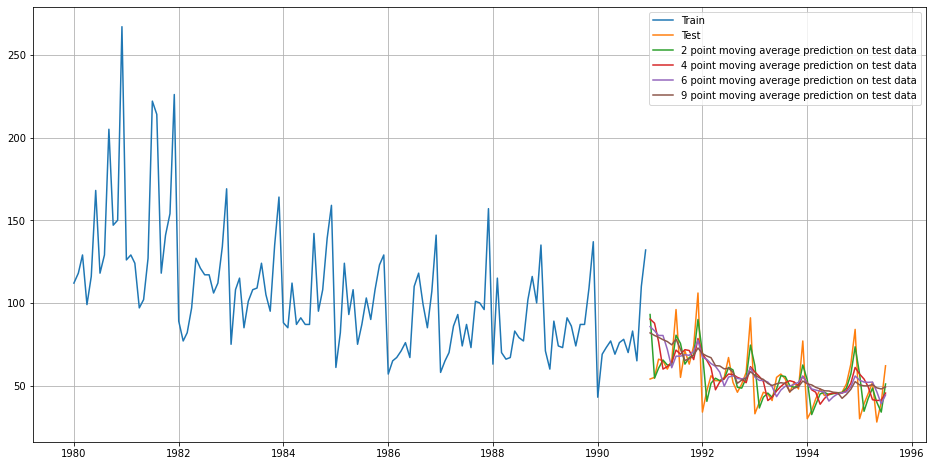

In [190]:
plt.figure(figsize=(16,8))
plt.plot(Trailing_Moving_Average_rose_train["Rose"], label = "Train")
plt.plot(Trailing_Moving_Average_rose_test["Rose"], label = "Test")
plt.plot(Trailing_Moving_Average_rose_test["Trailing_2"], label = "2 point moving average prediction on test data")
plt.plot(Trailing_Moving_Average_rose_test["Trailing_4"], label = "4 point moving average prediction on test data")
plt.plot(Trailing_Moving_Average_rose_test["Trailing_6"], label = "6 point moving average prediction on test data")
plt.plot(Trailing_Moving_Average_rose_test["Trailing_9"], label = "9 point moving average prediction on test data")
plt.legend(loc = "best")
plt.grid();

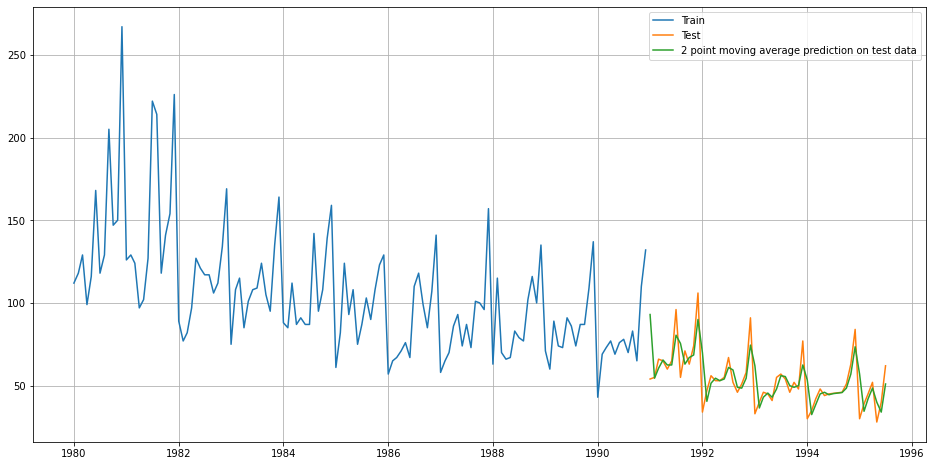

In [191]:
plt.figure(figsize=(16,8))
plt.plot(Trailing_Moving_Average_rose_train["Rose"], label = "Train")
plt.plot(Trailing_Moving_Average_rose_test["Rose"], label = "Test")
plt.plot(Trailing_Moving_Average_rose_test["Trailing_2"], label = "2 point moving average prediction on test data")
plt.legend(loc = "best")
plt.grid();

In [192]:
rmse_rose_test_moving_avg_2 = metrics.mean_squared_error(Trailing_Moving_Average_rose_test["Rose"],Trailing_Moving_Average_rose_test["Trailing_2"], squared = False)

In [193]:
rmse_rose_test_moving_avg_2

11.52927761935857

In [194]:
MAPE_rose_mving_avg_2 = MAPE(Trailing_Moving_Average_rose_test["Rose"],Trailing_Moving_Average_rose_test["Trailing_2"])

In [195]:
MAPE_rose_mving_avg_2

13.54

In [196]:
resultsDF_rose_moving_avg_2 = pd.DataFrame({"RMSE_Test":(rmse_rose_test_moving_avg_2),
                                  "MAPE":(MAPE_rose_mving_avg_2)
                                  }, index = ["2 point moving average"])

In [197]:
resultsDF_rose_moving_avg_2 

,RMSE_Test,MAPE
2 point moving average,11.529278,13.54


In [198]:
resultsDF_rose = pd.concat([resultsDF_rose,resultsDF_rose_moving_avg_2])

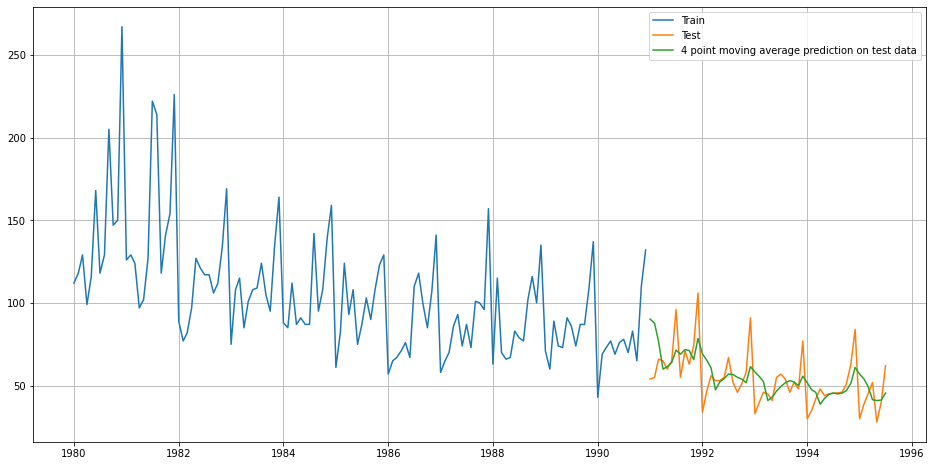

In [199]:
plt.figure(figsize=(16,8))
plt.plot(Trailing_Moving_Average_rose_train["Rose"], label = "Train")
plt.plot(Trailing_Moving_Average_rose_test["Rose"], label = "Test")
plt.plot(Trailing_Moving_Average_rose_test["Trailing_4"], label = "4 point moving average prediction on test data")
plt.legend(loc = "best")
plt.grid();

In [200]:
rmse_rose_test_moving_avg_4 = metrics.mean_squared_error(Trailing_Moving_Average_rose_test["Rose"],Trailing_Moving_Average_rose_test["Trailing_4"], squared = False)

In [201]:
rmse_rose_test_moving_avg_4

14.451403238286431

In [202]:
MAPE_rose_mving_avg_4 = MAPE(Trailing_Moving_Average_rose_test["Rose"],Trailing_Moving_Average_rose_test["Trailing_4"])

In [203]:
MAPE_rose_mving_avg_4

19.49

In [204]:
resultsDF_rose_moving_avg_4 = pd.DataFrame({"RMSE_Test":(rmse_rose_test_moving_avg_4),
                                  "MAPE":(MAPE_rose_mving_avg_4)
                                  }, index = ["4 point moving average"])

In [205]:
resultsDF_rose_moving_avg_4

,RMSE_Test,MAPE
4 point moving average,14.451403,19.49


In [206]:
resultsDF_rose = pd.concat([resultsDF_rose,resultsDF_rose_moving_avg_4])

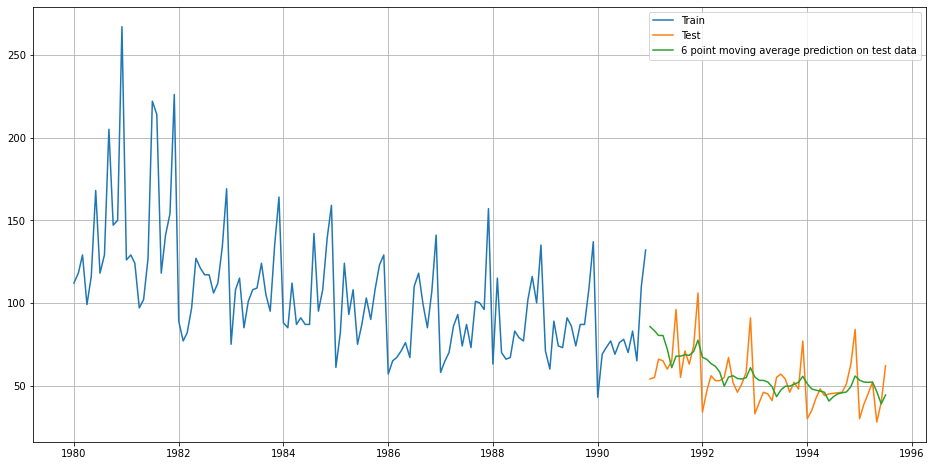

In [207]:
plt.figure(figsize=(16,8))
plt.plot(Trailing_Moving_Average_rose_train["Rose"], label = "Train")
plt.plot(Trailing_Moving_Average_rose_test["Rose"], label = "Test")
plt.plot(Trailing_Moving_Average_rose_test["Trailing_6"], label = "6 point moving average prediction on test data")
plt.legend(loc = "best")
plt.grid();

In [208]:
rmse_rose_test_moving_avg_6 = metrics.mean_squared_error(Trailing_Moving_Average_rose_test["Rose"],Trailing_Moving_Average_rose_test["Trailing_6"], squared = False)

In [209]:
rmse_rose_test_moving_avg_6

14.566327265691354

In [210]:
MAPE_rose_mving_avg_6 = MAPE(Trailing_Moving_Average_rose_test["Rose"],Trailing_Moving_Average_rose_test["Trailing_6"])

In [211]:
MAPE_rose_mving_avg_6 

20.82

In [212]:
resultsDF_rose_moving_avg_6 = pd.DataFrame({"RMSE_Test":(rmse_rose_test_moving_avg_6),
                                  "MAPE":(MAPE_rose_mving_avg_6)
                                  }, index = ["6 point moving average"])

In [213]:
resultsDF_rose_moving_avg_6

,RMSE_Test,MAPE
6 point moving average,14.566327,20.82


In [214]:
resultsDF_rose = pd.concat([resultsDF_rose,resultsDF_rose_moving_avg_6])

In [215]:
rmse_rose_test_moving_avg_9 = metrics.mean_squared_error(Trailing_Moving_Average_rose_test["Rose"],Trailing_Moving_Average_rose_test["Trailing_9"], squared = False)

In [216]:
rmse_rose_test_moving_avg_9

14.727629822363193

In [217]:
MAPE_rose_mving_avg_9 = MAPE(Trailing_Moving_Average_rose_test["Rose"],Trailing_Moving_Average_rose_test["Trailing_9"])

In [218]:
MAPE_rose_mving_avg_9

21.01

In [219]:
resultsDF_rose_moving_avg_9 = pd.DataFrame({"RMSE_Test":(rmse_rose_test_moving_avg_9),
                                  "MAPE":(MAPE_rose_mving_avg_9)
                                  }, index = ["9 point moving average"])

In [220]:
resultsDF_rose_moving_avg_9

,RMSE_Test,MAPE
9 point moving average,14.72763,21.01


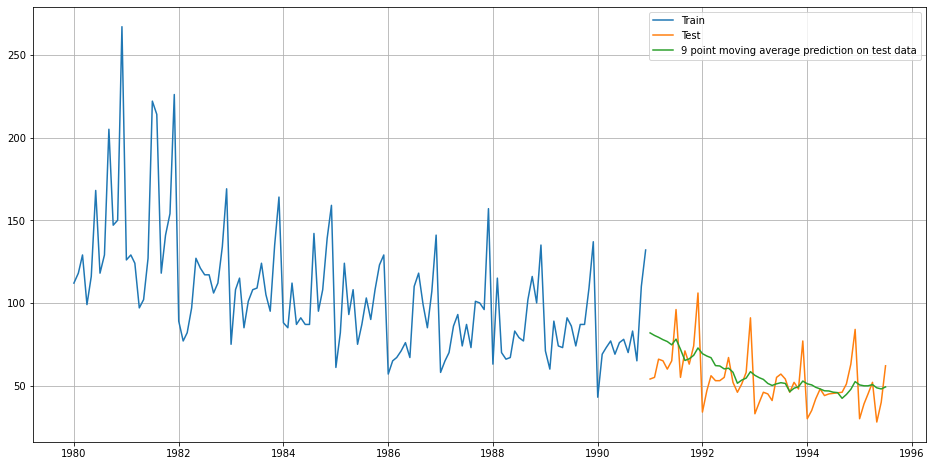

In [221]:
plt.figure(figsize=(16,8))
plt.plot(Trailing_Moving_Average_rose_train["Rose"], label = "Train")
plt.plot(Trailing_Moving_Average_rose_test["Rose"], label = "Test")
plt.plot(Trailing_Moving_Average_rose_test["Trailing_9"], label = "9 point moving average prediction on test data")
plt.legend(loc = "best")
plt.grid();

In [222]:
resultsDF_rose = pd.concat([resultsDF_rose,resultsDF_rose_moving_avg_9])

In [223]:
resultsDF_rose

,RMSE_Test,MAPE
"Simple Exponential Smoothing, alpha = 0.098",36.796227,63.88
"Simple Exponential Smoothing, alpha = 0.07",36.435772,63.22
"Double Exponential Smoothing, alpha = 0.017, beta = 0.000032",15.707052,24.12
"Double Exponential Smoothing, alpha = 0.04, beta = 0.47",14.560058,19.94
"Triple Exponential Smoothing (Multiplicative), alpha = 0.0768, beta = 0.0549, gamma = 0.409",17.739019,29.28
"Triple Exponential Multiplicaticve Smoothing, alpha = 0.2, beta = 0.8, gamma = 0.2",9.086461,12.48
Linear Regression,15.268955,22.82
Naive Model,79.718773,145.10
Simple Average Model,53.460570,94.93
2 point moving average,11.529278,13.54


**5. Check for the stationarity of the data on which the model is being built on using appropriate statistical tests and also mention the hypothesis for the statistical test. If the data is found to be non-stationary, take appropriate steps to make it stationary. Check the new data for stationarity and comment.
Note: Stationarity should be checked at alpha = 0.05.**

To check for Stationarity, we will be performing the Augmented Dickey Fuller test

In [224]:
#importing the test from the statsmodel library
from statsmodels.tsa.stattools import adfuller

In [225]:
#Function to check for stationarity
def test_stationarity(timeseries):
    
    #Determing rolling statistics
    rolmean = timeseries.rolling(window=7).mean()
    rolstd = timeseries.rolling(window=7).std()

    #Plot rolling statistics:
    orig = plt.plot(timeseries, color='blue',label='Original')
    mean = plt.plot(rolmean, color='red', label='Rolling Mean')
    std = plt.plot(rolstd, color='black', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block=False)
    
    #Perform Dickey-Fuller test:
    print ('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print (dfoutput,'\n')

**Null Hypothesis Ho - The time series has a unit root and thus non-stationary.**

**Alternate Hypothesis Ha - The time series does not have a unit root and thus is stationary.**

Level of Significance - α -0.05

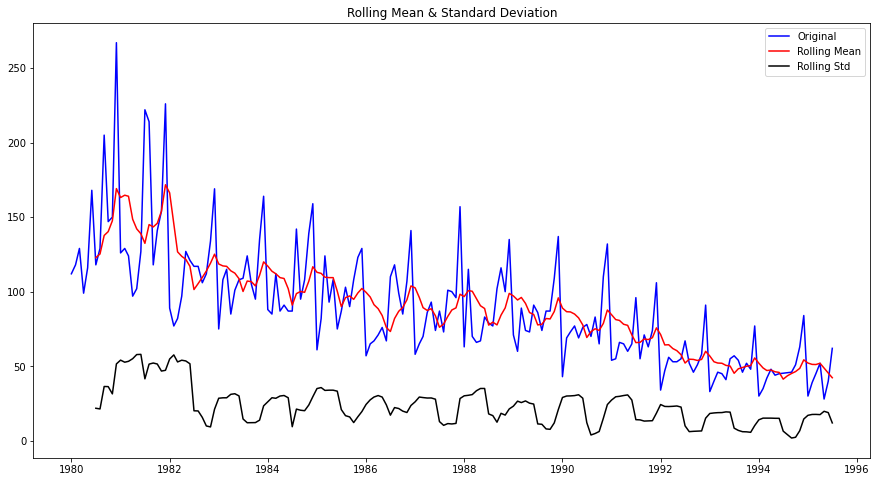

Results of Dickey-Fuller Test:
Test Statistic                  -1.876699
p-value                          0.343101
#Lags Used                      13.000000
Number of Observations Used    173.000000
Critical Value (1%)             -3.468726
Critical Value (5%)             -2.878396
Critical Value (10%)            -2.575756
dtype: float64 



In [226]:
test_stationarity(rose_df["Rose"])

**The p value (0.343) is more than α (0.05), the significance level.**

**So we fail to rejct the null hypothesis that the time series data is non-stationary,and hence we need to continue with the difference to make the time-series data stationary.**

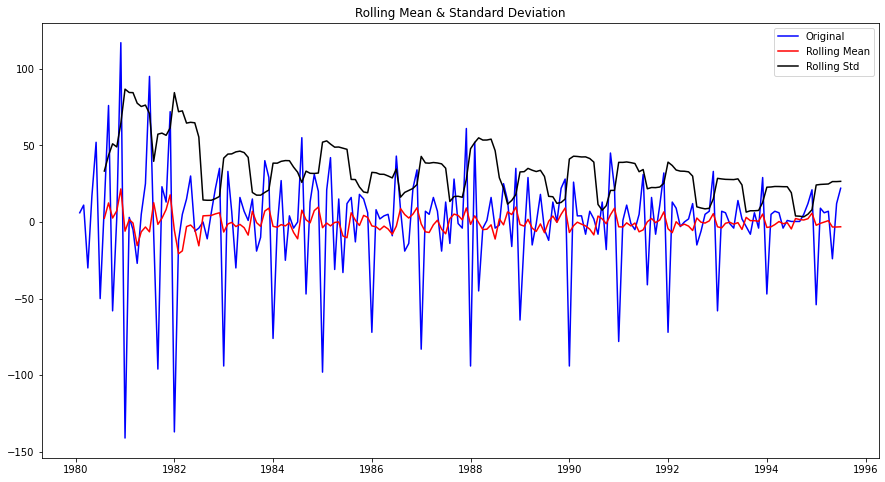

Results of Dickey-Fuller Test:
Test Statistic                -8.044392e+00
p-value                        1.810895e-12
#Lags Used                     1.200000e+01
Number of Observations Used    1.730000e+02
Critical Value (1%)           -3.468726e+00
Critical Value (5%)           -2.878396e+00
Critical Value (10%)          -2.575756e+00
dtype: float64 



In [227]:
test_stationarity(rose_df["Rose"].diff().dropna())

**After performing the difference, the value of p (1.81e-12) is less than the α (0.05), the significance level.**

**Hence we reject the null hypothesis that the time-series data is non-stationary, and accepth the alternate hypothesis that the time-series data is stationary.  We have proved that the time series data is stationary at the first difference.**

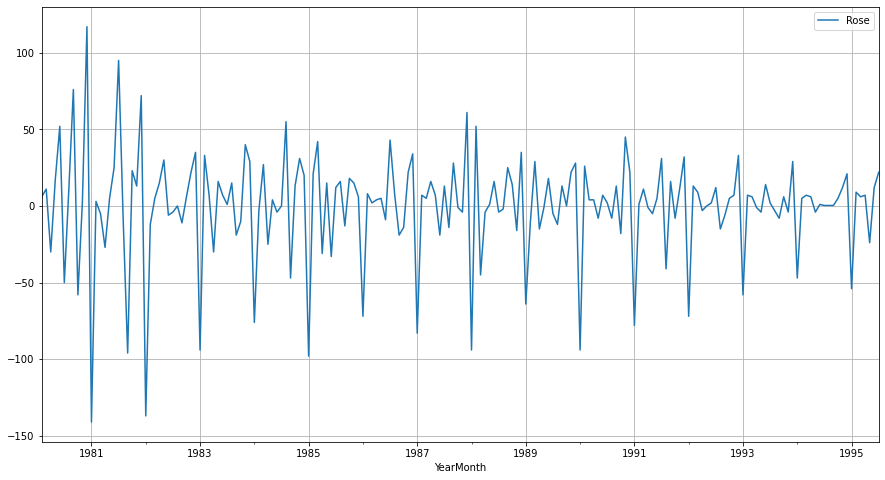

In [228]:
rose_df.diff().dropna().plot(grid = True);

Let us check the stationarity for the training data also.

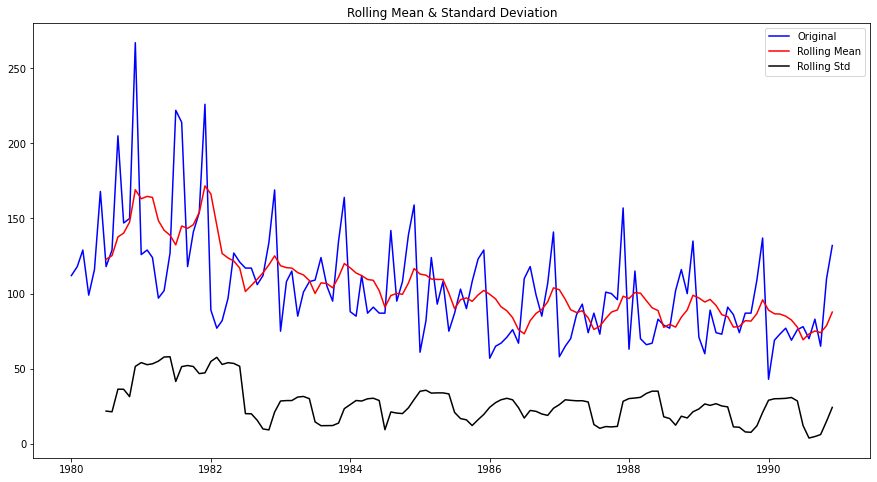

Results of Dickey-Fuller Test:
Test Statistic                  -2.164250
p-value                          0.219476
#Lags Used                      13.000000
Number of Observations Used    118.000000
Critical Value (1%)             -3.487022
Critical Value (5%)             -2.886363
Critical Value (10%)            -2.580009
dtype: float64 



In [229]:
test_stationarity(rose_train["Rose"])

**The p value (0.219) is more than α (0.05), the significance level.**

**So we fail to rejct the null hypothesis that the time series data is non-stationary,and hence we need to continue with the difference to make the time-series data stationary.**

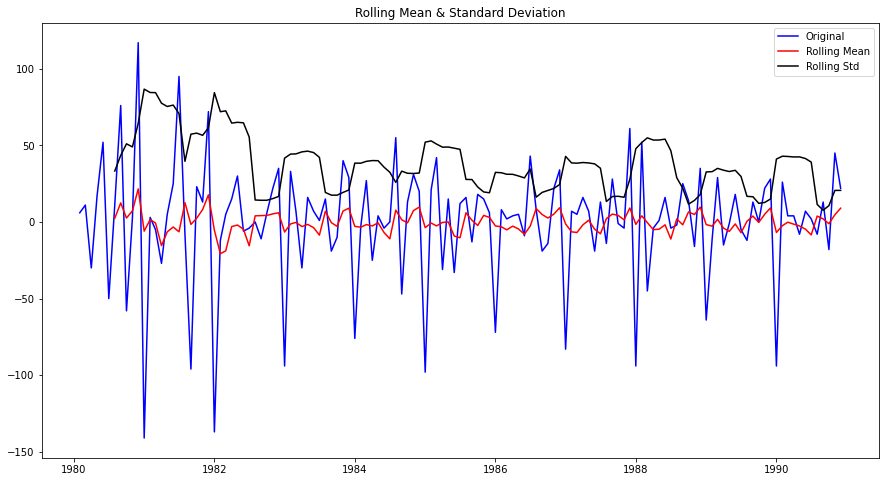

Results of Dickey-Fuller Test:
Test Statistic                -6.592372e+00
p-value                        7.061944e-09
#Lags Used                     1.200000e+01
Number of Observations Used    1.180000e+02
Critical Value (1%)           -3.487022e+00
Critical Value (5%)           -2.886363e+00
Critical Value (10%)          -2.580009e+00
dtype: float64 



In [230]:
test_stationarity(rose_train["Rose"].diff().dropna())

**After performing the difference, the value of p (7.06e-09) is less than the α (0.05), the significance level.**

**Hence we reject the null hypothesis that the time-series data is non-stationary, and accepth the alternate hypothesis that the time-series data is stationary.  We have proved that the time series data is stationary at the first difference.**

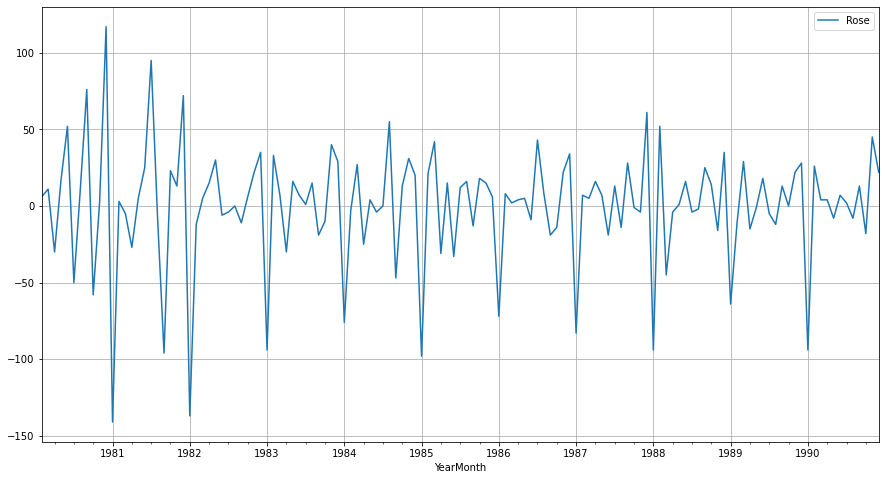

In [231]:
rose_train.diff().dropna().plot(grid = True);

**6. Build an automated version of the ARIMA/SARIMA model in which the parameters are selected using the lowest Akaike Information Criteria (AIC) on the training data and evaluate this model on the test data using RMSE.**

**ARIMA model using lowest AIC value**

In [232]:
Arima_rose_train = rose_train.copy()
Arima_rose_test = rose_test.copy()

**Null Hypothesis Ho - The time series has a unit root and thus non-stationary.**

**Alternate Hypothesis Ha - The time series does not have a unit root and thus is stationary.**

Level of Significance - α = 0.05

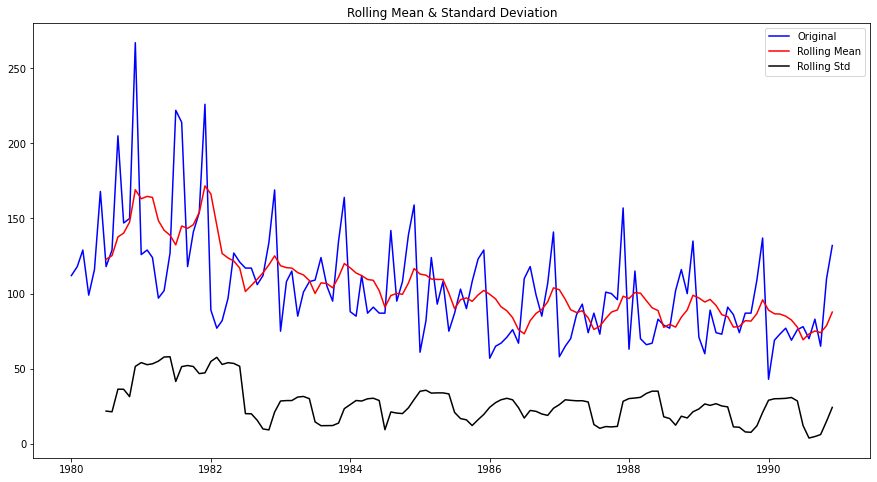

Results of Dickey-Fuller Test:
Test Statistic                  -2.164250
p-value                          0.219476
#Lags Used                      13.000000
Number of Observations Used    118.000000
Critical Value (1%)             -3.487022
Critical Value (5%)             -2.886363
Critical Value (10%)            -2.580009
dtype: float64 



In [233]:
test_stationarity(Arima_rose_train["Rose"])

**The p value (0.219) is more than α (0.05), the significance level.**

**So we fail to rejct the null hypothesis that the time series data is non-stationary,and hence we need to continue with the difference to make the time-series data stationary.**

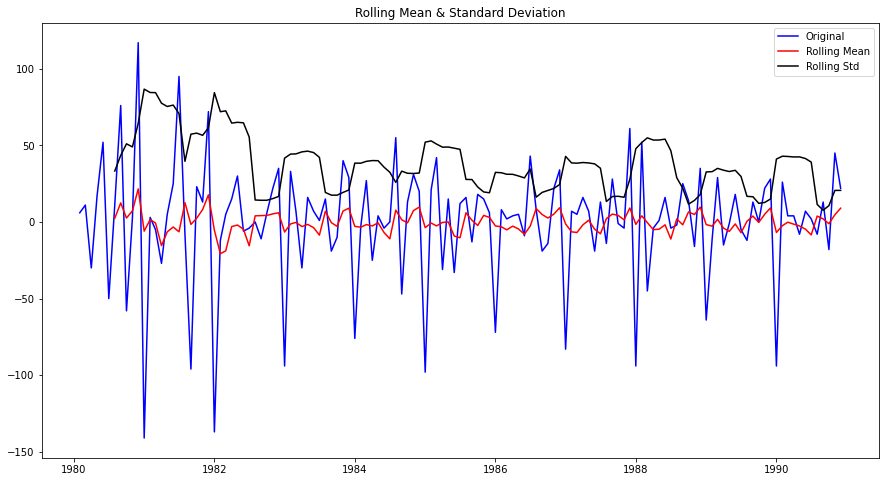

Results of Dickey-Fuller Test:
Test Statistic                -6.592372e+00
p-value                        7.061944e-09
#Lags Used                     1.200000e+01
Number of Observations Used    1.180000e+02
Critical Value (1%)           -3.487022e+00
Critical Value (5%)           -2.886363e+00
Critical Value (10%)          -2.580009e+00
dtype: float64 



In [234]:
test_stationarity(Arima_rose_train["Rose"].diff().dropna())

**After performing the difference, the value of p (7.061e-09) is less than the α (0.05), the significance level.**

**Hence we reject the null hypothesis that the time-series data is non-stationary, and accepth the alternate hypothesis that the time-series data is stationary.  We have proved that the time series data is stationary at the first difference.**

<AxesSubplot:xlabel='YearMonth'>

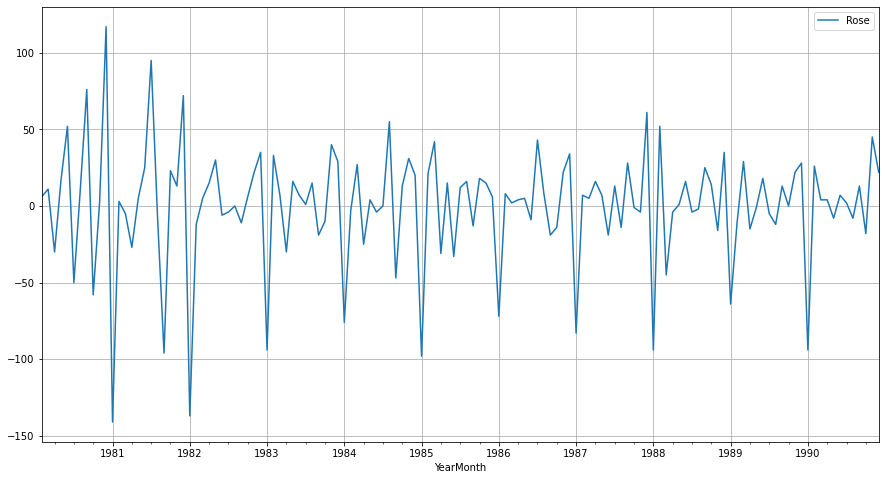

In [235]:
Arima_rose_train.diff().dropna().plot(grid = True)

In [236]:
#importing autocorrelation and partial autocorrelation plot from statsmodel library
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

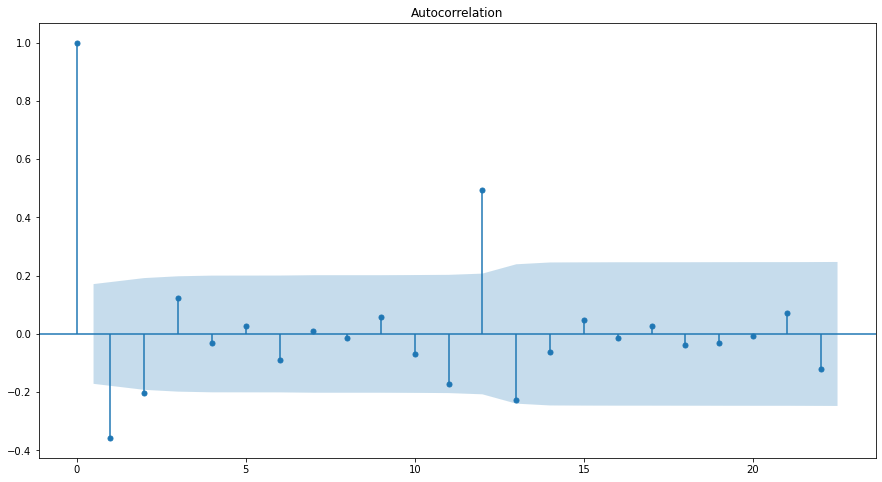

In [237]:
plot_acf(Arima_rose_train.diff().dropna(), alpha = 0.05);

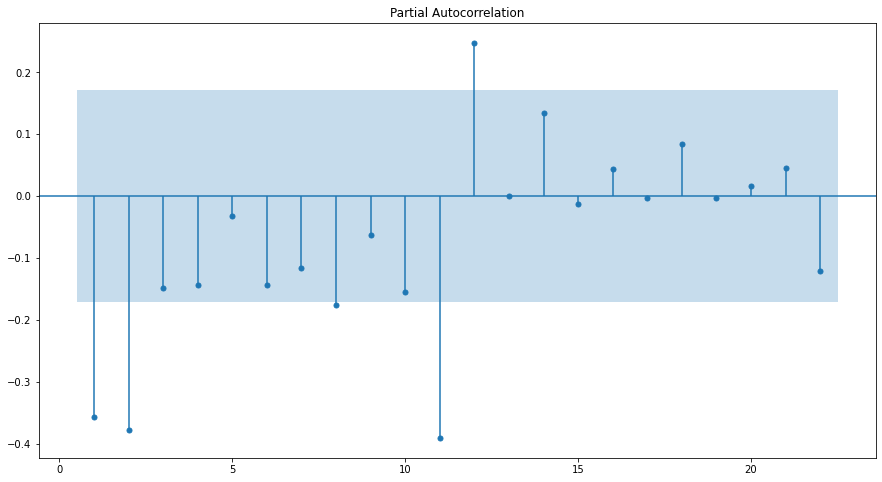

In [238]:
plot_pacf(Arima_rose_train.diff().dropna(), zero =False, alpha = 0.05, method = "ywmle");

In [239]:
import itertools

In [240]:
p = range(0,3)
q = range(0,3)
d = range(1,2)

In [241]:
pdq = list(itertools.product(p, d, q))
print("Examples")
for i in range(0,len(pdq)):
    print("Model:{}".format(pdq[i]))

Examples
Model:(0, 1, 0)
Model:(0, 1, 1)
Model:(0, 1, 2)
Model:(1, 1, 0)
Model:(1, 1, 1)
Model:(1, 1, 2)
Model:(2, 1, 0)
Model:(2, 1, 1)
Model:(2, 1, 2)


In [242]:
ARIMA_AIC_rose = pd.DataFrame(columns = ["param","AIC"])
ARIMA_AIC_rose

,param,AIC


In [243]:
#importing the Arima Model
from statsmodels.tsa.arima.model import ARIMA

In [244]:
for param in pdq:
    ARIMA_model_rose_12 = ARIMA(Arima_rose_train["Rose"], order= param).fit()
    print("ARIMA{} - AIC: {}".format(param, ARIMA_model_rose_12.aic))
    ARIMA_AIC_rose = ARIMA_AIC_rose.append({"param": param,
                                            "AIC" : ARIMA_model_rose_12.aic
                                           }, ignore_index = True)

ARIMA(0, 1, 0) - AIC: 1333.1546729124348


C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'
C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'
C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'
C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'
C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No fr

ARIMA(0, 1, 1) - AIC: 1282.3098319748312
ARIMA(0, 1, 2) - AIC: 1279.6715288535806
ARIMA(1, 1, 0) - AIC: 1317.3503105381492

C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'
C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'
C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'
C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'
C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No fr


ARIMA(1, 1, 1) - AIC: 1280.5742295380064


C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'
C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'
C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'
C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'
C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No fr

ARIMA(1, 1, 2) - AIC: 1279.8707234231922
ARIMA(2, 1, 0) - AIC: 1298.6110341605004


C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'
C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'
C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'
C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'
C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No fr

ARIMA(2, 1, 1) - AIC: 1281.5078621868543


C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'
C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'
C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'


ARIMA(2, 1, 2) - AIC: 1281.8707222264356


In [245]:
ARIMA_AIC_rose.sort_values(by = "AIC", ascending = True).head()

,param,AIC
2,"(0, 1, 2)",1279.671529
5,"(1, 1, 2)",1279.870723
4,"(1, 1, 1)",1280.574230
7,"(2, 1, 1)",1281.507862
8,"(2, 1, 2)",1281.870722


In [246]:
auto_ARIMA_rose = ARIMA(Arima_rose_train["Rose"], order = (0,1,2))
results_auto_ARIMA_rose = auto_ARIMA_rose.fit()

C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'
C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'
C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'


In [247]:
print(results_auto_ARIMA_rose.summary())

                               SARIMAX Results                                
Dep. Variable:                   Rose   No. Observations:                  132
Model:                 ARIMA(0, 1, 2)   Log Likelihood                -636.836
Date:                Sun, 01 May 2022   AIC                           1279.672
Time:                        10:16:58   BIC                           1288.297
Sample:                    01-01-1980   HQIC                          1283.176
                         - 12-01-1990                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.6970      0.072     -9.689      0.000      -0.838      -0.556
ma.L2         -0.2042      0.073     -2.794      0.005      -0.347      -0.061
sigma2       965.8407     88.305     10.938      0.0

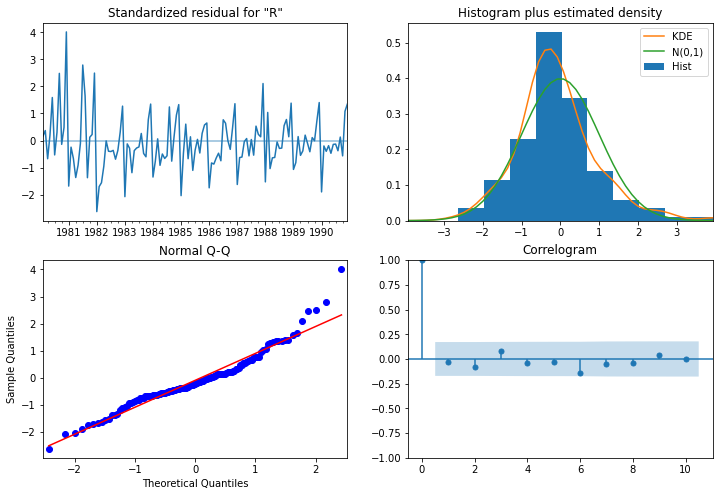

In [248]:
results_auto_ARIMA_rose.plot_diagnostics(figsize = (12,8));

In [249]:
rose_test_pred_Arima_12 = results_auto_ARIMA_rose.forecast(steps = len(Arima_rose_test))

In [250]:
rose_test_pred_Arima_12.head()

1991-01-01    96.026636
1991-02-01    87.495114
1991-03-01    87.495114
1991-04-01    87.495114
1991-05-01    87.495114
Freq: MS, Name: predicted_mean, dtype: float64

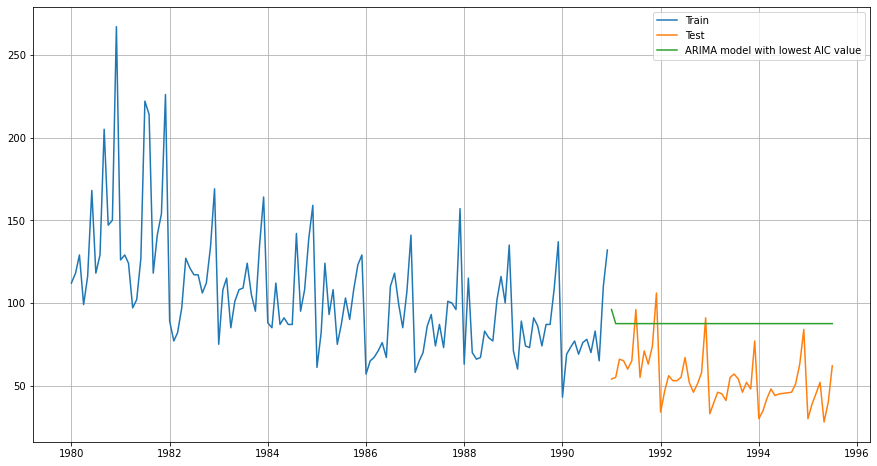

In [251]:
plt.plot(Arima_rose_train["Rose"], label = "Train")
plt.plot(Arima_rose_test["Rose"], label = "Test")
plt.plot(rose_test_pred_Arima_12, label = "ARIMA model with lowest AIC value")
plt.legend(loc = "best")
plt.grid();

In [252]:
rmse_rose_test_Arima_12 = metrics.mean_squared_error(Arima_rose_test["Rose"],rose_test_pred_Arima_12, squared = False)

In [253]:
rmse_rose_test_Arima_12

37.30647971852104

In [254]:
MAPE_rose_Arima_12 = MAPE(Arima_rose_test["Rose"],rose_test_pred_Arima_12)

In [255]:
MAPE_rose_Arima_12

64.81

In [256]:
resultsDF_rose_Arima_12 = pd.DataFrame({"RMSE_Test":(rmse_rose_test_Arima_12),
                                  "MAPE":(MAPE_rose_Arima_12)
                                  }, index = ["ARIMA model using lowest AIC value parameters (0,1,2)"])

In [257]:
resultsDF_rose_Arima_12

,RMSE_Test,MAPE
"ARIMA model using lowest AIC value parameters (0,1,2)",37.30648,64.81


In [258]:
resultsDF_rose = pd.concat([resultsDF_rose,resultsDF_rose_Arima_12])

In [259]:
resultsDF_rose

,RMSE_Test,MAPE
"Simple Exponential Smoothing, alpha = 0.098",36.796227,63.88
"Simple Exponential Smoothing, alpha = 0.07",36.435772,63.22
"Double Exponential Smoothing, alpha = 0.017, beta = 0.000032",15.707052,24.12
"Double Exponential Smoothing, alpha = 0.04, beta = 0.47",14.560058,19.94
"Triple Exponential Smoothing (Multiplicative), alpha = 0.0768, beta = 0.0549, gamma = 0.409",17.739019,29.28
"Triple Exponential Multiplicaticve Smoothing, alpha = 0.2, beta = 0.8, gamma = 0.2",9.086461,12.48
Linear Regression,15.268955,22.82
Naive Model,79.718773,145.10
Simple Average Model,53.460570,94.93
2 point moving average,11.529278,13.54


**SARIMA model using lowest AIC value**

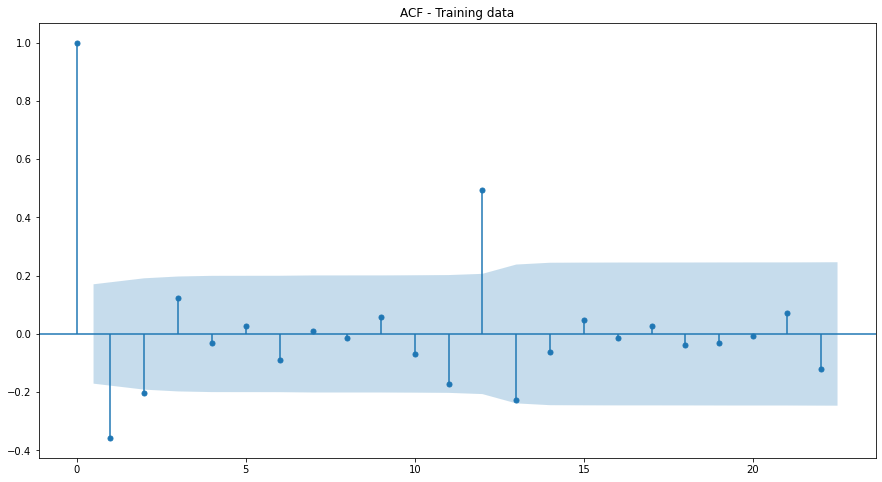

In [260]:
#Checking the acf plots for the training data
plot_acf(Arima_rose_train.diff(), title = "ACF - Training data", missing = "drop");

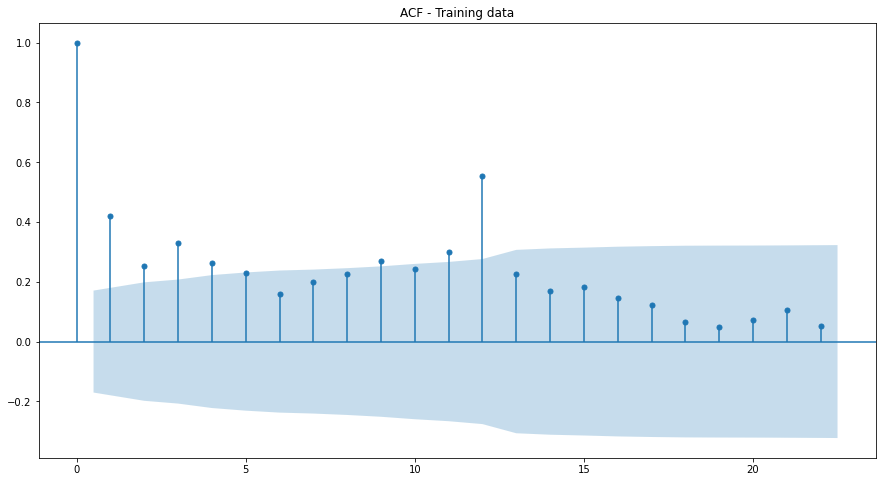

In [261]:
#Checking the acf plots for the training data
plot_acf(Arima_rose_train, title = "ACF - Training data", missing = "drop");

In [262]:
p = range(0,3)
q = range(0,3)
d = range(1,2)
D = range(0,2)

In [263]:
pdq = list(itertools.product(p,d,q))
PDQ = [(x[0],x[1],x[2],12) for x in list(itertools.product(p,D,q))]
print("Examples")
for i in range (1, len(pdq)):
    print("Model : {} {}".format(pdq[i], PDQ[i]))

Examples
Model : (0, 1, 1) (0, 0, 1, 12)
Model : (0, 1, 2) (0, 0, 2, 12)
Model : (1, 1, 0) (0, 1, 0, 12)
Model : (1, 1, 1) (0, 1, 1, 12)
Model : (1, 1, 2) (0, 1, 2, 12)
Model : (2, 1, 0) (1, 0, 0, 12)
Model : (2, 1, 1) (1, 0, 1, 12)
Model : (2, 1, 2) (1, 0, 2, 12)


In [264]:
SARIMA_AIC_rose = pd.DataFrame(columns = ["param","seasonal","AIC"])

In [265]:
SARIMA_AIC_rose

,param,seasonal,AIC


In [266]:
#impoting necessary library for performing the seasonal ARIMA model
import statsmodels.api as sm

In [267]:
for param in pdq:
    for param_seasonal in PDQ:
        Sarima_model_13 = sm.tsa.statespace.SARIMAX(Arima_rose_train["Rose"].values,
                                                    order = param, seasonal_order = param_seasonal,
                                                    enforce_stationarity = False, 
                                                    enforce_invertibility= False)
        results_Sarima_model_rose = Sarima_model_13.fit(maxiter = 1000)
        print("SARIMA {} X {}12 - AIC : {}".format(param, param_seasonal,results_Sarima_model_rose.aic ))
        SARIMA_AIC_rose = SARIMA_AIC_rose.append({"param": param,
                                                  "seasonal" : param_seasonal, 
                                                  "AIC" : results_Sarima_model_rose.aic
                                                 }, ignore_index = True)

SARIMA (0, 1, 0) X (0, 0, 0, 12)12 - AIC : 1323.9657875279158
SARIMA (0, 1, 0) X (0, 0, 1, 12)12 - AIC : 1145.4230827207175
SARIMA (0, 1, 0) X (0, 0, 2, 12)12 - AIC : 976.4375296380895
SARIMA (0, 1, 0) X (0, 1, 0, 12)12 - AIC : 1171.2013438279514
SARIMA (0, 1, 0) X (0, 1, 1, 12)12 - AIC : 965.5057301644053
SARIMA (0, 1, 0) X (0, 1, 2, 12)12 - AIC : 845.868701477606
SARIMA (0, 1, 0) X (1, 0, 0, 12)12 - AIC : 1139.921738995602
SARIMA (0, 1, 0) X (1, 0, 1, 12)12 - AIC : 1116.0207869386002
SARIMA (0, 1, 0) X (1, 0, 2, 12)12 - AIC : 969.6913635750373
SARIMA (0, 1, 0) X (1, 1, 0, 12)12 - AIC : 982.3269589658807
SARIMA (0, 1, 0) X (1, 1, 1, 12)12 - AIC : 975.3375383601636
SARIMA (0, 1, 0) X (1, 1, 2, 12)12 - AIC : 847.7332182654534
SARIMA (0, 1, 0) X (2, 0, 0, 12)12 - AIC : 960.8812220353041

C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "



SARIMA (0, 1, 0) X (2, 0, 1, 12)12 - AIC : 962.8794540697546
SARIMA (0, 1, 0) X (2, 0, 2, 12)12 - AIC : 955.5735408945867
SARIMA (0, 1, 0) X (2, 1, 0, 12)12 - AIC : 858.5132698374416
SARIMA (0, 1, 0) X (2, 1, 1, 12)12 - AIC : 853.3390729144091
SARIMA (0, 1, 0) X (2, 1, 2, 12)12 - AIC : 842.6282244224136
SARIMA (0, 1, 1) X (0, 0, 0, 12)12 - AIC : 1263.5369097383964
SARIMA (0, 1, 1) X (0, 0, 1, 12)12 - AIC : 1098.5554825918339
SARIMA (0, 1, 1) X (0, 0, 2, 12)12 - AIC : 923.6314049383807
SARIMA (0, 1, 1) X (0, 1, 0, 12)12 - AIC : 1113.7663133563728
SARIMA (0, 1, 1) X (0, 1, 1, 12)12 - AIC : 915.073060671733
SARIMA (0, 1, 1) X (0, 1, 2, 12)12 - AIC : 790.9032809266455
SARIMA (0, 1, 1) X (1, 0, 0, 12)12 - AIC : 1095.793632491795
SARIMA (0, 1, 1) X (1, 0, 1, 12)12 - AIC : 1054.743433094548
SARIMA (0, 1, 1) X (1, 0, 2, 12)12 - AIC : 918.8573483311407
SARIMA (0, 1, 1) X (1, 1, 0, 12)12 - AIC : 944.2456655532176
SARIMA (0, 1, 1) X (1, 1, 1, 12)12 - AIC : 929.3362488520044
SARIMA (0, 1, 1) X (1

SARIMA (2, 1, 2) X (0, 1, 1, 12)12 - AIC : 904.7004130328344
SARIMA (2, 1, 2) X (0, 1, 2, 12)12 - AIC : 784.1409514958576
SARIMA (2, 1, 2) X (1, 0, 0, 12)12 - AIC : 1073.2912713704332
SARIMA (2, 1, 2) X (1, 0, 1, 12)12 - AIC : 1044.1909354771824
SARIMA (2, 1, 2) X (1, 0, 2, 12)12 - AIC : 907.666148879695
SARIMA (2, 1, 2) X (1, 1, 0, 12)12 - AIC : 925.3705668134864
SARIMA (2, 1, 2) X (1, 1, 1, 12)12 - AIC : 915.6932514239375
SARIMA (2, 1, 2) X (1, 1, 2, 12)12 - AIC : 785.8283110198896
SARIMA (2, 1, 2) X (2, 0, 0, 12)12 - AIC : 897.3464441348852
SARIMA (2, 1, 2) X (2, 0, 1, 12)12 - AIC : 898.3781889114674
SARIMA (2, 1, 2) X (2, 0, 2, 12)12 - AIC : 890.6687980804124
SARIMA (2, 1, 2) X (2, 1, 0, 12)12 - AIC : 794.7799442940219
SARIMA (2, 1, 2) X (2, 1, 1, 12)12 - AIC : 783.7036522819554
SARIMA (2, 1, 2) X (2, 1, 2, 12)12 - AIC : 776.9961008321861


In [268]:
SARIMA_AIC_rose.sort_values(by = "AIC", ascending = True).head()

,param,seasonal,AIC
53,"(0, 1, 2)","(2, 1, 2, 12)",774.969120
107,"(1, 1, 2)","(2, 1, 2, 12)",776.940110
161,"(2, 1, 2)","(2, 1, 2, 12)",776.996101
35,"(0, 1, 1)","(2, 1, 2, 12)",782.153872
160,"(2, 1, 2)","(2, 1, 1, 12)",783.703652


In [269]:
auto_SARIMA_rose = sm.tsa.statespace.SARIMAX(Arima_rose_train["Rose"].values,
                                                    order = (0,1,2), seasonal_order = (2,1,2,12),
                                                    enforce_stationarity = False, 
                                                    enforce_invertibility= False)

In [270]:
results_auto_SARIMA_rose = auto_SARIMA_rose.fit(maxiter = 1000)

In [271]:
print(results_auto_SARIMA_rose.summary())

                                     SARIMAX Results                                      
Dep. Variable:                                  y   No. Observations:                  132
Model:             SARIMAX(0, 1, 2)x(2, 1, 2, 12)   Log Likelihood                -380.485
Date:                            Sun, 01 May 2022   AIC                            774.969
Time:                                    10:19:59   BIC                            792.622
Sample:                                         0   HQIC                           782.094
                                            - 132                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.9524      0.184     -5.167      0.000      -1.314      -0.591
ma.L2         -0.0764      0.126   

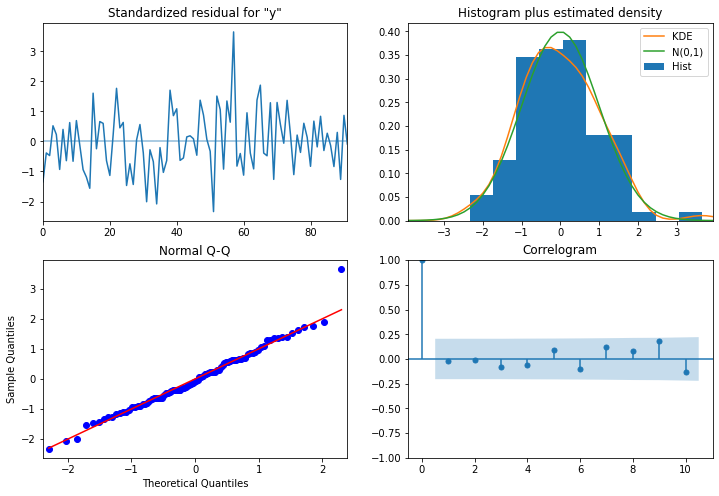

In [272]:
results_auto_SARIMA_rose.plot_diagnostics(figsize = (12,8));

In [273]:
rose_test_pred_Sarima_13 = results_auto_SARIMA_rose.forecast(steps = len(Arima_rose_test))

In [274]:
rose_test_pred_Sarima_13 =pd.DataFrame(rose_test_pred_Sarima_13, index = Arima_rose_test.index)

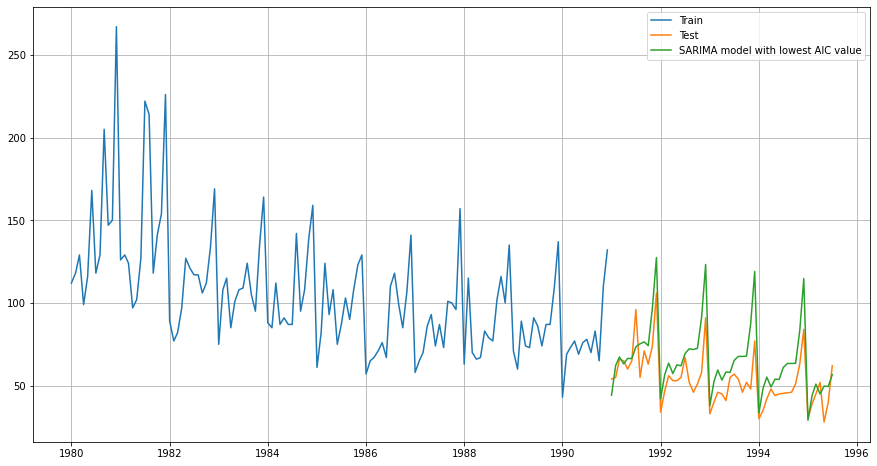

In [275]:
plt.plot(Arima_rose_train["Rose"], label = "Train")
plt.plot(Arima_rose_test["Rose"], label = "Test")
plt.plot(rose_test_pred_Sarima_13, label = "SARIMA model with lowest AIC value")
plt.legend(loc = "best")
plt.grid();

In [276]:
rmse_rose_test_Sarima_13 = metrics.mean_squared_error(Arima_rose_test["Rose"],rose_test_pred_Sarima_13, squared = False)

In [277]:
rmse_rose_test_Sarima_13

16.50056928644648

In [278]:
MAPE_rose_Sarima_13 = MAPE(Arima_rose_test["Rose"],rose_test_pred_Sarima_13)

In [279]:
MAPE_rose_Sarima_13

2167.24

In [280]:
resultsDF_rose_Sarima_13 = pd.DataFrame({"RMSE_Test":(rmse_rose_test_Sarima_13),
                                  "MAPE":(MAPE_rose_Sarima_13)
                                  }, index = ["SARIMA model using lowest AIC value parameters (0,1,2)(2,1,2,12)"])

In [281]:
resultsDF_rose_Sarima_13

,RMSE_Test,MAPE
"SARIMA model using lowest AIC value parameters (0,1,2)(2,1,2,12)",16.500569,2167.24


In [282]:
resultsDF_rose = pd.concat([resultsDF_rose,resultsDF_rose_Sarima_13])

In [283]:
resultsDF_rose

,RMSE_Test,MAPE
"Simple Exponential Smoothing, alpha = 0.098",36.796227,63.88
"Simple Exponential Smoothing, alpha = 0.07",36.435772,63.22
"Double Exponential Smoothing, alpha = 0.017, beta = 0.000032",15.707052,24.12
"Double Exponential Smoothing, alpha = 0.04, beta = 0.47",14.560058,19.94
"Triple Exponential Smoothing (Multiplicative), alpha = 0.0768, beta = 0.0549, gamma = 0.409",17.739019,29.28
"Triple Exponential Multiplicaticve Smoothing, alpha = 0.2, beta = 0.8, gamma = 0.2",9.086461,12.48
Linear Regression,15.268955,22.82
Naive Model,79.718773,145.10
Simple Average Model,53.460570,94.93
2 point moving average,11.529278,13.54


**7. Build ARIMA/SARIMA models based on the cut-off points of ACF and PACF on the training data and evaluate this model on the test data using RMSE.**

**ARIMA model using ACF and PACF plots**

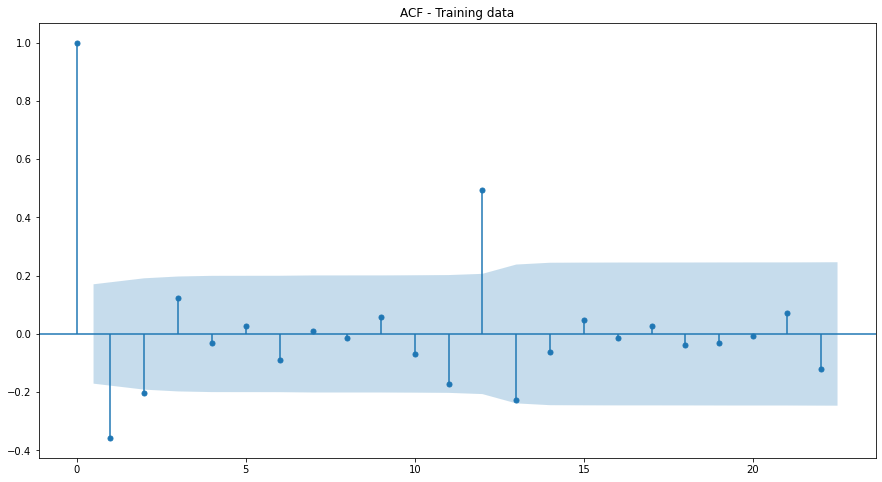

In [284]:
#Checking the acf plots for the training data
plot_acf(Arima_rose_train.diff(), title = "ACF - Training data", missing = "drop");

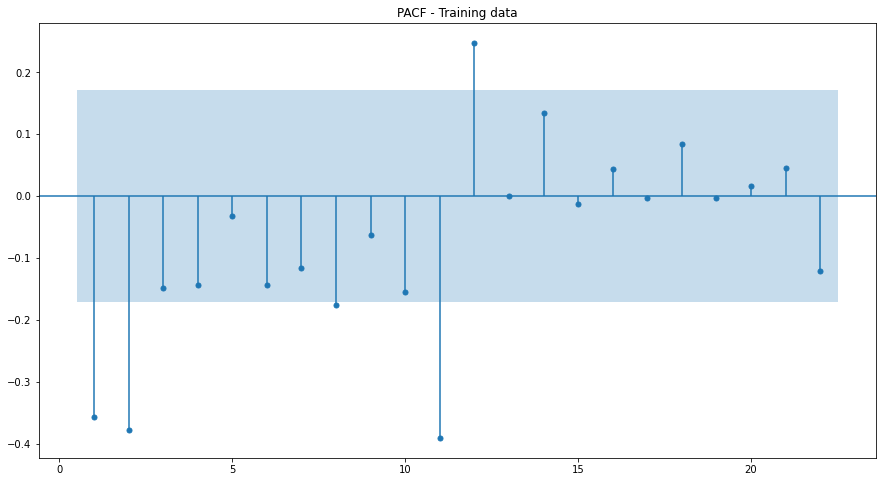

In [285]:
#Checking the pacf plot for the training data
plot_pacf(Arima_rose_train.diff().dropna(), title = "PACF - Training data", zero = False, method = "ywmle");

In [286]:
manual_ARIMA_rose = ARIMA(Arima_rose_train, order = (2,1,2))
results_manual_ARIMA_rose = manual_ARIMA_rose.fit()

C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'
C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'
C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'


In [287]:
print(results_manual_ARIMA_rose.summary())

                               SARIMAX Results                                
Dep. Variable:                   Rose   No. Observations:                  132
Model:                 ARIMA(2, 1, 2)   Log Likelihood                -635.935
Date:                Sun, 01 May 2022   AIC                           1281.871
Time:                        10:20:02   BIC                           1296.247
Sample:                    01-01-1980   HQIC                          1287.712
                         - 12-01-1990                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4540      0.469     -0.969      0.333      -1.372       0.464
ar.L2          0.0001      0.170      0.001      0.999      -0.334       0.334
ma.L1         -0.2541      0.459     -0.554      0.5

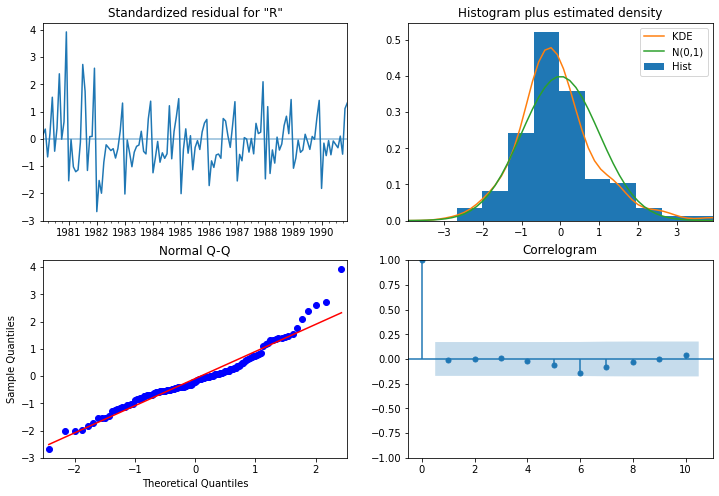

In [288]:
results_manual_ARIMA_rose.plot_diagnostics(figsize = (12,8));

In [289]:
rose_test_pred_Arima_14 = results_manual_ARIMA_rose.forecast(steps = len(Arima_rose_test))

In [290]:
rose_test_pred_Arima_14.head()

1991-01-01    91.159512
1991-02-01    85.314628
1991-03-01    87.962468
1991-04-01    86.759563
1991-05-01    87.306038
Freq: MS, Name: predicted_mean, dtype: float64

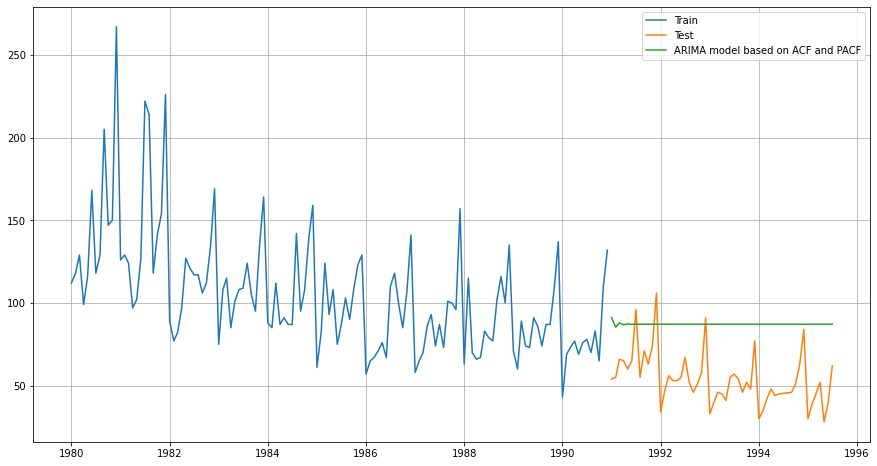

In [291]:
plt.plot(rose_train["Rose"], label = "Train")
plt.plot(rose_test["Rose"], label = "Test")
plt.plot(rose_test_pred_Arima_14, label = "ARIMA model based on ACF and PACF")
plt.legend(loc = "best")
plt.grid();

In [292]:
rmse_rose_test_Arima_14 = metrics.mean_squared_error(Arima_rose_test["Rose"],rose_test_pred_Arima_14, squared = False)

In [293]:
rmse_rose_test_Arima_14

36.87119662052946

In [294]:
MAPE_rose_Arima_14 = MAPE(Arima_rose_test["Rose"],rose_test_pred_Arima_14)

In [295]:
MAPE_rose_Arima_14

64.02

In [296]:
resultsDF_rose_Arima_14 = pd.DataFrame({"RMSE_Test":(rmse_rose_test_Arima_14),
                                  "MAPE":(MAPE_rose_Arima_14)
                                  }, index = ["ARIMA model based on ACF and PACF plot parameters (0,1,2)"])

In [297]:
resultsDF_rose_Arima_14

,RMSE_Test,MAPE
"ARIMA model based on ACF and PACF plot parameters (0,1,2)",36.871197,64.02


In [298]:
resultsDF_rose = pd.concat([resultsDF_rose,resultsDF_rose_Arima_14])

In [299]:
resultsDF_rose

,RMSE_Test,MAPE
"Simple Exponential Smoothing, alpha = 0.098",36.796227,63.88
"Simple Exponential Smoothing, alpha = 0.07",36.435772,63.22
"Double Exponential Smoothing, alpha = 0.017, beta = 0.000032",15.707052,24.12
"Double Exponential Smoothing, alpha = 0.04, beta = 0.47",14.560058,19.94
"Triple Exponential Smoothing (Multiplicative), alpha = 0.0768, beta = 0.0549, gamma = 0.409",17.739019,29.28
"Triple Exponential Multiplicaticve Smoothing, alpha = 0.2, beta = 0.8, gamma = 0.2",9.086461,12.48
Linear Regression,15.268955,22.82
Naive Model,79.718773,145.10
Simple Average Model,53.460570,94.93
2 point moving average,11.529278,13.54


**SARIMA model based on ACF and PACF plot**

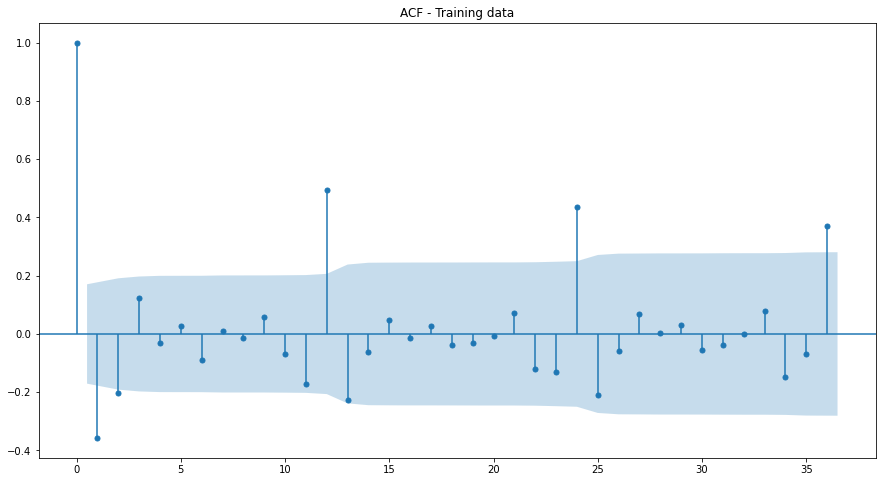

In [300]:
#Checking the acf plots for the training data
plot_acf(Arima_rose_train.diff(), title = "ACF - Training data", missing = "drop", lags = 36);

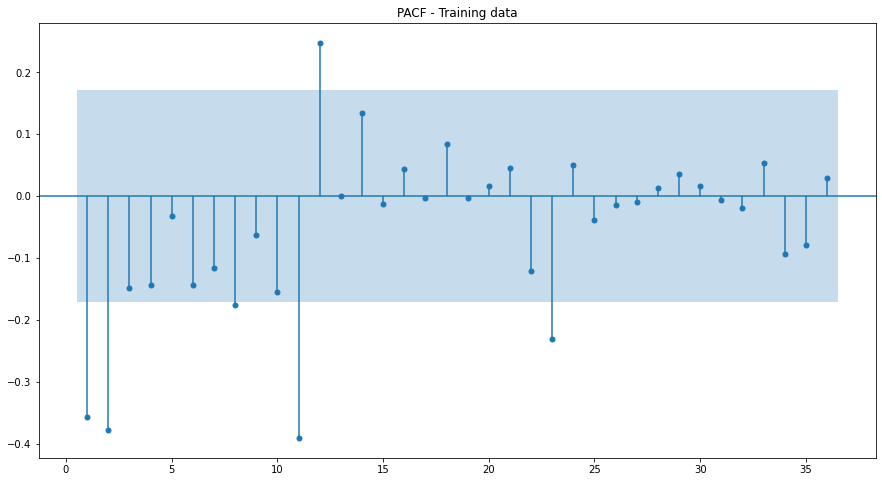

In [301]:
#Checking the pacf plot for the training data
plot_pacf(Arima_rose_train.diff().dropna(), title = "PACF - Training data", zero = False, method = "ywmle",lags = 36 );

Let us take the seasonal differencing of the original series

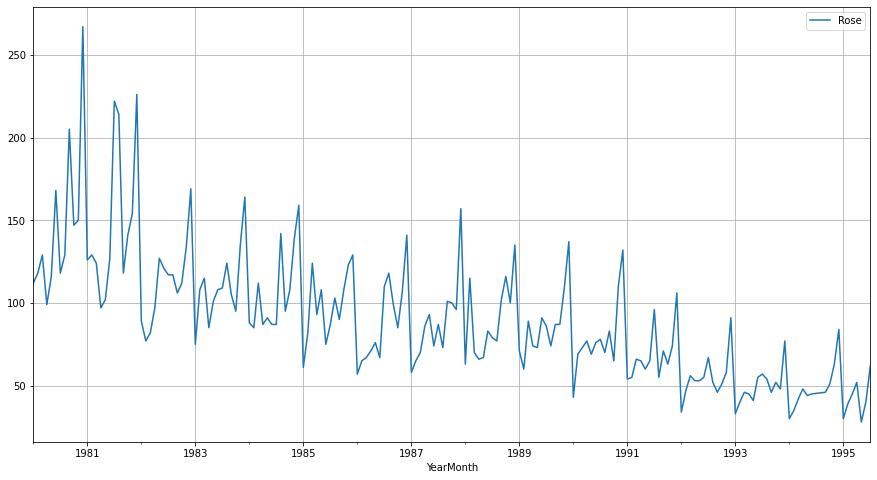

In [302]:
rose_df.plot()
plt.grid();

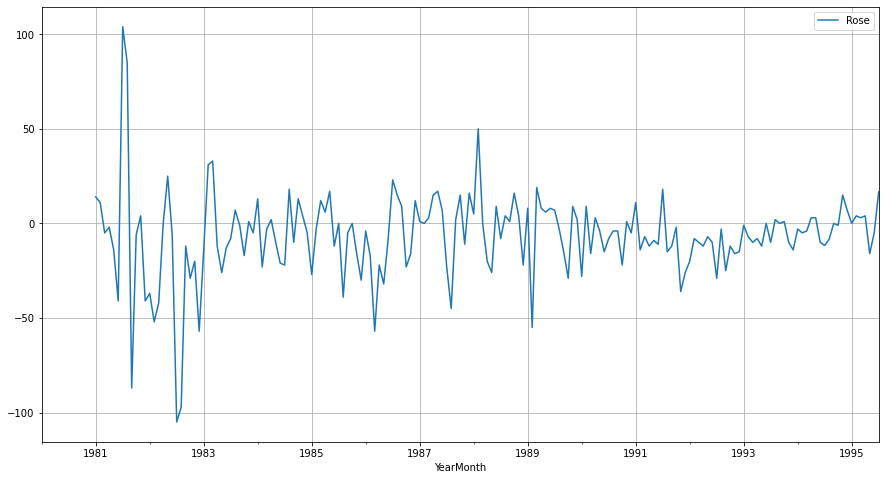

In [303]:
rose_df.diff(12).plot()
plt.grid();

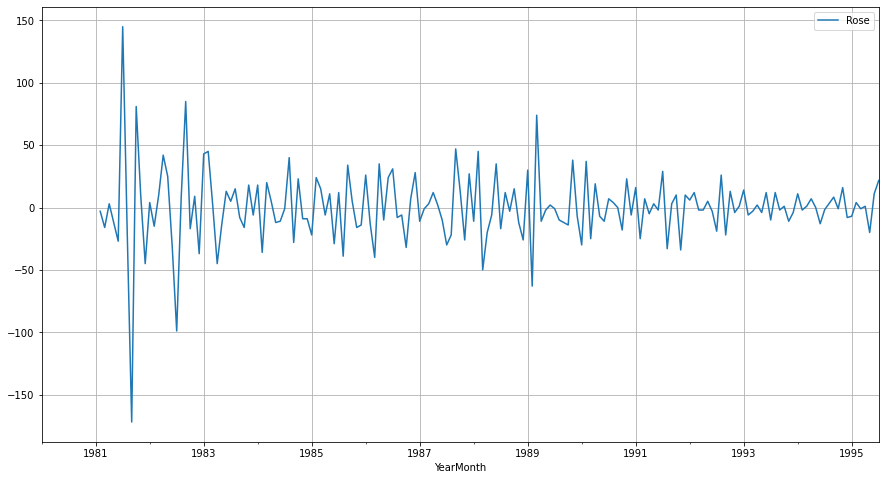

In [304]:
(rose_df.diff(12)).diff().plot()
plt.grid();

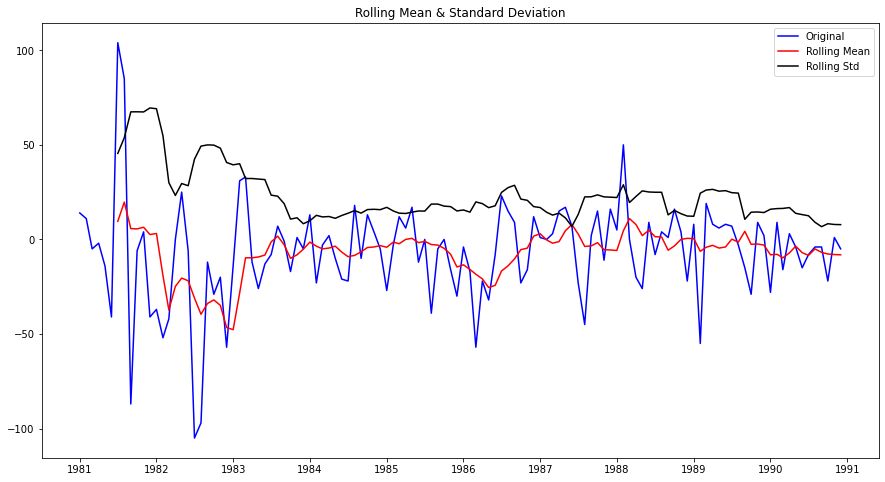

Results of Dickey-Fuller Test:
Test Statistic                  -3.619482
p-value                          0.005399
#Lags Used                      11.000000
Number of Observations Used    108.000000
Critical Value (1%)             -3.492401
Critical Value (5%)             -2.888697
Critical Value (10%)            -2.581255
dtype: float64 



In [305]:
test_stationarity((Arima_rose_train["Rose"].diff(12).dropna()))

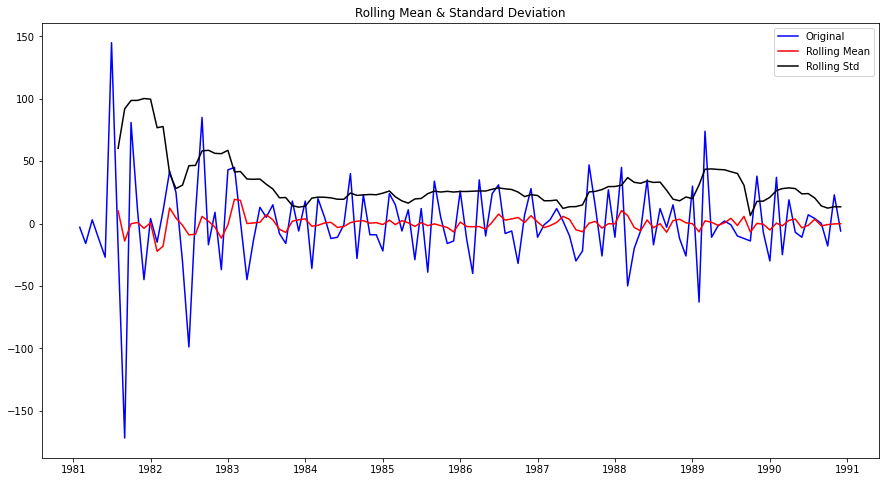

Results of Dickey-Fuller Test:
Test Statistic                  -3.692348
p-value                          0.004222
#Lags Used                      11.000000
Number of Observations Used    107.000000
Critical Value (1%)             -3.492996
Critical Value (5%)             -2.888955
Critical Value (10%)            -2.581393
dtype: float64 



In [306]:
test_stationarity((Arima_rose_train["Rose"].diff(12).dropna()).diff().dropna())

**After performing the difference, the value of p (0.0042) is less than the α (0.05), the significance level.**

**Hence we reject the null hypothesis that the time-series data is non-stationary, and accept the alternate hypothesis that the time-series data is stationary.**

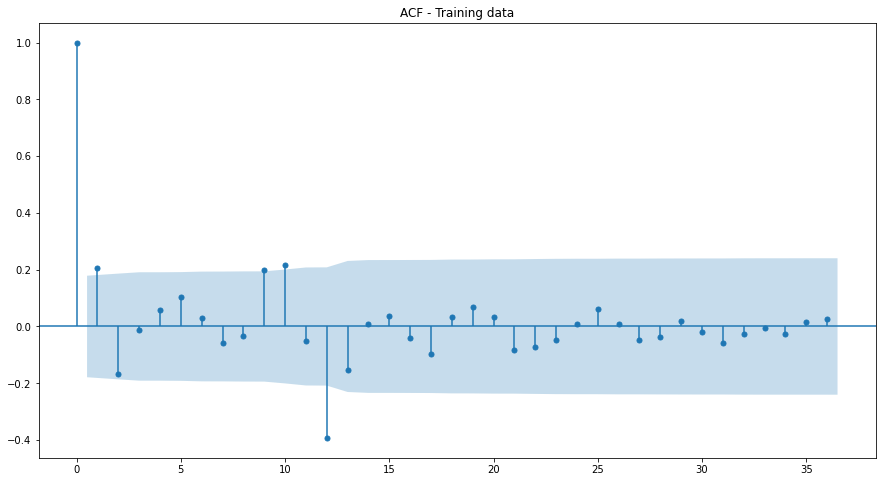

In [307]:
#Checking the acf plots for the training data
plot_acf((Arima_rose_train.diff(12).dropna()), title = "ACF - Training data", missing = "drop", lags = 36);

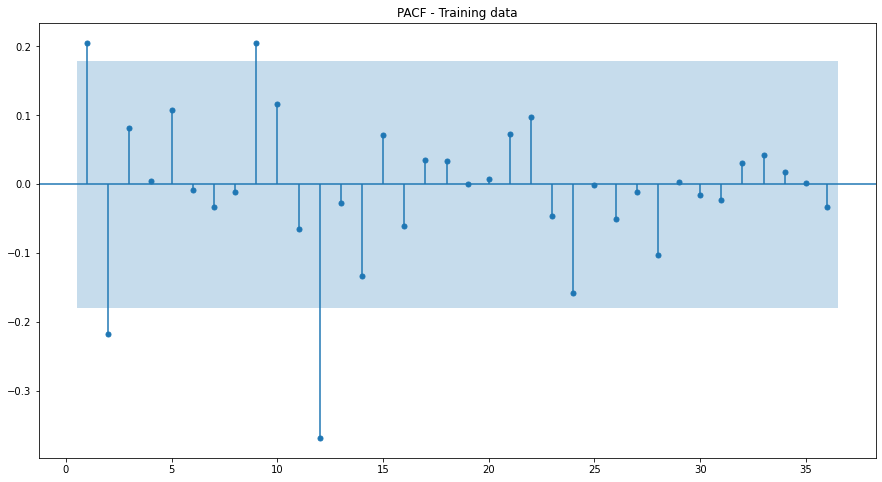

In [308]:
#Checking the pacf plot for the training data
plot_pacf((Arima_rose_train.diff(12).dropna()), title = "PACF - Training data", zero = False, method = "ywmle",lags = 36 );

In [309]:
manual_SARIMA_rose = sm.tsa.statespace.SARIMAX(Arima_rose_train["Rose"].astype("float64"),
                                                    order = (2,1,2), seasonal_order = (0,1,0,12),
                                                    enforce_stationarity = False, 
                                                    enforce_invertibility= False,)

C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'
C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'


In [310]:
results_manual_SARIMA_rose = manual_SARIMA_rose.fit(maxiter = 1000)

In [311]:
print(results_manual_SARIMA_rose.summary())

                                      SARIMAX Results                                      
Dep. Variable:                                Rose   No. Observations:                  132
Model:             SARIMAX(2, 1, 2)x(0, 1, [], 12)   Log Likelihood                -544.741
Date:                             Sun, 01 May 2022   AIC                           1099.482
Time:                                     10:20:08   BIC                           1113.250
Sample:                                 01-01-1980   HQIC                          1105.071
                                      - 12-01-1990                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2068      0.352     -0.588      0.557      -0.896       0.483
ar.L2         -0.1140      

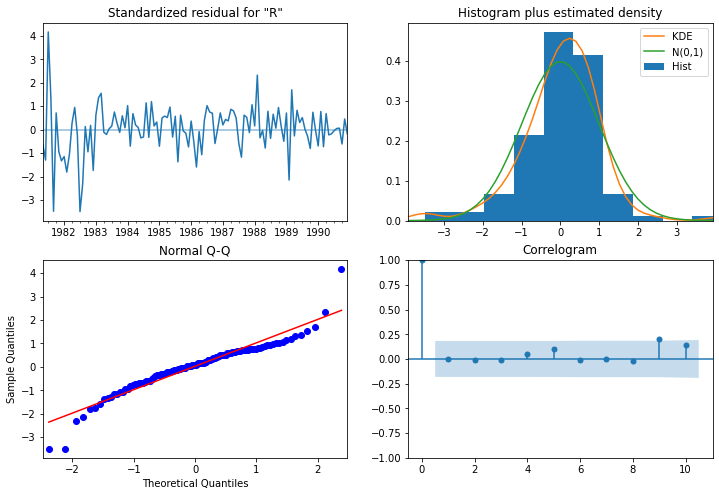

In [312]:
results_manual_SARIMA_rose.plot_diagnostics(figsize = (12,8));

In [313]:
rose_test_pred_Sarima_15 = results_manual_SARIMA_rose.forecast(steps = len(Arima_rose_test))

In [314]:
rose_test_pred_Sarima_15 =pd.DataFrame(rose_test_pred_Sarima_15, index = Arima_rose_test.index)

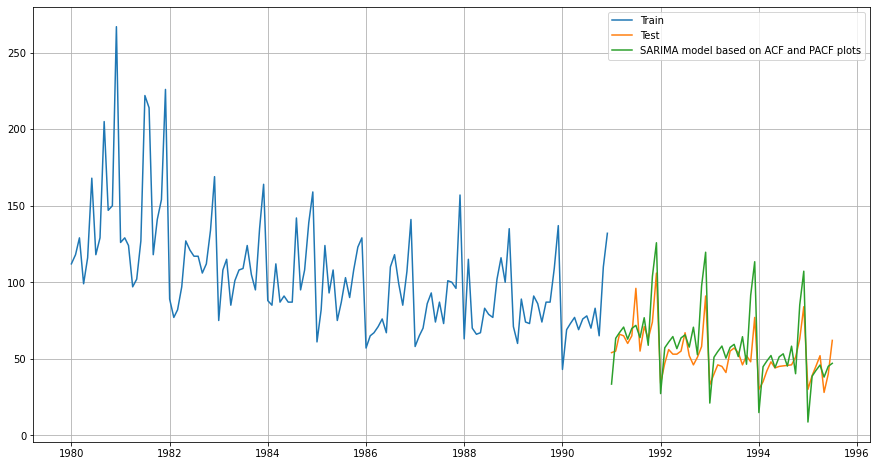

In [315]:
plt.plot(Arima_rose_train["Rose"], label = "Train")
plt.plot(Arima_rose_test["Rose"], label = "Test")
plt.plot(rose_test_pred_Sarima_15, label = "SARIMA model based on ACF and PACF plots")
plt.legend(loc = "best")
plt.grid();

In [316]:
rmse_rose_test_Sarima_15 = metrics.mean_squared_error(Arima_rose_test["Rose"],rose_test_pred_Sarima_15, squared = False)

In [317]:
rmse_rose_test_Sarima_15

15.261291350632096

In [318]:
MAPE_rose_Sarima_15 = MAPE(Arima_rose_test["Rose"],rose_test_pred_Sarima_15)

In [319]:
MAPE_rose_Sarima_15 

2207.97

In [320]:
resultsDF_rose_Sarima_15 = pd.DataFrame({"RMSE_Test":(rmse_rose_test_Sarima_15),
                                  "MAPE":(MAPE_rose_Sarima_15)
                                  }, index = ["SARIMA model based on ACF and PACF plot parametrs (2,1,2)(0,1,0,12)"])


In [321]:
resultsDF_rose_Sarima_15 

,RMSE_Test,MAPE
"SARIMA model based on ACF and PACF plot parametrs (2,1,2)(0,1,0,12)",15.261291,2207.97


In [322]:
resultsDF_rose = pd.concat([resultsDF_rose,resultsDF_rose_Sarima_15])

In [323]:
resultsDF_rose

,RMSE_Test,MAPE
"Simple Exponential Smoothing, alpha = 0.098",36.796227,63.88
"Simple Exponential Smoothing, alpha = 0.07",36.435772,63.22
"Double Exponential Smoothing, alpha = 0.017, beta = 0.000032",15.707052,24.12
"Double Exponential Smoothing, alpha = 0.04, beta = 0.47",14.560058,19.94
"Triple Exponential Smoothing (Multiplicative), alpha = 0.0768, beta = 0.0549, gamma = 0.409",17.739019,29.28
"Triple Exponential Multiplicaticve Smoothing, alpha = 0.2, beta = 0.8, gamma = 0.2",9.086461,12.48
Linear Regression,15.268955,22.82
Naive Model,79.718773,145.10
Simple Average Model,53.460570,94.93
2 point moving average,11.529278,13.54


**8. Build a table with all the models built along with their corresponding parameters and the respective RMSE values on the test data.**

In [324]:
resultsDF_rose.sort_values(by = "RMSE_Test", ascending = True)

,RMSE_Test,MAPE
"Triple Exponential Multiplicaticve Smoothing, alpha = 0.2, beta = 0.8, gamma = 0.2",9.086461,12.48
2 point moving average,11.529278,13.54
4 point moving average,14.451403,19.49
"Double Exponential Smoothing, alpha = 0.04, beta = 0.47",14.560058,19.94
6 point moving average,14.566327,20.82
9 point moving average,14.727630,21.01
"SARIMA model based on ACF and PACF plot parametrs (2,1,2)(0,1,0,12)",15.261291,2207.97
Linear Regression,15.268955,22.82
"Double Exponential Smoothing, alpha = 0.017, beta = 0.000032",15.707052,24.12
"SARIMA model using lowest AIC value parameters (0,1,2)(2,1,2,12)",16.500569,2167.24


Out of the top models, the 4 point, 6 point, 9 point and the Double Exponential smoothing model does not provide a good prediction as we saw from the plot of the test value prediction. So let us look at the Manual Triple Exponential Smoothing Multiplicative model, 2 point moving average and the SARIMA model based on the ACF and PACF plots. If there is a problem with the prediction with one of the models, we can go ahead with the auto SARIMA model.

**9. Based on the model-building exercise, build the most optimum model(s) on the complete data and predict 12 months into the future with appropriate confidence intervals/bands.**

**TES Multiplicative model with alpha = 0.2, beta = 0.8 and gamma = 0.2**

In [325]:
TES_rose_model_final_1 = ExponentialSmoothing(rose_df["Rose"], trend = "multiplicative", seasonal = "multiplicative")

C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'
C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:427: FutureWarning: After 0.13 initialization must be handled at model creation
  warnings.warn(


In [326]:
TES_model_alpha_2_beta_8_gamma_2 = TES_rose_model_final_1.fit(smoothing_level = 0.2, smoothing_trend = 0.8, smoothing_seasonal = 0.2,  optimized = False, use_brute = True)

In [327]:
TES_rose_predict_final_1 = TES_model_alpha_2_beta_8_gamma_2.fittedvalues

In [328]:
TES_rose_predict_final_1 = pd.DataFrame(TES_rose_predict_final_1, columns = ["Rose"], index = rose_df.index)

In [329]:
rmse_rose_predict_final_1 = metrics.mean_squared_error(rose_df["Rose"],TES_rose_predict_final_1, squared = False)

In [330]:
rmse_rose_predict_final_1

26.901615919614343

In [331]:
MAPE_rose_final_1 = MAPE(rose_df["Rose"],TES_rose_predict_final_1)

In [332]:
MAPE_rose_final_1

9094.97

In [333]:
TES_rose_predict_1 = TES_model_alpha_2_beta_8_gamma_2.forecast(steps = 12)

In [334]:
predict_rose_1_df = pd.DataFrame({"Lower_CI" : TES_rose_predict_1 - 1.96*np.std(TES_model_alpha_2_beta_8_gamma_2.resid, ddof = 1), 
                                       "Prediction" : TES_rose_predict_1, 
                                       "Upper_CI" : TES_rose_predict_1 + 1.96*np.std(TES_model_alpha_2_beta_8_gamma_2.resid, ddof = 1)   
})

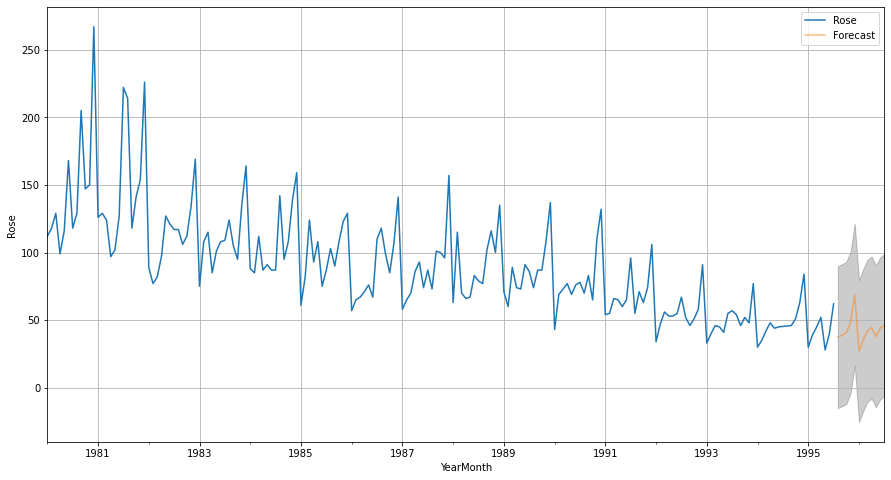

In [335]:
axis = rose_df.plot(label = "Actual Data", figsize = (15,8))
predict_rose_1_df["Prediction"].plot(ax = axis, label = "Forecast", alpha = 0.5)
axis.fill_between(predict_rose_1_df.index, predict_rose_1_df["Lower_CI"], predict_rose_1_df["Upper_CI"], color = "k", alpha = 0.2)
axis.set_xlabel("YearMonth")
axis.set_ylabel("Rose")
plt.legend(loc = "best")
plt.grid();

In [336]:
predict_rose_1_df

,Lower_CI,Prediction,Upper_CI
1995-08-01,-15.128664,37.395539,89.919743
1995-09-01,-13.702044,38.822160,91.346363
1995-10-01,-12.050664,40.473540,92.997744
1995-11-01,-4.417227,48.106977,100.631180
1995-12-01,16.413880,68.938084,121.462288
1996-01-01,-25.364286,27.159918,79.684121
1996-02-01,-17.367354,35.156849,87.681053
1996-03-01,-10.435348,42.088856,94.613060
1996-04-01,-8.071461,44.452742,96.976946
1996-05-01,-14.585617,37.938587,90.462790


**2 Point Moving Average**

In [337]:
Moving_Average_final = rose_df.copy()

In [338]:
Moving_Average_final.head()

,Rose
YearMonth,
1980-01-01,112.0
1980-02-01,118.0
1980-03-01,129.0
1980-04-01,99.0
1980-05-01,116.0


In [339]:
Moving_Average_final['Trailing_2'] = Moving_Average_final['Rose'].rolling(2).mean()

In [340]:
Moving_Average_final.head()

,Rose,Trailing_2
YearMonth,,
1980-01-01,112.0,NaN
1980-02-01,118.0,115.0
1980-03-01,129.0,123.5
1980-04-01,99.0,114.0
1980-05-01,116.0,107.5


In [341]:
Moving_Average_final.tail()

,Rose,Trailing_2
YearMonth,,
1995-03-01,45.0,42.0
1995-04-01,52.0,48.5
1995-05-01,28.0,40.0
1995-06-01,40.0,34.0
1995-07-01,62.0,51.0


In [342]:
Moving_Average_final.dropna(inplace=True)

In [343]:
rmse_rose_predict_final_2 = metrics.mean_squared_error(Moving_Average_final["Rose"],Moving_Average_final["Trailing_2"], squared = False)

In [344]:
rmse_rose_predict_final_2

17.497900539707356

In [345]:
Moving_Average_final["residuals"] = Moving_Average_final["Rose"] - Moving_Average_final["Trailing_2"]

In [346]:
Moving_Average_final.head()

,Rose,Trailing_2,residuals
YearMonth,,,
1980-02-01,118.0,115.0,3.0
1980-03-01,129.0,123.5,5.5
1980-04-01,99.0,114.0,-15.0
1980-05-01,116.0,107.5,8.5
1980-06-01,168.0,142.0,26.0


In [347]:
Moving_Average_final.tail()

,Rose,Trailing_2,residuals
YearMonth,,,
1995-03-01,45.0,42.0,3.0
1995-04-01,52.0,48.5,3.5
1995-05-01,28.0,40.0,-12.0
1995-06-01,40.0,34.0,6.0
1995-07-01,62.0,51.0,11.0


In [348]:
MA_std_dev = np.std(Moving_Average_final["residuals"], ddof = 1)

In [349]:
MA_std_dev

17.544610802377928

In [350]:
rose_df.loc["1994-07"]

,Rose
YearMonth,
1994-07-01,45.333333


In [351]:
rose_df.loc["1994-08"]

,Rose
YearMonth,
1994-08-01,45.666667


In [352]:
Moving_Average_final_predictions = pd.read_csv("Rose_2.csv", parse_dates = True, index_col = "YearMonth")

In [353]:
Moving_Average_final_predictions.tail(12)

,Rose,Moving Average,forecast
YearMonth,,,
1995-08-01,NaN,NaN,42.500000
1995-09-01,NaN,NaN,46.750000
1995-10-01,NaN,NaN,44.625000
1995-11-01,NaN,NaN,45.687500
1995-12-01,NaN,NaN,45.156250
1996-01-01,NaN,NaN,45.421875
1996-02-01,NaN,NaN,45.289063
1996-03-01,NaN,NaN,45.355469
1996-04-01,NaN,NaN,45.322266


In [354]:
Moving_Average_final_predictions = Moving_Average_final_predictions.drop(["Rose","Moving Average"], axis = 1)

In [355]:
Moving_Average_final_predictions.dropna(inplace = True)

The values in the forecast column are our predictions

In [356]:
predict_rose_2_df = pd.DataFrame({"Lower_CI" : Moving_Average_final_predictions["forecast"] - 1.96*MA_std_dev, 
                                       "Prediction" : Moving_Average_final_predictions["forecast"], 
                                       "Upper_CI" : Moving_Average_final_predictions["forecast"] + 1.96*MA_std_dev   
})

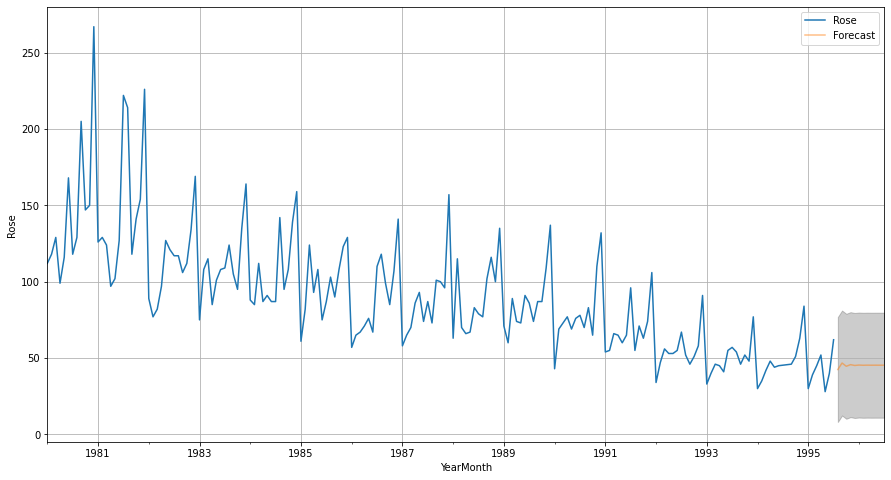

In [357]:
axis = rose_df.plot(label = "Actual Data", figsize = (15,8))
predict_rose_2_df["Prediction"].plot(ax = axis, label = "Forecast", alpha = 0.5)
axis.fill_between(predict_rose_2_df.index, predict_rose_2_df["Lower_CI"], predict_rose_2_df["Upper_CI"], color = "k", alpha = 0.2)
axis.set_xlabel("YearMonth")
axis.set_ylabel("Rose")
plt.legend(loc = "best")
plt.grid();

In [358]:
predict_rose_2_df

,Lower_CI,Prediction,Upper_CI
YearMonth,,,
1995-08-01,8.112563,42.500000,76.887437
1995-09-01,12.362563,46.750000,81.137437
1995-10-01,10.237563,44.625000,79.012437
1995-11-01,11.300063,45.687500,80.074937
1995-12-01,10.768813,45.156250,79.543687
1996-01-01,11.034438,45.421875,79.809312
1996-02-01,10.901626,45.289063,79.676500
1996-03-01,10.968032,45.355469,79.742906
1996-04-01,10.934829,45.322266,79.709703


Since the prediction of the moving average model is not what we expected, let us look at one more model.

**SARIMA model based on ACF and PACF plots**

In [359]:
manual_SARIMA_rose_final_3 = sm.tsa.statespace.SARIMAX(rose_df["Rose"].astype("float64"),
                                                    order = (2,1,2), seasonal_order = (0,1,0,12),
                                                    enforce_stationarity = False, 
                                                    enforce_invertibility= False,)

C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'
C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'


In [360]:
results_manual_SARIMA_rose_final_3 = manual_SARIMA_rose_final_3.fit(maxiter = 1000)

In [361]:
print(results_manual_SARIMA_rose_final_3.summary())

                                      SARIMAX Results                                      
Dep. Variable:                                Rose   No. Observations:                  187
Model:             SARIMAX(2, 1, 2)x(0, 1, [], 12)   Log Likelihood                -775.908
Date:                             Sun, 01 May 2022   AIC                           1561.816
Time:                                     10:20:14   BIC                           1577.524
Sample:                                 01-01-1980   HQIC                          1568.190
                                      - 07-01-1995                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1924      0.298     -0.646      0.518      -0.776       0.391
ar.L2         -0.0924      

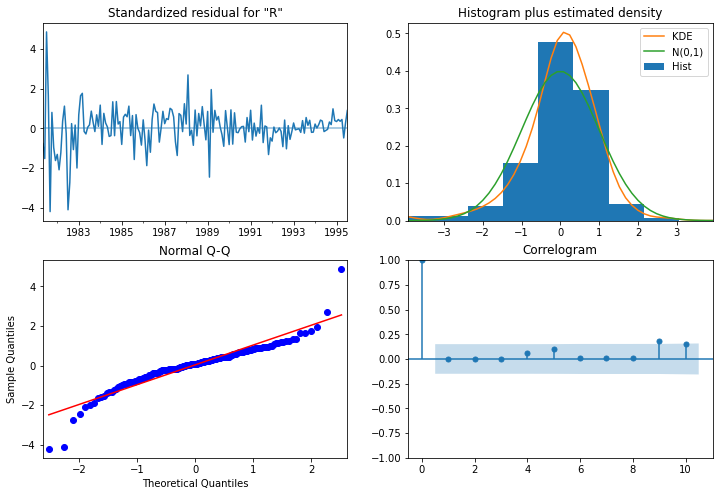

In [362]:
results_manual_SARIMA_rose_final_3.plot_diagnostics(figsize = (12,8));

In [363]:
rose_pred_Sarima_final_3 = results_manual_SARIMA_rose_final_3.fittedvalues

In [364]:
rose_pred_Sarima_final_3 = pd.DataFrame(rose_pred_Sarima_final_3, index = rose_df.index, columns = ["Rose"])

In [365]:
rmse_rose_predict_final_3 = metrics.mean_squared_error(rose_df["Rose"],rose_pred_Sarima_final_3, squared = False)

In [366]:
rmse_rose_predict_final_3 

31.003440778795504

In [367]:
MAPE_rose_final_3 = MAPE(rose_df["Rose"],rose_pred_Sarima_final_3)

In [368]:
MAPE_rose_final_3

9241.52

In [369]:
SARIMA_rose_predict_3 = results_manual_SARIMA_rose_final_3.forecast(steps = 12)

In [370]:
predict_rose_3_df = pd.DataFrame({"Lower_CI" : SARIMA_rose_predict_3 - 1.96*np.std(results_manual_SARIMA_rose_final_3.resid, ddof = 1), 
                                       "Prediction" : SARIMA_rose_predict_3, 
                                       "Upper_CI" : SARIMA_rose_predict_3 + 1.96*np.std(results_manual_SARIMA_rose_final_3.resid, ddof = 1)   
})

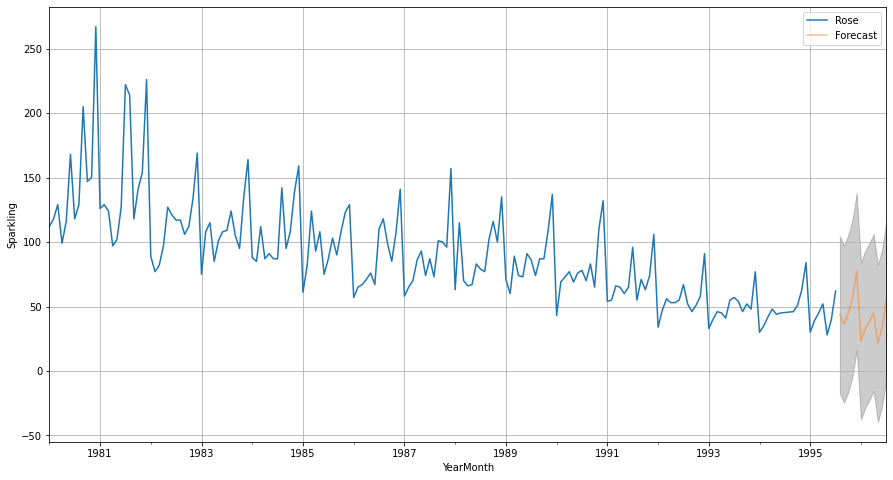

In [371]:
axis = rose_df.plot(label = "Actual Data", figsize = (15,8))
predict_rose_3_df["Prediction"].plot(ax = axis, label = "Forecast", alpha = 0.5)
axis.fill_between(predict_rose_3_df.index, predict_rose_3_df["Lower_CI"], predict_rose_3_df["Upper_CI"], color = "k", alpha = 0.2)
axis.set_xlabel("YearMonth")
axis.set_ylabel("Sparkling")
plt.legend(loc = "best")
plt.grid();

In [372]:
predict_rose_3_df

,Lower_CI,Prediction,Upper_CI
1995-08-01,-17.331342,43.571406,104.474153
1995-09-01,-24.629862,36.272886,97.175633
1995-10-01,-16.428166,44.474581,105.377328
1995-11-01,-4.339246,56.563501,117.466248
1995-12-01,16.347884,77.250631,138.153378
1996-01-01,-37.600127,23.302620,84.205368
1996-02-01,-28.581229,32.321518,93.224265
1996-03-01,-22.589668,38.313079,99.215826
1996-04-01,-15.589790,45.312957,106.215705
1996-05-01,-39.588987,21.313760,82.216508


**SARIMA model based on lowest AIC value**

In [373]:
auto_SARIMA_rose_final_4 = sm.tsa.statespace.SARIMAX(rose_df["Rose"].astype("float64"),
                                                    order = (0,1,2), seasonal_order = (2,1,2,12),
                                                    enforce_stationarity = False, 
                                                    enforce_invertibility= False)

C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'
C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'


In [374]:
results_auto_SARIMA_rose_final_4 = auto_SARIMA_rose_final_4.fit(maxiter = 1000)

In [375]:
print(results_auto_SARIMA_rose_final_4.summary())

                                     SARIMAX Results                                      
Dep. Variable:                               Rose   No. Observations:                  187
Model:             SARIMAX(0, 1, 2)x(2, 1, 2, 12)   Log Likelihood                -588.601
Date:                            Sun, 01 May 2022   AIC                           1191.201
Time:                                    10:20:19   BIC                           1212.134
Sample:                                01-01-1980   HQIC                          1199.706
                                     - 07-01-1995                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.8258      0.080    -10.338      0.000      -0.982      -0.669
ma.L2         -0.0801      0.086   

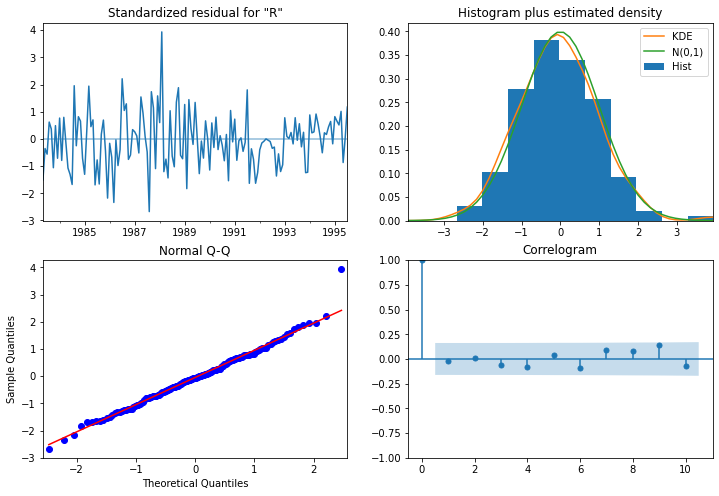

In [376]:
results_auto_SARIMA_rose_final_4.plot_diagnostics(figsize = (12,8));

In [377]:
rose_pred_Sarima_final_4 = results_auto_SARIMA_rose_final_4.fittedvalues

In [378]:
rose_pred_Sarima_final_4 = pd.DataFrame(rose_pred_Sarima_final_4, index = rose_df.index, columns = ["Rose"])

In [379]:
rmse_rose_predict_final_4 = metrics.mean_squared_error(rose_df["Rose"],rose_pred_Sarima_final_4 , squared = False)

In [380]:
rmse_rose_predict_final_4

33.47848315358603

In [381]:
MAPE_rose_final_4 = MAPE(rose_df["Rose"],rose_pred_Sarima_final_4)

In [382]:
MAPE_rose_final_4

9284.94

In [383]:
SARIMA_rose_predict_4 = results_auto_SARIMA_rose_final_4.forecast(steps = 12)

In [384]:
predict_rose_4_df = pd.DataFrame({"Lower_CI" : SARIMA_rose_predict_4 - 1.96*np.std(results_auto_SARIMA_rose_final_4.resid, ddof = 1), 
                                       "Prediction" : SARIMA_rose_predict_4, 
                                       "Upper_CI" : SARIMA_rose_predict_4 + 1.96*np.std(results_auto_SARIMA_rose_final_4.resid, ddof = 1)   
})

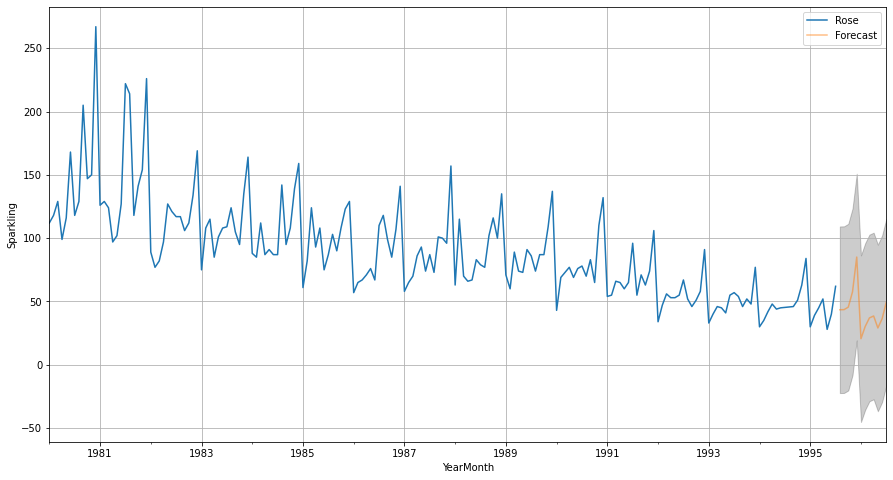

In [385]:
axis = rose_df.plot(label = "Actual Data", figsize = (15,8))
predict_rose_4_df["Prediction"].plot(ax = axis, label = "Forecast", alpha = 0.5)
axis.fill_between(predict_rose_4_df.index, predict_rose_4_df["Lower_CI"], predict_rose_4_df["Upper_CI"], color = "k", alpha = 0.2)
axis.set_xlabel("YearMonth")
axis.set_ylabel("Sparkling")
plt.legend(loc = "best")
plt.grid();

In [386]:
predict_rose_4_df

,Lower_CI,Prediction,Upper_CI
1995-08-01,-22.324490,43.468848,109.262187
1995-09-01,-22.222012,43.571326,109.364665
1995-10-01,-20.241567,45.551771,111.345110
1995-11-01,-8.187077,57.606261,123.399600
1995-12-01,19.290137,85.083475,150.876814
1996-01-01,-45.183986,20.609352,86.402691
1996-02-01,-35.523037,30.270302,96.063640
1996-03-01,-28.769794,37.023545,102.816883
1996-04-01,-27.244704,38.548635,104.341974
1996-05-01,-36.694578,29.098761,94.892099


**Final Model Prediction**

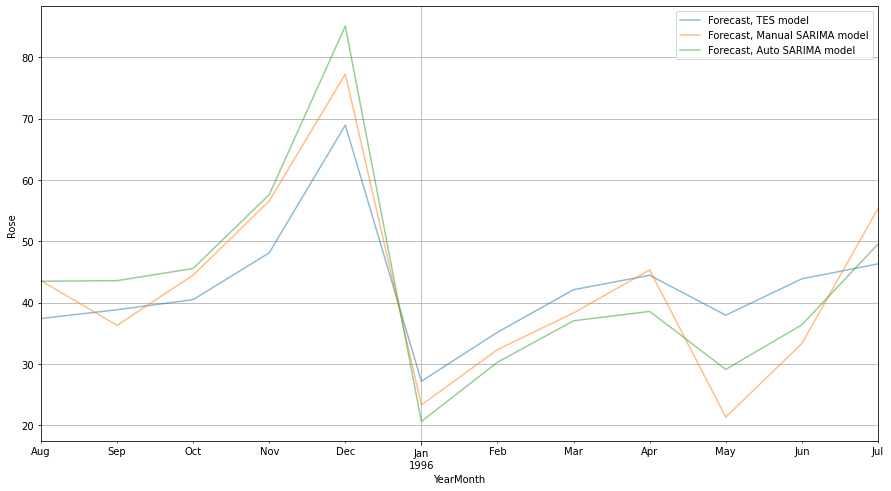

In [387]:
axis = predict_rose_1_df["Prediction"].plot(label = "Forecast, TES model", alpha = 0.5)
axis = predict_rose_3_df["Prediction"].plot(label = "Forecast, Manual SARIMA model", alpha = 0.5)
axis = predict_rose_4_df["Prediction"].plot(label = "Forecast, Auto SARIMA model", alpha = 0.5)
axis.set_xlabel("YearMonth")
axis.set_ylabel("Rose")
plt.legend(loc = "best")
plt.grid();

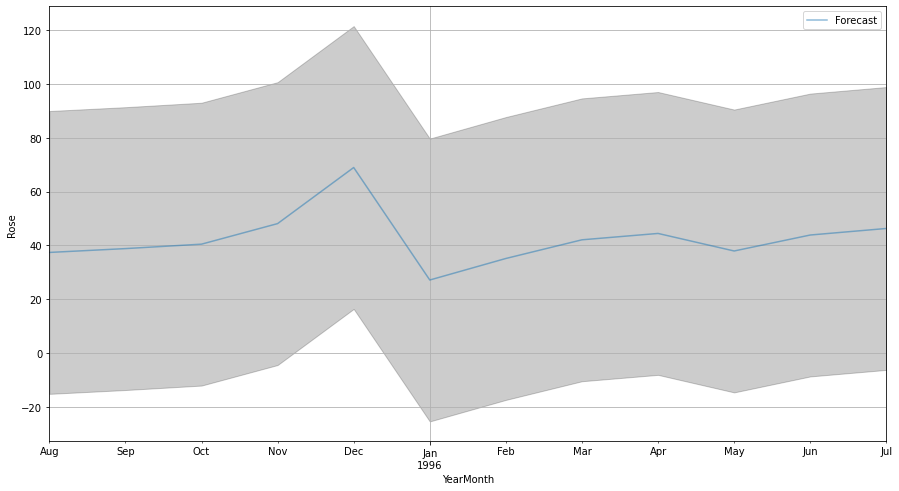

In [388]:
axis = predict_rose_1_df["Prediction"].plot(label = "Forecast", alpha = 0.5)
axis.fill_between(predict_rose_1_df.index, predict_rose_1_df["Lower_CI"], predict_rose_1_df["Upper_CI"], color = "k", alpha = 0.2)
axis.set_xlabel("YearMonth")
axis.set_ylabel("Rose")
plt.legend(loc = "best")
plt.grid();

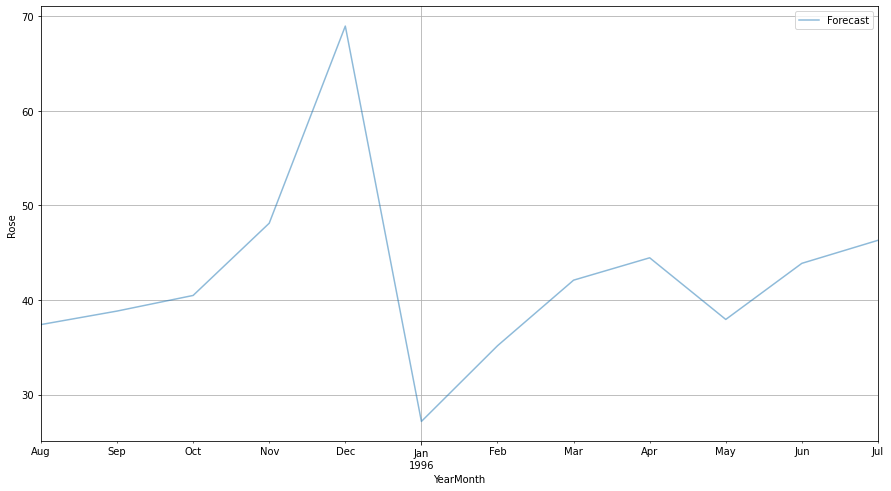

In [389]:
axis = predict_rose_1_df["Prediction"].plot(label = "Forecast", alpha = 0.5)
axis.set_xlabel("YearMonth")
axis.set_ylabel("Rose")
plt.legend(loc = "best")
plt.grid();

In [390]:
predict_rose_1_df["Prediction"].sum()

510.700888791832

In [391]:
predict_rose_1_df["Upper_CI"].sum()

1140.991334572687

**10. Comment on the model thus built and report your findings and suggest the measures that the company should be taking for future sales.**

Comments on the Final Models

1.	The best model out of the final three models was the Manual Multiplicative Triple Exponential Smoothing, which gave a total RMSE of 26.901.
2.	The SARIMA models also gave a good performance, but the RMSE was little more than the Triple Exponential Smoothing model and the MAPE values were very much higher..
3.	We can also try to take the forecast based on the three models, (TES, manual SARIMA and the auto SARIMA) by taking the mean or by assigning weights to these models, and finding the best values.
4.	The 2 point moving average model, which performed well on the know data failed to make good predictions, as after few iterations, the value started to level out.

Findings
1.	There is a clear declining trend in the sales of the rose wine.
2.	There is a spike in the sales during the last quarter, between October and December.
3.	The sales reaches the peak in the December month, during the holiday season.
4.	There is a slow increase in the wine sales from August to October, coinciding with the fall season.
5.	Immediately after the holiday season there is a slowdown in the wine sales.
6.	During the next twelve months, sales would be high during the December month, and will be the lowest in the months of January and May.
7.	The total number of units expected to be sold is 510 units.
8.	In case we take the extremities, there could be a sales of 1140 units maximum and just 16 units minimum.
9.	Without taking the confidence band into the equation, the sales is expected to slowly rise from the August of 1995 to end of September of 1995.
10.	The sales are then expected to increase swiftly between October and end of November. The peak of the sales is expected to hit in the December of 1995 with more than 65 units.
11.	The sales will then decline to below 30 units at the end of January of 1996.
12.	The sales is expected to rise slowly from January till end of March, after which the sales is expected to dip till the end April once again.
13.	From May, the sales will start picking up again till July, which is the end of our forecast period.

Suggestions based on the Final Model

1.	The winery should stock up the wine for the Holiday season.
2.	There is an increase in the wine sales during August and October. The sales during these months can be increased by providing promoting the wine though advertisements.
3.	The low sales during the initial months of the year can be countered by providing offers and rewards.
4.	There is a decreasing trend over the years in the rose wine sales. So the winery must look to find if there is an issue with the quality, taste or texture of the wine.
5.	Since there is a decreasing trend, there was a time when the sales were high. And given that the data has data from the 1980s, the company should build up on the nostalgic value of the product to get their older customers back.
6.	 Over the years, there will be more youngsters who attain the drinking age. They are fairly new customers who do not have a preference over their wines. So the company should target these new customers.
7.	The best way to make more sales for this wine would be to introduce classic cocktails with the rose wine as the base alcohol. The better the cocktail is more the sales, as most of the people who go to a bar, generally order cocktails.
8.	Tie-up with casinos, wedding and funeral caterers to improve the sales.
9.	One interesting thing to notice is that it was in the year 1994, that in the much popular television series Seinfeld, the characters speak about why Pepsi is better than wine. It is in this exact year that the sales of this wine has been the lowest. The impact of such television series on the sales of products have to be studied to get it into our advantage.
10.	The company should take a survey on what kind of wine people would prefer, and what they want to experience in wine. If the results of the survey indicate that the rose wine does not have what the people prefer, the company should try to reintroduce a newer variety of the wine with the said qualities, or it should simply stop making any more of it and try to focus on wines that have more sales.
11.	In this age of social media, consistently keep on posting on social media, and also avail the service of social media influencers.

Steps taken in the project

1.	Initially the dataset was read as a time-series data, and the basic info, missing values imputation, descriptive statistics and EDA was performed.
2.	Based on the EDA, insights were identified.
3.	The train test split was made.
4.	Different models were made with Simple Exponential Smoothing, Double Exponential Smoothing, Triple Exponential Smoothing, Linear Regression, Naïve model, simple and Moving average models, ARIMA and SARIMA models
5.	The stationarity of the dataset was checked using the Augmented Dickey Fuller (ADF) Test, and if the data was found not stationarity, steps were taken to make it stationary.
6.	The performance metrics were calculated for all the models.
7.	Based on the performance metrics, the best model was found.
8.	The final model was made to include the entire dataset, and the model was made to forecast for the next 12 months.
9.	Based on the EDA, insights were gathered.


**Sparkling**

**1. Read the data as an appropriate Time Series data and plot the data.**

In [392]:
sparkling_df = pd.read_csv("Sparkling.csv",parse_dates = True,index_col=0)

In [393]:
sparkling_df.head()

,Sparkling
YearMonth,
1980-01-01,1686
1980-02-01,1591
1980-03-01,2304
1980-04-01,1712
1980-05-01,1471


In [394]:
sparkling_df.tail()

,Sparkling
YearMonth,
1995-03-01,1897
1995-04-01,1862
1995-05-01,1670
1995-06-01,1688
1995-07-01,2031


In [395]:
sparkling_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 187 entries, 1980-01-01 to 1995-07-01
Data columns (total 1 columns):
 #   Column     Non-Null Count  Dtype
---  ------     --------------  -----
 0   Sparkling  187 non-null    int64
dtypes: int64(1)
memory usage: 2.9 KB


In [396]:
sparkling_df.isnull().sum()

Sparkling    0
dtype: int64

In [397]:
sparkling_df.duplicated().sum()

11

In [398]:
sparkling_df.index.nunique()

187

There are no missing values in the dataset

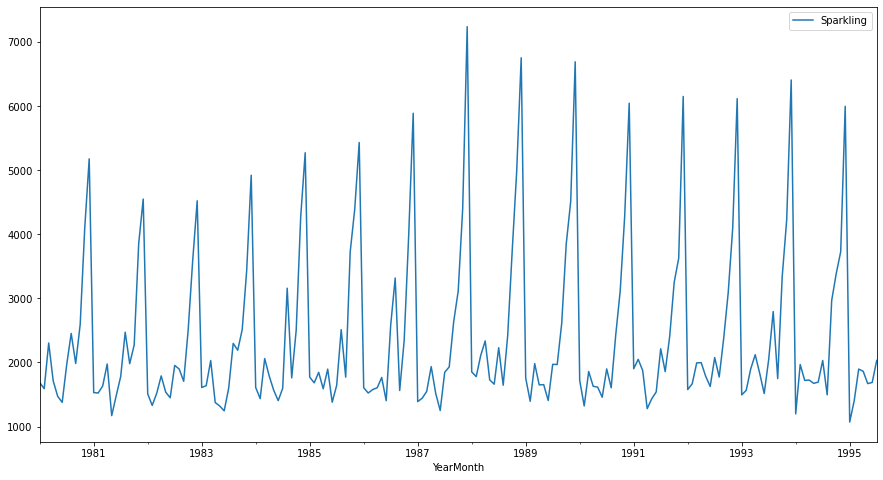

In [399]:
sparkling_df.plot();

**2. Perform appropriate Exploratory Data Analysis to understand the data and also perform decomposition.**

In [400]:
sparkling_df.describe().T

,count,mean,std,min,25%,50%,75%,max
Sparkling,187.0,2402.417112,1295.11154,1070.0,1605.0,1874.0,2549.0,7242.0


In [401]:
sparkling_df.skew()

Sparkling    1.817612
dtype: float64

<AxesSubplot:ylabel='Count'>

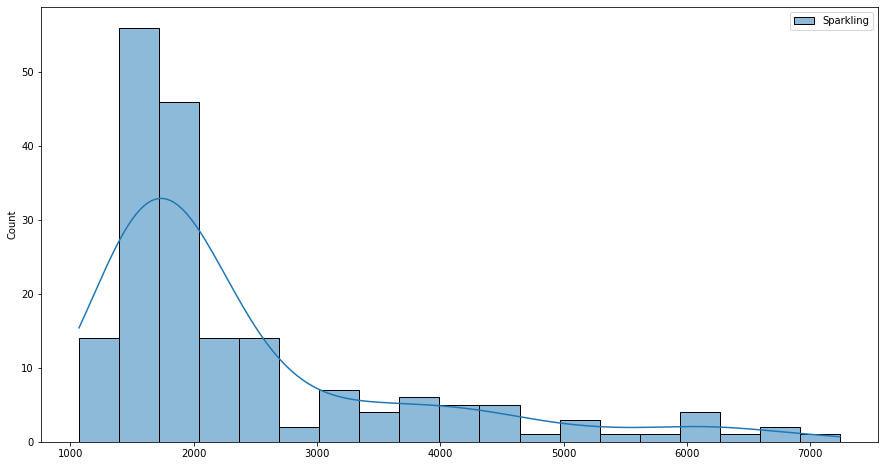

In [402]:
sns.histplot(sparkling_df, kde = True)

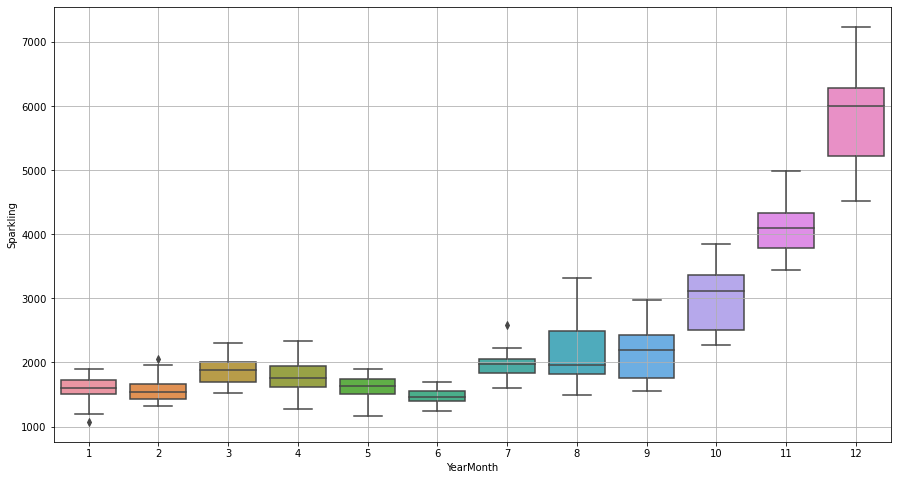

In [403]:
sns.boxplot(x=sparkling_df.index.month,y=sparkling_df["Sparkling"])
plt.grid()

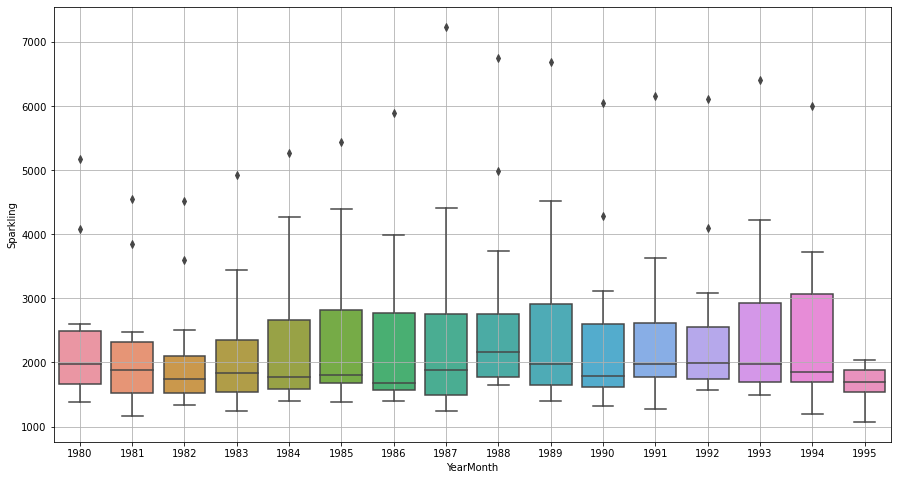

In [404]:
sns.boxplot(x=sparkling_df.index.year,y=sparkling_df["Sparkling"])
plt.grid()

In [405]:
monthly_sales_across_years = pd.pivot_table(sparkling_df, values = "Sparkling", columns = sparkling_df.index.month_name(), index = sparkling_df.index.year)
monthly_sales_across_years

YearMonth,April,August,December,February,January,July,June,March,May,November,October,September
YearMonth,,,,,,,,,,,,
1980,1712.0,2453.0,5179.0,1591.0,1686.0,1966.0,1377.0,2304.0,1471.0,4087.0,2596.0,1984.0
1981,1976.0,2472.0,4551.0,1523.0,1530.0,1781.0,1480.0,1633.0,1170.0,3857.0,2273.0,1981.0
1982,1790.0,1897.0,4524.0,1329.0,1510.0,1954.0,1449.0,1518.0,1537.0,3593.0,2514.0,1706.0
1983,1375.0,2298.0,4923.0,1638.0,1609.0,1600.0,1245.0,2030.0,1320.0,3440.0,2511.0,2191.0
1984,1789.0,3159.0,5274.0,1435.0,1609.0,1597.0,1404.0,2061.0,1567.0,4273.0,2504.0,1759.0
1985,1589.0,2512.0,5434.0,1682.0,1771.0,1645.0,1379.0,1846.0,1896.0,4388.0,3727.0,1771.0
1986,1605.0,3318.0,5891.0,1523.0,1606.0,2584.0,1403.0,1577.0,1765.0,3987.0,2349.0,1562.0
1987,1935.0,1930.0,7242.0,1442.0,1389.0,1847.0,1250.0,1548.0,1518.0,4405.0,3114.0,2638.0
1988,2336.0,1645.0,6757.0,1779.0,1853.0,2230.0,1661.0,2108.0,1728.0,4988.0,3740.0,2421.0


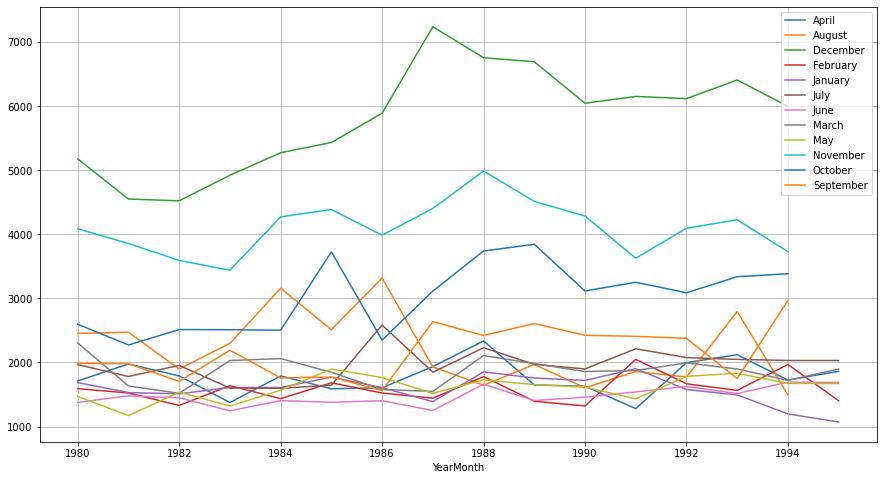

In [406]:
monthly_sales_across_years.plot()
plt.grid()
plt.legend(loc='best');

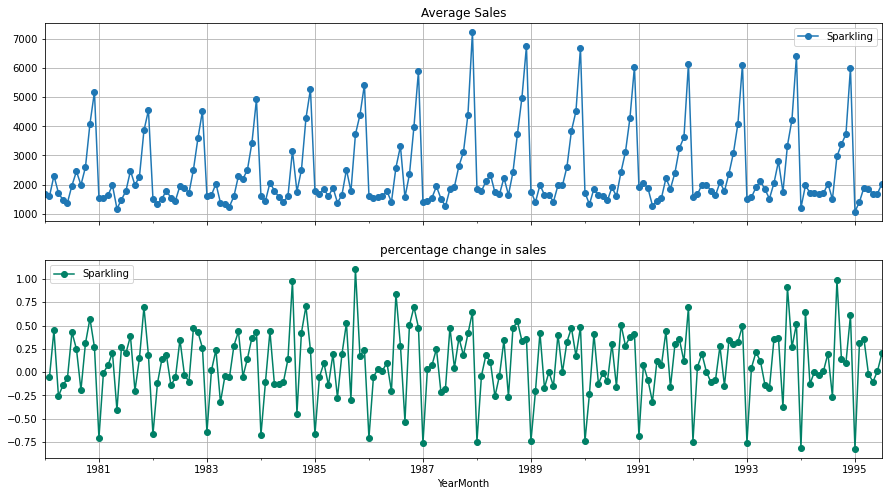

In [407]:
average = sparkling_df.groupby(sparkling_df.index)["Sparkling"].mean()
pct_change = sparkling_df.groupby(sparkling_df.index)["Sparkling"].sum().pct_change()

fig, (axis1,axis2) = plt.subplots(2,1, sharex = True, figsize = (15,8))

#Average Sales over time
ax1 = average.plot(legend = True, ax = axis1, marker = "o", title = "Average Sales", grid = True)
ax1.set_xticks(range(len(average)))
ax1.set_xticklabels(average.index.tolist())

#Percentage change for sales over time
ax2 = pct_change.plot(legend = True, ax = axis2, marker = "o", colormap = "summer", title = "percentage change in sales", grid = True)

C:\Users\srikanth\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Text(0.5, 1.0, 'Boxplot of Sparkling wine Sales')

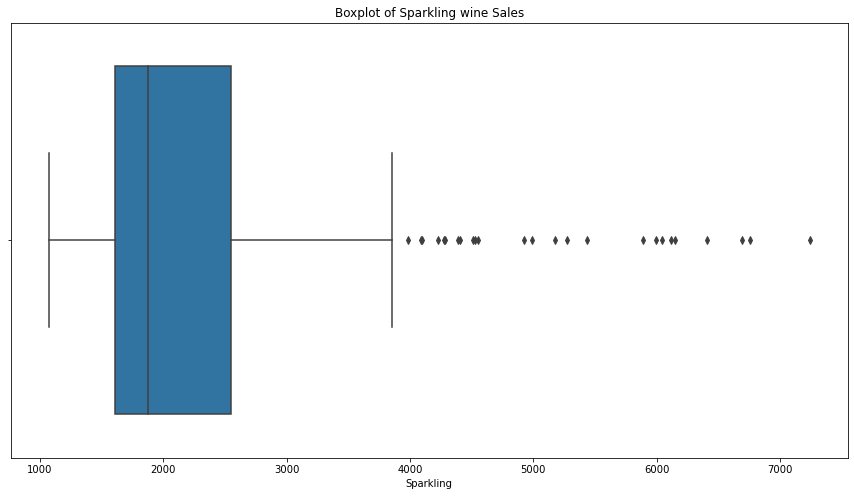

In [408]:
sns.boxplot(sparkling_df["Sparkling"]);
plt.title("Boxplot of Sparkling wine Sales")

In [409]:
LL1,UL1=remove_outlier(sparkling_df["Sparkling"])
print("The percentage of outliers in Sparkling wine sales Upper is",round(sparkling_df[sparkling_df["Sparkling"]>UL1]["Sparkling"].count()*100/len(sparkling_df),2),"%")
print("The percentage of outliers in Sparkling wine sales lower is",round(sparkling_df[sparkling_df["Sparkling"]<LL1]["Sparkling"].count()*100/len(sparkling_df),2),"%")

The percentage of outliers in Sparkling wine sales Upper is 13.37 %
The percentage of outliers in Sparkling wine sales lower is 0.0 %


In [410]:
sparkling_add_decompose = seasonal_decompose(sparkling_df, model = "additive")

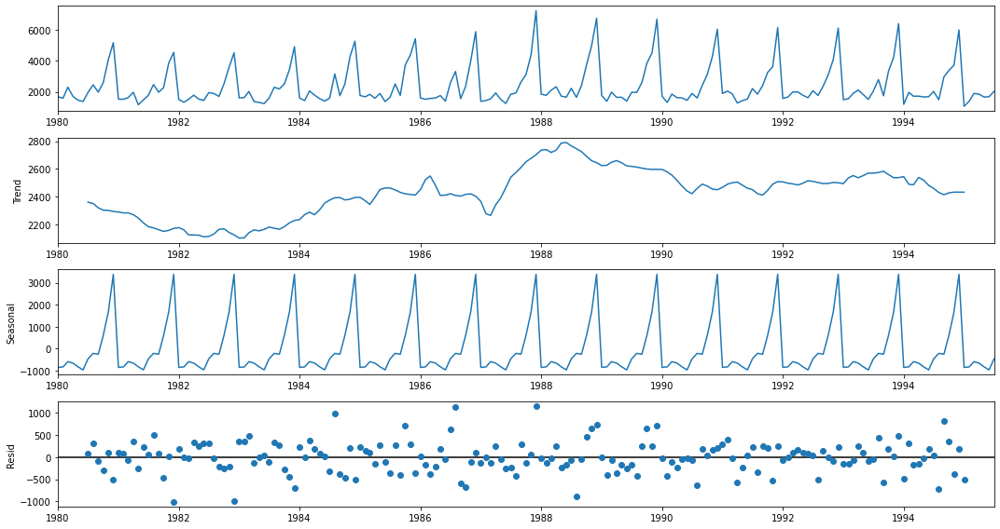

In [411]:
sparkling_add_decompose.plot();

We can see that the residual values are either increasing or decreasing based on the trend. So we may need to look at the multiplicative model.

In [412]:
sparkling_mul_decompose = seasonal_decompose(sparkling_df, model = "multiplicative")

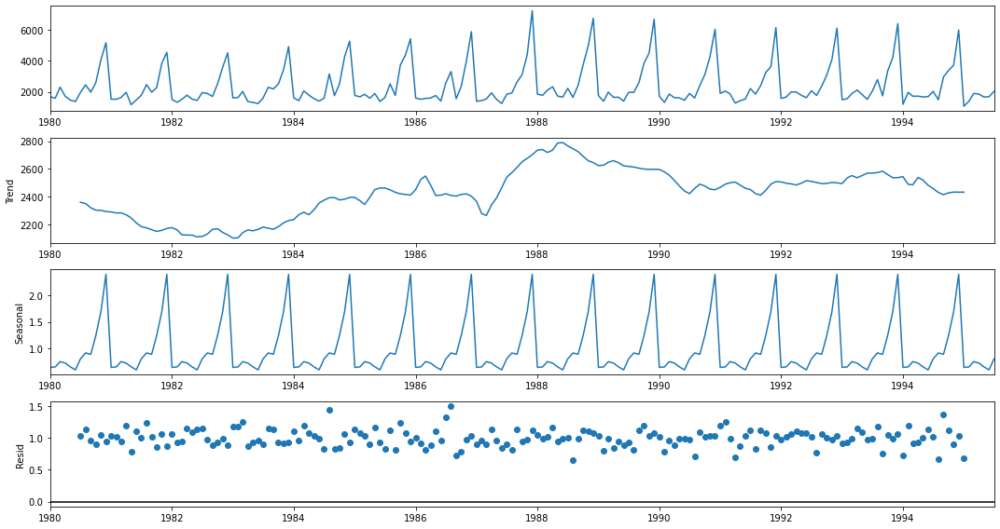

In [413]:
sparkling_mul_decompose.plot();

**3. Split the data into training and test. The test data should start in 1991.**

In [414]:
sparkling_train = sparkling_df[sparkling_df.index<"1991"]
sparkling_test = sparkling_df[sparkling_df.index>="1991"]

In [415]:
sparkling_train.head()

,Sparkling
YearMonth,
1980-01-01,1686
1980-02-01,1591
1980-03-01,2304
1980-04-01,1712
1980-05-01,1471


In [416]:
sparkling_train.tail()

,Sparkling
YearMonth,
1990-08-01,1605
1990-09-01,2424
1990-10-01,3116
1990-11-01,4286
1990-12-01,6047


In [417]:
sparkling_test.head()

,Sparkling
YearMonth,
1991-01-01,1902
1991-02-01,2049
1991-03-01,1874
1991-04-01,1279
1991-05-01,1432


In [418]:
sparkling_test.tail()

,Sparkling
YearMonth,
1995-03-01,1897
1995-04-01,1862
1995-05-01,1670
1995-06-01,1688
1995-07-01,2031


In [419]:
sparkling_train.shape

(132, 1)

In [420]:
sparkling_test.shape

(55, 1)

The dataset has been split into train and test set, with the test set starting from the year 1991

**4. Build all the exponential smoothing models on the training data and evaluate the model using RMSE on the test data. Other additional models such as regression, naïve forecast models, simple average models, moving average models should also be built on the training data and check the performance on the test data using RMSE.**

**Simple Exponential Smoothing**

In [421]:
SES_sparkling_train = sparkling_train.copy()
SES_sparkling_test = sparkling_test.copy()

In [422]:
print(SES_sparkling_train.head())

            Sparkling
YearMonth            
1980-01-01       1686
1980-02-01       1591
1980-03-01       2304
1980-04-01       1712
1980-05-01       1471


In [423]:
print(SES_sparkling_test.head())

            Sparkling
YearMonth            
1991-01-01       1902
1991-02-01       2049
1991-03-01       1874
1991-04-01       1279
1991-05-01       1432


In [424]:
SES_sparkling_model_1 = SimpleExpSmoothing(SES_sparkling_train["Sparkling"])

C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'
C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:427: FutureWarning: After 0.13 initialization must be handled at model creation
  warnings.warn(


In [425]:
SES_sparkling_model_autofit = SES_sparkling_model_1.fit(optimized = True)

C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:920: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


In [426]:
SES_sparkling_model_autofit.params

{'smoothing_level': 0.049607360581862936,
 'smoothing_trend': nan,
 'smoothing_seasonal': nan,
 'damping_trend': nan,
 'initial_level': 1818.535750008871,
 'initial_trend': nan,
 'initial_seasons': array([], dtype=float64),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [427]:
sparkling_test_pred_SES = SES_sparkling_model_autofit.forecast(steps = len(SES_sparkling_test))

In [428]:
sparkling_test_pred_SES.head()

1991-01-01    2724.932624
1991-02-01    2724.932624
1991-03-01    2724.932624
1991-04-01    2724.932624
1991-05-01    2724.932624
Freq: MS, dtype: float64

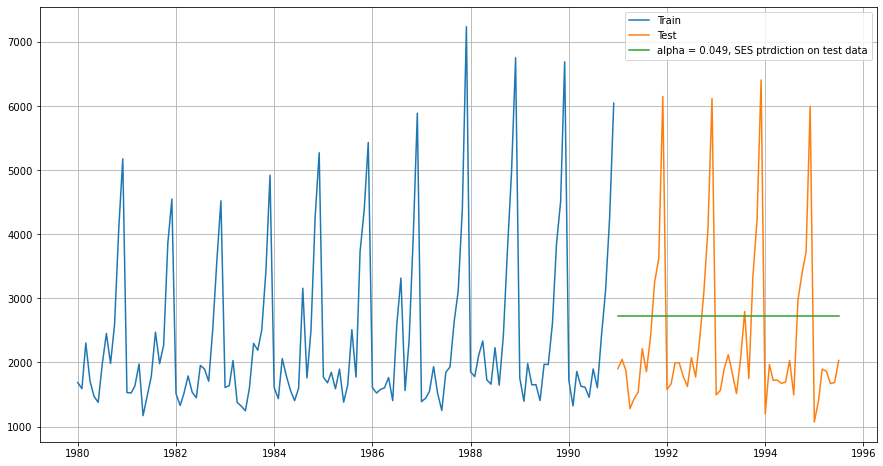

In [429]:
plt.plot(sparkling_train["Sparkling"], label = "Train")
plt.plot(sparkling_test["Sparkling"], label = "Test")
plt.plot(sparkling_test_pred_SES, label = "alpha = 0.049, SES ptrdiction on test data")
plt.legend(loc = "best")
plt.grid();

In [430]:
rmse_sparkling_test_SES = metrics.mean_squared_error(sparkling_test["Sparkling"],sparkling_test_pred_SES, squared = False)

In [431]:
rmse_sparkling_test_SES

1316.0354872762928

In [432]:
MAPE_sparkling_SES = MAPE(sparkling_test["Sparkling"],sparkling_test_pred_SES)

In [433]:
MAPE_sparkling_SES

45.47

In [434]:
resultsDF_sparkling = pd.DataFrame({"RMSE_Test":(rmse_sparkling_test_SES),
                                  "MAPE":(MAPE_sparkling_SES)
                                  }, index = ["Simple Exponential Smoothing, alpha = 0.049"])

In [435]:
resultsDF_sparkling_SES = pd.DataFrame({"RMSE_Test":(rmse_sparkling_test_SES),
                                  "MAPE":(MAPE_sparkling_SES)
                                  }, index = ["Simple Exponential Smoothing, alpha = 0.049"])

In [436]:
resultsDF_sparkling_SES

,RMSE_Test,MAPE
"Simple Exponential Smoothing, alpha = 0.049",1316.035487,45.47


In [437]:
resultsDF_sparkling_SES

,RMSE_Test,MAPE
"Simple Exponential Smoothing, alpha = 0.049",1316.035487,45.47


**Simple Exponential smoothing based on alpha value**

In [438]:
bestDF_SES_model = pd.DataFrame({"Alpha values":[],
                                    "Test RMSE":[]
})

In [439]:
bestDF_SES_model

,Alpha values,Test RMSE


In [440]:
for i in np.arange(0.01,1,0.01):
    SES_model_alpha_i = SES_sparkling_model_1.fit(smoothing_level = i, optimized = False, use_brute = True)
    SES_sparkling_test["predict",i] = SES_model_alpha_i.forecast(steps = len(SES_sparkling_test))
    
    rmse_model_SES_i = metrics.mean_squared_error(sparkling_test["Sparkling"], SES_sparkling_test["predict",i], squared = False)
    
    bestDF_SES_model = bestDF_SES_model.append({"Alpha values": i,
                                                      "Test RMSE":rmse_model_SES_i
    }, ignore_index = True)

In [441]:
bestDF_SES_model.sort_values(by = "Test RMSE", ascending = True).head()

,Alpha values,Test RMSE
1,0.02,1279.495201
0,0.01,1281.032699
2,0.03,1293.110073
3,0.04,1305.462953
4,0.05,1316.411742


The SES model gives the best result for the alpha value 0.07. Let us look at the predictions and the graph.

In [442]:
SES_model_alpha_02 = SES_sparkling_model_1.fit(smoothing_level = 0.02, optimized = False, use_brute = True)
SES_sparkling_test_predict_best = SES_model_alpha_02.forecast(steps = len(SES_sparkling_test))

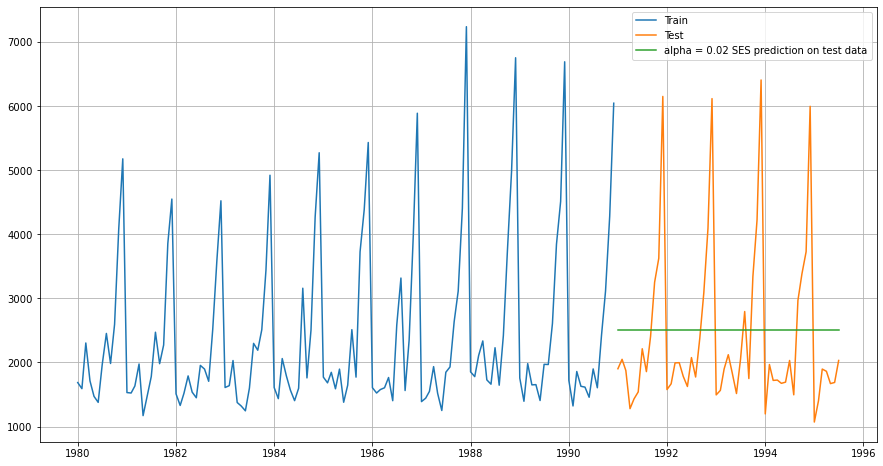

In [443]:
plt.plot(sparkling_train["Sparkling"], label = "Train")
plt.plot(sparkling_test["Sparkling"], label = "Test")
plt.plot(SES_sparkling_test_predict_best, label = "alpha = 0.02 SES prediction on test data")
plt.legend(loc = "best")
plt.grid();

In [444]:
rmse_model_SES_02 = metrics.mean_squared_error(sparkling_test["Sparkling"], SES_sparkling_test_predict_best, squared = False)

In [445]:
rmse_model_SES_02

1279.495200563776

In [446]:
MAPE_sparkling_SES_02 = MAPE(sparkling_test["Sparkling"], SES_sparkling_test_predict_best)

In [447]:
MAPE_sparkling_SES_02

40.97

In [448]:
resultsDF_sparkling_SES_best = pd.DataFrame({"RMSE_Test":(rmse_model_SES_02),
                                  "MAPE":(MAPE_sparkling_SES_02)
                                  }, index = ["Simple Exponential Smoothing, alpha = 0.02"])

In [449]:
resultsDF_sparkling_SES_best

,RMSE_Test,MAPE
"Simple Exponential Smoothing, alpha = 0.02",1279.495201,40.97


In [450]:
resultsDF_sparkling = pd.concat([resultsDF_sparkling,resultsDF_sparkling_SES_best])

In [451]:
resultsDF_sparkling

,RMSE_Test,MAPE
"Simple Exponential Smoothing, alpha = 0.049",1316.035487,45.47
"Simple Exponential Smoothing, alpha = 0.02",1279.495201,40.97


**Double Exponential Smoothing**

In [452]:
DES_sparkling_train = sparkling_train.copy()
DES_sparkling_test = sparkling_test.copy()

In [453]:
DES_sparkling_model_2 = Holt(DES_sparkling_train["Sparkling"])

C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'
C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:427: FutureWarning: After 0.13 initialization must be handled at model creation
  warnings.warn(


In [454]:
DES_sparkling_model_autofit = DES_sparkling_model_2.fit(optimized = True, use_brute = True)

C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:920: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


In [455]:
DES_sparkling_model_autofit.params_formatted

,name,param,optimized
smoothing_level,alpha,0.688571,True
smoothing_trend,beta,0.000100,True
initial_level,l.0,1686.000000,True
initial_trend,b.0,-95.000000,True


In [456]:
sparkling_test_pred_DES = DES_sparkling_model_autofit.forecast(steps = len(DES_sparkling_test))

In [457]:
sparkling_test_pred_DES.head()

1991-01-01    5221.278699
1991-02-01    5127.886554
1991-03-01    5034.494409
1991-04-01    4941.102264
1991-05-01    4847.710119
Freq: MS, dtype: float64

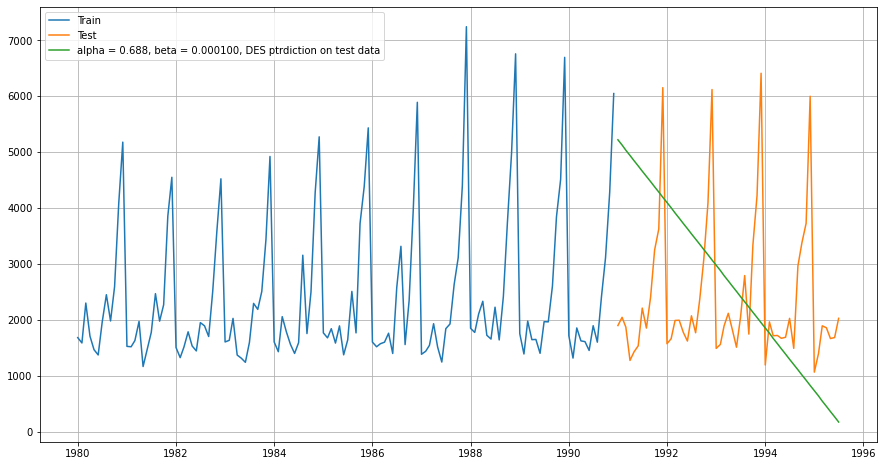

In [458]:
plt.plot(sparkling_train["Sparkling"], label = "Train")
plt.plot(sparkling_test["Sparkling"], label = "Test")
plt.plot(sparkling_test_pred_DES, label = "alpha = 0.688, beta = 0.000100, DES ptrdiction on test data")
plt.legend(loc = "best")
plt.grid();

In [459]:
rmse_sparkling_test_DES = metrics.mean_squared_error(sparkling_test["Sparkling"],sparkling_test_pred_DES, squared = False)

In [460]:
rmse_sparkling_test_DES

2007.238525758568

In [461]:
MAPE_sparkling_DES = MAPE(sparkling_test["Sparkling"],sparkling_test_pred_DES)

In [462]:
MAPE_sparkling_DES

68.23

In [463]:
resultsDF_sparkling_DES = pd.DataFrame({"RMSE_Test":(rmse_sparkling_test_DES),
                                  "MAPE":(MAPE_sparkling_DES)
                                  }, index = ["Double Exponential Smoothing, alpha = 0.688, beta = 0.000100"])

In [464]:
resultsDF_sparkling_DES 

,RMSE_Test,MAPE
"Double Exponential Smoothing, alpha = 0.688, beta = 0.000100",2007.238526,68.23


In [465]:
resultsDF_sparkling = pd.concat([resultsDF_sparkling,resultsDF_sparkling_DES])

In [466]:
resultsDF_sparkling

,RMSE_Test,MAPE
"Simple Exponential Smoothing, alpha = 0.049",1316.035487,45.47
"Simple Exponential Smoothing, alpha = 0.02",1279.495201,40.97
"Double Exponential Smoothing, alpha = 0.688, beta = 0.000100",2007.238526,68.23


**Double Explonential model using best alpha and beta values**

In [467]:
bestDF_DES_model = pd.DataFrame({"Alpha values":[],
                                 "Beta values":[], 
                                    "Test RMSE":[]
})

In [468]:
bestDF_DES_model

,Alpha values,Beta values,Test RMSE


In [469]:
for i in np.arange(0.01,1,0.01):
    for j in np.arange(0.01,1,0.01):
        DES_model_alpha_i_j = DES_sparkling_model_2.fit(smoothing_level = i, smoothing_trend = j, optimized = False, use_brute = True)
        DES_sparkling_test["predict",i,j] = DES_model_alpha_i_j.forecast(steps = len(DES_sparkling_test))
    
        rmse_model_DES_i_j = metrics.mean_squared_error(sparkling_test["Sparkling"], DES_sparkling_test["predict",i,j], squared = False)
    
        bestDF_DES_model = bestDF_DES_model.append({"Alpha values": i, 
                                                    "Beta values": j, 
                                                    "Test RMSE":rmse_model_DES_i_j}, ignore_index = True)  


In [470]:
bestDF_DES_model.sort_values(by = "Test RMSE", ascending = True).head()

,Alpha values,Beta values,Test RMSE
148,0.02,0.50,1274.630824
115,0.02,0.17,1275.105310
254,0.03,0.57,1276.025836
255,0.03,0.58,1278.425944
253,0.03,0.56,1278.585750


In [471]:
 DES_model_alpha_02_beta_50 = DES_sparkling_model_2.fit(smoothing_level = 0.02, smoothing_trend = 0.50, optimized = False, use_brute = True)
DES_sparkling_test_predict_best = DES_model_alpha_02_beta_50.forecast(steps = len(DES_sparkling_test))

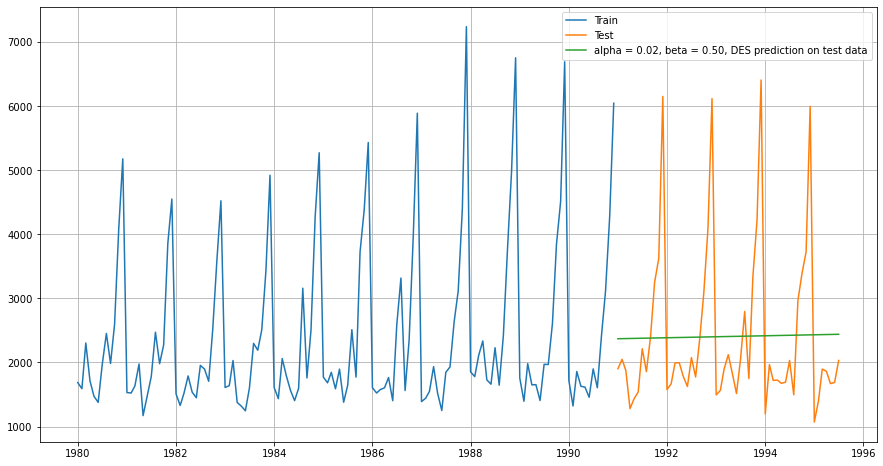

In [472]:
plt.plot(sparkling_train["Sparkling"], label = "Train")
plt.plot(sparkling_test["Sparkling"], label = "Test")
plt.plot(DES_sparkling_test_predict_best, label = "alpha = 0.02, beta = 0.50, DES prediction on test data")
plt.legend(loc = "best")
plt.grid(); 

In [473]:
rmse_model_DES_02_50 = metrics.mean_squared_error(sparkling_test["Sparkling"], DES_sparkling_test_predict_best, squared = False)

In [474]:
rmse_model_DES_02_50

1274.6308241713034

In [475]:
MAPE_sparkling_DES_02_50 = MAPE(sparkling_test["Sparkling"], DES_sparkling_test_predict_best)

In [476]:
MAPE_sparkling_DES_02_50

38.9

In [477]:
resultsDF_sparkling_DES_best = pd.DataFrame({"RMSE_Test":(rmse_model_DES_02_50),
                                  "MAPE":(MAPE_sparkling_DES_02_50)
                                  }, index = ["Double Exponential Smoothing, alpha = 0.02, beta = 0.50"])

In [478]:
resultsDF_sparkling_DES_best

,RMSE_Test,MAPE
"Double Exponential Smoothing, alpha = 0.02, beta = 0.50",1274.630824,38.9


In [479]:
resultsDF_sparkling = pd.concat([resultsDF_sparkling,resultsDF_sparkling_DES_best])

In [480]:
resultsDF_sparkling

,RMSE_Test,MAPE
"Simple Exponential Smoothing, alpha = 0.049",1316.035487,45.47
"Simple Exponential Smoothing, alpha = 0.02",1279.495201,40.97
"Double Exponential Smoothing, alpha = 0.688, beta = 0.000100",2007.238526,68.23
"Double Exponential Smoothing, alpha = 0.02, beta = 0.50",1274.630824,38.90


**Triple Exponential Model Additive**

In [481]:
TES_sparkling_train = sparkling_train.copy()
TES_sparkling_test = sparkling_test.copy()

In [482]:
TES_sparkling_model_4 = ExponentialSmoothing(TES_sparkling_train["Sparkling"], trend = "additive", seasonal = "additive")

C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'
C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:427: FutureWarning: After 0.13 initialization must be handled at model creation
  warnings.warn(


In [483]:
TES_model_4_autofit_sparkling = TES_sparkling_model_4.fit(optimized = True, use_brute = True)

In [484]:
TES_model_4_autofit_sparkling.params

{'smoothing_level': 0.11235974440805609,
 'smoothing_trend': 0.03742154913668688,
 'smoothing_seasonal': 0.4932616459048464,
 'damping_trend': nan,
 'initial_level': 1640.2806120050896,
 'initial_trend': -3.261533670070838,
 'initial_seasons': array([  45.86595538,  -48.96808341,  662.32406973,   73.10075169,
        -168.81341007, -262.13208801,  326.10174942,  813.36401315,
         344.51476989,  956.12012048, 2446.68553948, 3538.12189099]),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [485]:
sparkling_test_pred_TES_4 = TES_model_4_autofit_sparkling.forecast(steps = len(TES_sparkling_test))

In [486]:
sparkling_test_pred_TES_4.head()

1991-01-01    1474.966680
1991-02-01    1169.991432
1991-03-01    1658.920133
1991-04-01    1504.953983
1991-05-01    1417.648032
Freq: MS, dtype: float64

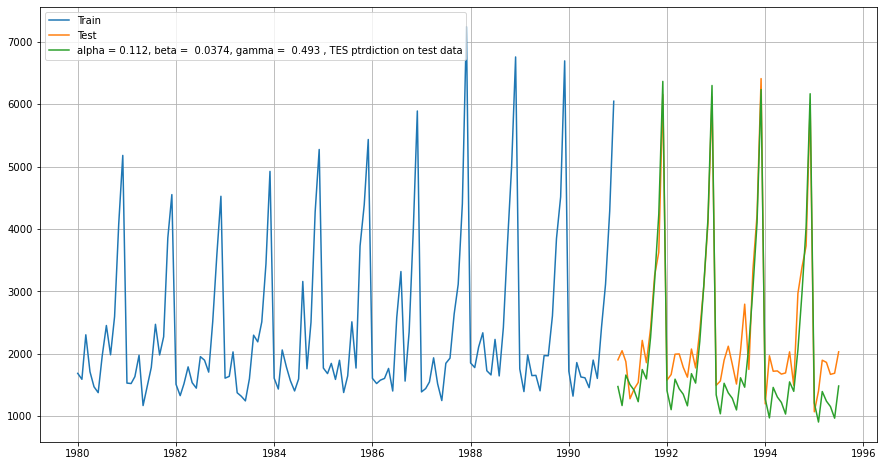

In [487]:
plt.plot(sparkling_train["Sparkling"], label = "Train")
plt.plot(sparkling_test["Sparkling"], label = "Test")
plt.plot(sparkling_test_pred_TES_4, label = "alpha = 0.112, beta =  0.0374, gamma =  0.493 , TES ptrdiction on test data")
plt.legend(loc = "best")
plt.grid();

In [488]:
rmse_sparkling_test_TES_4 = metrics.mean_squared_error(sparkling_test["Sparkling"],sparkling_test_pred_TES_4, squared = False)

In [489]:
rmse_sparkling_test_TES_4

473.15241738838444

In [490]:
MAPE_sparkling_TES_4 = MAPE(sparkling_test["Sparkling"],sparkling_test_pred_TES_4)

In [491]:
MAPE_sparkling_TES_4

16.53

In [492]:
resultsDF_sparkling_TES_4 = pd.DataFrame({"RMSE_Test":(rmse_sparkling_test_TES_4),
                                  "MAPE":(MAPE_sparkling_TES_4)
                                  }, index = ["Triple Exponential Smoothing (Additive), alpha = 0.112, beta =  0.0374, gamma =  0.493"])

In [493]:
resultsDF_sparkling_TES_4

,RMSE_Test,MAPE
"Triple Exponential Smoothing (Additive), alpha = 0.112, beta = 0.0374, gamma = 0.493",473.152417,16.53


In [494]:
resultsDF_sparkling = pd.concat([resultsDF_sparkling,resultsDF_sparkling_TES_4])

In [495]:
resultsDF_sparkling

,RMSE_Test,MAPE
"Simple Exponential Smoothing, alpha = 0.049",1316.035487,45.47
"Simple Exponential Smoothing, alpha = 0.02",1279.495201,40.97
"Double Exponential Smoothing, alpha = 0.688, beta = 0.000100",2007.238526,68.23
"Double Exponential Smoothing, alpha = 0.02, beta = 0.50",1274.630824,38.90
"Triple Exponential Smoothing (Additive), alpha = 0.112, beta = 0.0374, gamma = 0.493",473.152417,16.53


**Triple Exponential Smoothing Additive based on alpha beta and gamma values**

In [496]:
bestDF_TES_model = pd.DataFrame({"Alpha values":[],
                                 "Beta values":[], 
                                 "Gamma values":[],
                                 "Test RMSE":[]
})

In [497]:
bestDF_TES_model

,Alpha values,Beta values,Gamma values,Test RMSE


In [498]:
for i in np.arange(0.1,1,0.1):
    for j in np.arange(0.1,1,0.1):
        for k in np.arange(0.1,1,0.1):
            TES_model_alpha_i_j_k = TES_sparkling_model_4.fit(smoothing_level = i, smoothing_trend = j, smoothing_seasonal = k, optimized = False, use_brute = True)
            TES_sparkling_test["predict",i,j,k] = TES_model_alpha_i_j_k.forecast(steps = len(TES_sparkling_test))
    
            rmse_model_TES_i_j_k = metrics.mean_squared_error(sparkling_test["Sparkling"], TES_sparkling_test["predict",i,j,k], squared = False)
    
            bestDF_TES_model = bestDF_TES_model.append({"Alpha values": i, 
                                                        "Beta values": j, 
                                                        "Gamma values": k, 
                                                        "Test RMSE":rmse_model_TES_i_j_k}, ignore_index = True)


In [499]:
bestDF_TES_model.sort_values(by = "Test RMSE", ascending = True).head()

,Alpha values,Beta values,Gamma values,Test RMSE
77,0.1,0.9,0.6,338.458417
90,0.2,0.2,0.1,343.715412
27,0.1,0.4,0.1,346.302722
244,0.4,0.1,0.2,365.192054
162,0.3,0.1,0.1,372.390945


In [500]:
TES_model_alpha_1_beta_9_gamma_6 = TES_sparkling_model_4.fit(smoothing_level = 0.1, smoothing_trend = 0.9, smoothing_seasonal = 0.6,  optimized = False, use_brute = True)
TES_sparkling_test_predict_best = TES_model_alpha_1_beta_9_gamma_6.forecast(steps = len(TES_sparkling_test))

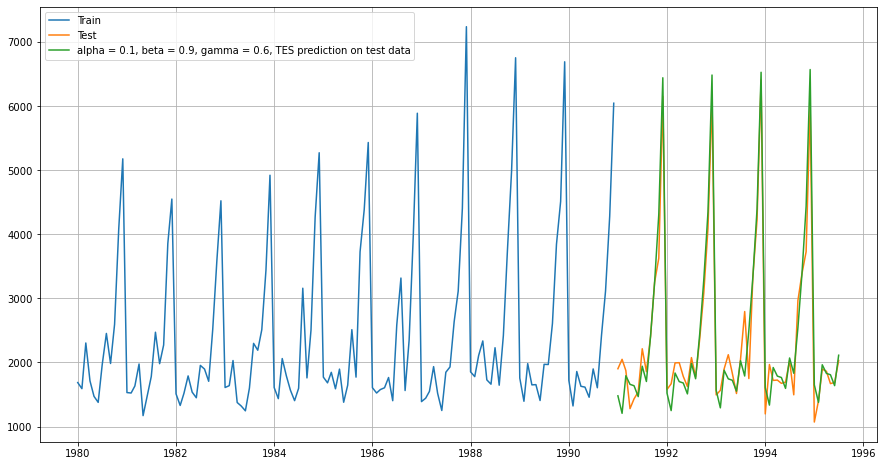

In [501]:
plt.plot(sparkling_train["Sparkling"], label = "Train")
plt.plot(sparkling_test["Sparkling"], label = "Test")
plt.plot(TES_sparkling_test_predict_best, label = "alpha = 0.1, beta = 0.9, gamma = 0.6, TES prediction on test data")
plt.legend(loc = "best")
plt.grid();

In [502]:
rmse_model_TES_1_9_6 = metrics.mean_squared_error(sparkling_test["Sparkling"], TES_sparkling_test_predict_best, squared = False)

In [503]:
rmse_model_TES_1_9_6

338.45841695626206

In [504]:
MAPE_sparkling_TES_1_9_6 = MAPE(sparkling_test["Sparkling"], TES_sparkling_test_predict_best)

In [505]:
MAPE_sparkling_TES_1_9_6

9.93

In [506]:
resultsDF_sparkling_TES_best = pd.DataFrame({"RMSE_Test":(rmse_model_TES_1_9_6),
                                  "MAPE":(MAPE_sparkling_TES_1_9_6)
                                  }, index = ["Triple Exponential Smoothing (Additive) , alpha = 0.1, beta = 0.9, gamma = 0.6"])

In [507]:
resultsDF_sparkling_TES_best

,RMSE_Test,MAPE
"Triple Exponential Smoothing (Additive) , alpha = 0.1, beta = 0.9, gamma = 0.6",338.458417,9.93


In [508]:
resultsDF_sparkling = pd.concat([resultsDF_sparkling,resultsDF_sparkling_TES_best])

In [509]:
resultsDF_sparkling

,RMSE_Test,MAPE
"Simple Exponential Smoothing, alpha = 0.049",1316.035487,45.47
"Simple Exponential Smoothing, alpha = 0.02",1279.495201,40.97
"Double Exponential Smoothing, alpha = 0.688, beta = 0.000100",2007.238526,68.23
"Double Exponential Smoothing, alpha = 0.02, beta = 0.50",1274.630824,38.90
"Triple Exponential Smoothing (Additive), alpha = 0.112, beta = 0.0374, gamma = 0.493",473.152417,16.53
"Triple Exponential Smoothing (Additive) , alpha = 0.1, beta = 0.9, gamma = 0.6",338.458417,9.93


**Regression Model**

In [510]:
lr_sparkling_5 = LinearRegression()

In [511]:
LinReg_sparkling_train = sparkling_train.copy()
LinReg_sparkling_test = sparkling_test.copy()

In [512]:
sparkling_train_time = [i+1 for i in range(len(sparkling_train))]
sparkling_test_time = [i+133 for i in range(len(sparkling_test))]

In [513]:
LinReg_sparkling_train["time"] = sparkling_train_time
LinReg_sparkling_test["time"] = sparkling_test_time

In [514]:
LinReg_sparkling_train.head()

,Sparkling,time
YearMonth,,
1980-01-01,1686,1
1980-02-01,1591,2
1980-03-01,2304,3
1980-04-01,1712,4
1980-05-01,1471,5


In [515]:
LinReg_sparkling_train.tail()

,Sparkling,time
YearMonth,,
1990-08-01,1605,128
1990-09-01,2424,129
1990-10-01,3116,130
1990-11-01,4286,131
1990-12-01,6047,132


In [516]:
LinReg_sparkling_test.head()

,Sparkling,time
YearMonth,,
1991-01-01,1902,133
1991-02-01,2049,134
1991-03-01,1874,135
1991-04-01,1279,136
1991-05-01,1432,137


In [517]:
LinReg_sparkling_test.tail()

,Sparkling,time
YearMonth,,
1995-03-01,1897,183
1995-04-01,1862,184
1995-05-01,1670,185
1995-06-01,1688,186
1995-07-01,2031,187


In [518]:
lr_sparkling_5.fit(LinReg_sparkling_train[["time"]],LinReg_sparkling_train["Sparkling"])

LinearRegression()

In [519]:
sparkling_train_pred_lr = lr_sparkling_5.predict(LinReg_sparkling_train[["time"]])

In [520]:
LinReg_sparkling_train["Reg_on_Time"] = sparkling_train_pred_lr

In [521]:
sparkling_test_pred_lr = lr_sparkling_5.predict(LinReg_sparkling_test[["time"]])

In [522]:
LinReg_sparkling_test["Reg_on_Time"] = sparkling_test_pred_lr

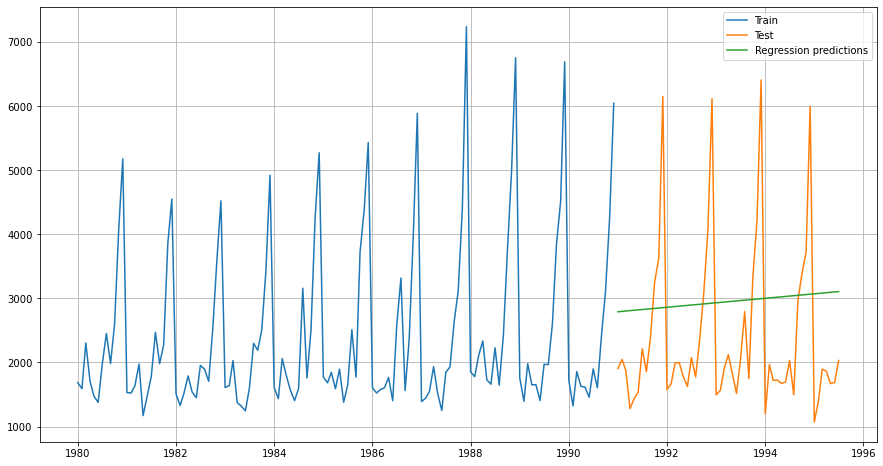

In [523]:
plt.plot(sparkling_train["Sparkling"], label = "Train")
plt.plot(sparkling_test["Sparkling"], label = "Test")
plt.plot(LinReg_sparkling_test["Reg_on_Time"], label = "Regression predictions")
plt.legend(loc = "best")
plt.grid();

In [524]:
rmse_sparkling_test_lr = metrics.mean_squared_error(sparkling_test["Sparkling"],sparkling_test_pred_lr, squared = False)

In [525]:
rmse_sparkling_test_lr

1389.135174897992

In [526]:
MAPE_sparkling_lr = MAPE(sparkling_test["Sparkling"],sparkling_test_pred_lr)

In [527]:
MAPE_sparkling_lr

50.15

In [528]:
resultsDF_sparkling_lr = pd.DataFrame({"RMSE_Test":(rmse_sparkling_test_lr),
                                  "MAPE":(MAPE_sparkling_lr)
                                  }, index = ["Linear Regression"])

In [529]:
resultsDF_sparkling_lr

,RMSE_Test,MAPE
Linear Regression,1389.135175,50.15


In [530]:
resultsDF_sparkling = pd.concat([resultsDF_sparkling,resultsDF_sparkling_lr])

In [531]:
resultsDF_sparkling

,RMSE_Test,MAPE
"Simple Exponential Smoothing, alpha = 0.049",1316.035487,45.47
"Simple Exponential Smoothing, alpha = 0.02",1279.495201,40.97
"Double Exponential Smoothing, alpha = 0.688, beta = 0.000100",2007.238526,68.23
"Double Exponential Smoothing, alpha = 0.02, beta = 0.50",1274.630824,38.90
"Triple Exponential Smoothing (Additive), alpha = 0.112, beta = 0.0374, gamma = 0.493",473.152417,16.53
"Triple Exponential Smoothing (Additive) , alpha = 0.1, beta = 0.9, gamma = 0.6",338.458417,9.93
Linear Regression,1389.135175,50.15


**Naive Model**

In [532]:
Naive_sparkling_train = sparkling_train.copy()
Naive_sparkling_test = sparkling_test.copy()

In [533]:
sparkling_train.tail()

,Sparkling
YearMonth,
1990-08-01,1605
1990-09-01,2424
1990-10-01,3116
1990-11-01,4286
1990-12-01,6047


In [534]:
Naive_sparkling_test["Naive"] = 6047

In [535]:
Naive_sparkling_test["Naive"].head()

YearMonth
1991-01-01    6047
1991-02-01    6047
1991-03-01    6047
1991-04-01    6047
1991-05-01    6047
Name: Naive, dtype: int64

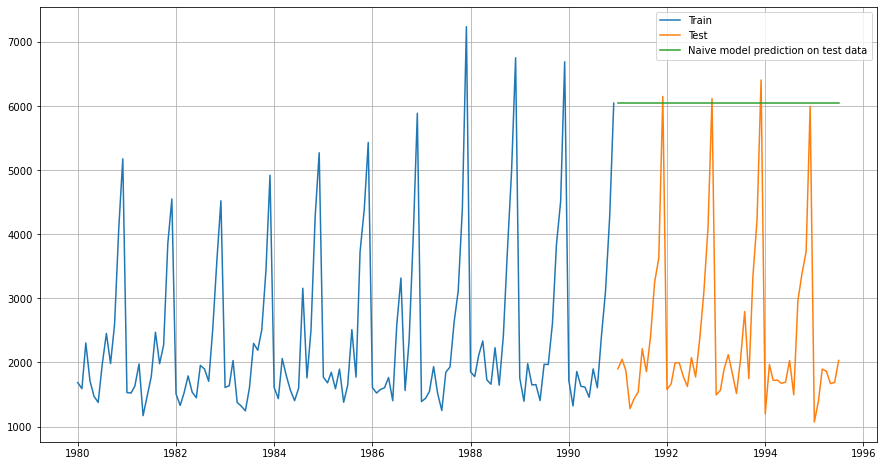

In [536]:
plt.plot(Naive_sparkling_train["Sparkling"], label = "Train")
plt.plot(Naive_sparkling_test["Sparkling"], label = "Test")
plt.plot(Naive_sparkling_test["Naive"], label = "Naive model prediction on test data")
plt.legend(loc = "best")
plt.grid();

In [537]:
rmse_sparkling_test_naive = metrics.mean_squared_error(Naive_sparkling_test["Sparkling"],Naive_sparkling_test["Naive"], squared = False)

In [538]:
rmse_sparkling_test_naive

3864.2793518443914

In [539]:
MAPE_sparkling_naive = MAPE(Naive_sparkling_test["Sparkling"],Naive_sparkling_test["Naive"])

In [540]:
MAPE_sparkling_naive

152.87

In [541]:
resultsDF_sparkling_naive = pd.DataFrame({"RMSE_Test":(rmse_sparkling_test_naive),
                                  "MAPE":(MAPE_sparkling_naive)
                                  }, index = ["Naive Model"])

In [542]:
resultsDF_sparkling_naive 

,RMSE_Test,MAPE
Naive Model,3864.279352,152.87


In [543]:
resultsDF_sparkling = pd.concat([resultsDF_sparkling,resultsDF_sparkling_naive])

In [544]:
resultsDF_sparkling

,RMSE_Test,MAPE
"Simple Exponential Smoothing, alpha = 0.049",1316.035487,45.47
"Simple Exponential Smoothing, alpha = 0.02",1279.495201,40.97
"Double Exponential Smoothing, alpha = 0.688, beta = 0.000100",2007.238526,68.23
"Double Exponential Smoothing, alpha = 0.02, beta = 0.50",1274.630824,38.90
"Triple Exponential Smoothing (Additive), alpha = 0.112, beta = 0.0374, gamma = 0.493",473.152417,16.53
"Triple Exponential Smoothing (Additive) , alpha = 0.1, beta = 0.9, gamma = 0.6",338.458417,9.93
Linear Regression,1389.135175,50.15
Naive Model,3864.279352,152.87


**Simple Average Model**

In [545]:
Simp_Avg_sparkling_train = sparkling_train.copy()
Simp_Avg_sparkling_test = sparkling_test.copy()

In [546]:
Simp_Avg_sparkling_test["Mean_forecast"] = sparkling_train["Sparkling"].mean()

In [547]:
Simp_Avg_sparkling_test.head()

,Sparkling,Mean_forecast
YearMonth,,
1991-01-01,1902,2403.780303
1991-02-01,2049,2403.780303
1991-03-01,1874,2403.780303
1991-04-01,1279,2403.780303
1991-05-01,1432,2403.780303


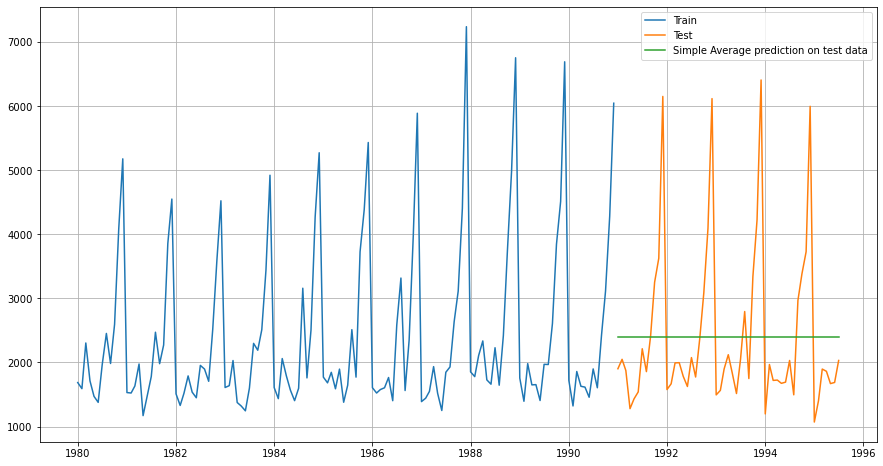

In [548]:
plt.plot(Simp_Avg_sparkling_train["Sparkling"], label = "Train")
plt.plot(Simp_Avg_sparkling_test["Sparkling"], label = "Test")
plt.plot(Simp_Avg_sparkling_test["Mean_forecast"], label = "Simple Average prediction on test data")
plt.legend(loc = "best")
plt.grid();

In [549]:
rmse_sparkling_test_simp_avg = metrics.mean_squared_error(Simp_Avg_sparkling_test["Sparkling"],Simp_Avg_sparkling_test["Mean_forecast"], squared = False)

In [550]:
rmse_sparkling_test_simp_avg

1275.0818036965309

In [551]:
MAPE_sparkling_simp_avg = MAPE(Simp_Avg_sparkling_test["Sparkling"],Simp_Avg_sparkling_test["Mean_forecast"])

In [552]:
MAPE_sparkling_simp_avg

38.9

In [553]:
resultsDF_sparkling_simp_avg = pd.DataFrame({"RMSE_Test":(rmse_sparkling_test_simp_avg),
                                  "MAPE":(MAPE_sparkling_simp_avg)
                                  }, index = ["Simple Average Model"])

In [554]:
resultsDF_sparkling_simp_avg

,RMSE_Test,MAPE
Simple Average Model,1275.081804,38.9


In [555]:
resultsDF_sparkling = pd.concat([resultsDF_sparkling,resultsDF_sparkling_simp_avg])

In [556]:
resultsDF_sparkling

,RMSE_Test,MAPE
"Simple Exponential Smoothing, alpha = 0.049",1316.035487,45.47
"Simple Exponential Smoothing, alpha = 0.02",1279.495201,40.97
"Double Exponential Smoothing, alpha = 0.688, beta = 0.000100",2007.238526,68.23
"Double Exponential Smoothing, alpha = 0.02, beta = 0.50",1274.630824,38.90
"Triple Exponential Smoothing (Additive), alpha = 0.112, beta = 0.0374, gamma = 0.493",473.152417,16.53
"Triple Exponential Smoothing (Additive) , alpha = 0.1, beta = 0.9, gamma = 0.6",338.458417,9.93
Linear Regression,1389.135175,50.15
Naive Model,3864.279352,152.87
Simple Average Model,1275.081804,38.90


**Moving Average model**

In [557]:
Moving_Average_sparkling = sparkling_df.copy()

In [558]:
Moving_Average_sparkling.head()

,Sparkling
YearMonth,
1980-01-01,1686
1980-02-01,1591
1980-03-01,2304
1980-04-01,1712
1980-05-01,1471


In [559]:
Moving_Average_sparkling["Trailing_2"] = Moving_Average_sparkling["Sparkling"].rolling(2).mean()
Moving_Average_sparkling["Trailing_4"] = Moving_Average_sparkling["Sparkling"].rolling(4).mean()
Moving_Average_sparkling["Trailing_6"] = Moving_Average_sparkling["Sparkling"].rolling(6).mean()
Moving_Average_sparkling["Trailing_9"] = Moving_Average_sparkling["Sparkling"].rolling(9).mean()

In [560]:
Moving_Average_sparkling.head()

,Sparkling,Trailing_2,Trailing_4,Trailing_6,Trailing_9
YearMonth,,,,,
1980-01-01,1686,NaN,NaN,NaN,NaN
1980-02-01,1591,1638.5,NaN,NaN,NaN
1980-03-01,2304,1947.5,NaN,NaN,NaN
1980-04-01,1712,2008.0,1823.25,NaN,NaN
1980-05-01,1471,1591.5,1769.50,NaN,NaN


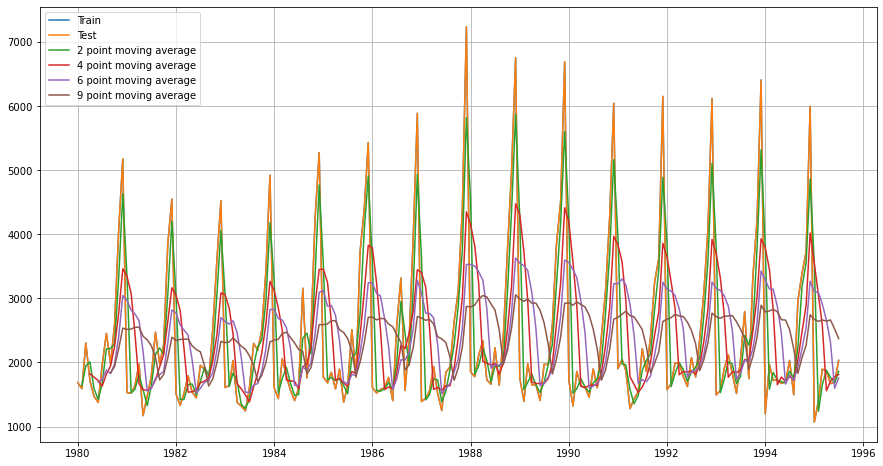

In [561]:
plt.plot(Moving_Average_sparkling["Sparkling"], label = "Train")
plt.plot(Moving_Average_sparkling["Sparkling"], label = "Test")
plt.plot(Moving_Average_sparkling["Trailing_2"], label = "2 point moving average")
plt.plot(Moving_Average_sparkling["Trailing_4"], label = "4 point moving average")
plt.plot(Moving_Average_sparkling["Trailing_6"], label = "6 point moving average")
plt.plot(Moving_Average_sparkling["Trailing_9"], label = "9 point moving average")
plt.legend(loc = "best")
plt.grid();

In [562]:
Trailing_Moving_Average_sparkling_train = Moving_Average_sparkling[Moving_Average_sparkling.index<"1991"]
Trailing_Moving_Average_sparkling_test = Moving_Average_sparkling[Moving_Average_sparkling.index>="1991"]

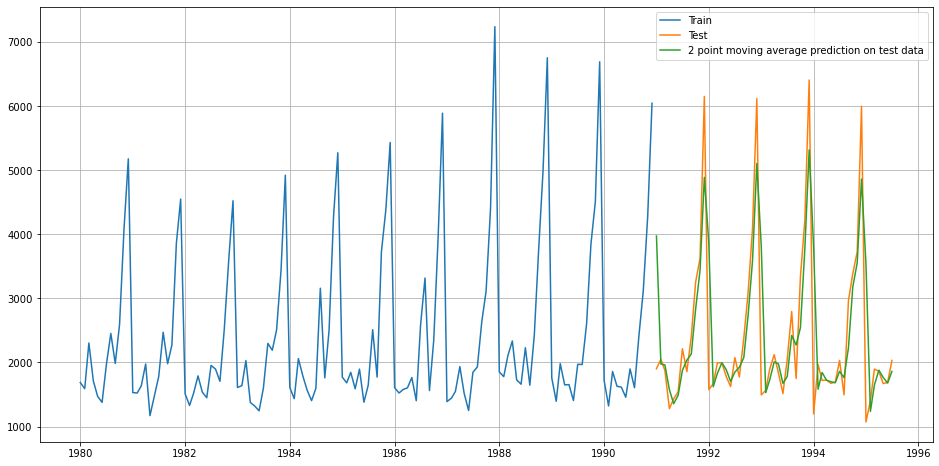

In [563]:
plt.figure(figsize=(16,8))
plt.plot(Trailing_Moving_Average_sparkling_train["Sparkling"], label = "Train")
plt.plot(Trailing_Moving_Average_sparkling_test["Sparkling"], label = "Test")
plt.plot(Trailing_Moving_Average_sparkling_test["Trailing_2"], label = "2 point moving average prediction on test data")
plt.legend(loc = "best")
plt.grid();

In [564]:
rmse_sparkling_test_moving_avg_2 = metrics.mean_squared_error(Trailing_Moving_Average_sparkling_test["Sparkling"],Trailing_Moving_Average_sparkling_test["Trailing_2"], squared = False)

In [565]:
rmse_sparkling_test_moving_avg_2

813.4006839972983

In [566]:
MAPE_sparkling_mving_avg_2 = MAPE(Trailing_Moving_Average_sparkling_test["Sparkling"],Trailing_Moving_Average_sparkling_test["Trailing_2"])

In [567]:
MAPE_sparkling_mving_avg_2

19.7

In [568]:
resultsDF_sparkling_moving_avg_2 = pd.DataFrame({"RMSE_Test":(rmse_sparkling_test_moving_avg_2),
                                  "MAPE":(MAPE_sparkling_mving_avg_2)
                                  }, index = ["2 point moving average"])

In [569]:
resultsDF_sparkling_moving_avg_2

,RMSE_Test,MAPE
2 point moving average,813.400684,19.7


In [570]:
resultsDF_sparkling = pd.concat([resultsDF_sparkling,resultsDF_sparkling_moving_avg_2])

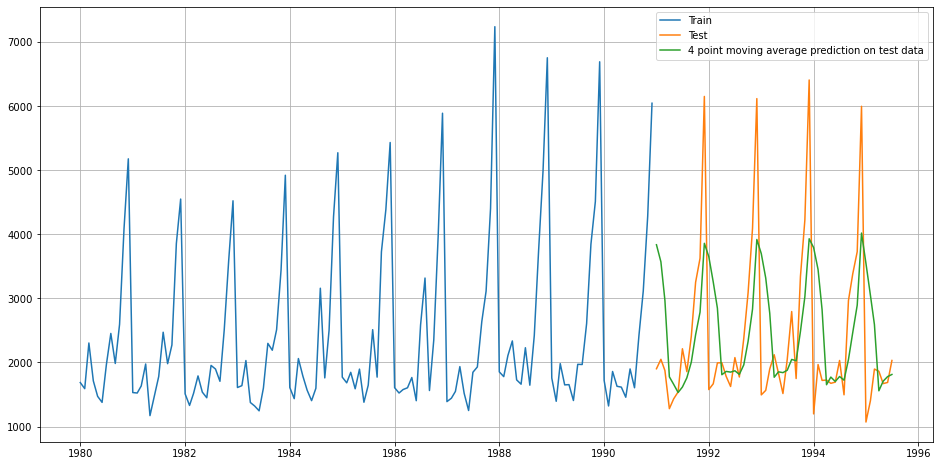

In [571]:
plt.figure(figsize=(16,8))
plt.plot(Trailing_Moving_Average_sparkling_train["Sparkling"], label = "Train")
plt.plot(Trailing_Moving_Average_sparkling_test["Sparkling"], label = "Test")
plt.plot(Trailing_Moving_Average_sparkling_test["Trailing_4"], label = "4 point moving average prediction on test data")
plt.legend(loc = "best")
plt.grid();

In [572]:
rmse_sparkling_test_moving_avg_4 = metrics.mean_squared_error(Trailing_Moving_Average_sparkling_test["Sparkling"],Trailing_Moving_Average_sparkling_test["Trailing_4"], squared = False)

In [573]:
rmse_sparkling_test_moving_avg_4

1156.589694081071

In [574]:
MAPE_sparkling_mving_avg_4 = MAPE(Trailing_Moving_Average_sparkling_test["Sparkling"],Trailing_Moving_Average_sparkling_test["Trailing_4"])

In [575]:
MAPE_sparkling_mving_avg_4

35.96

In [576]:
resultsDF_sparkling_moving_avg_4 = pd.DataFrame({"RMSE_Test":(rmse_sparkling_test_moving_avg_4),
                                  "MAPE":(MAPE_sparkling_mving_avg_4)
                                  }, index = ["4 point moving average"])

In [577]:
resultsDF_sparkling_moving_avg_4

,RMSE_Test,MAPE
4 point moving average,1156.589694,35.96


In [578]:
resultsDF_sparkling = pd.concat([resultsDF_sparkling,resultsDF_sparkling_moving_avg_4])

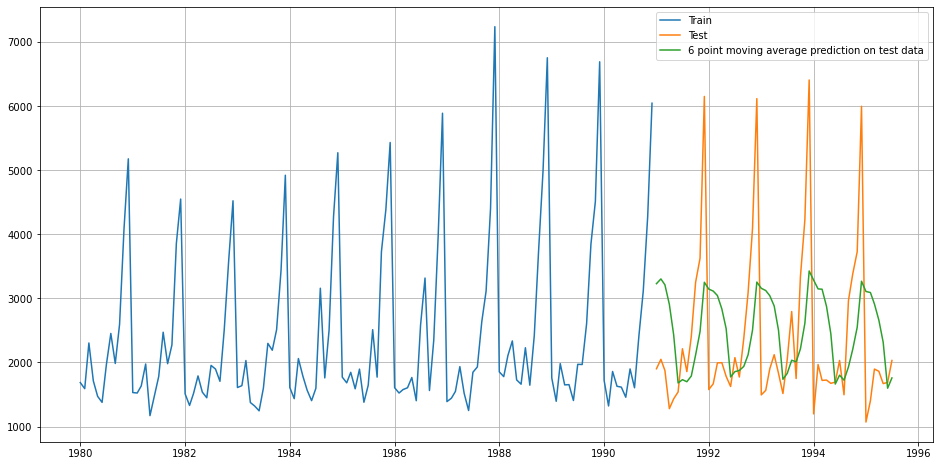

In [579]:
plt.figure(figsize=(16,8))
plt.plot(Trailing_Moving_Average_sparkling_train["Sparkling"], label = "Train")
plt.plot(Trailing_Moving_Average_sparkling_test["Sparkling"], label = "Test")
plt.plot(Trailing_Moving_Average_sparkling_test["Trailing_6"], label = "6 point moving average prediction on test data")
plt.legend(loc = "best")
plt.grid();

In [580]:
rmse_sparkling_test_moving_avg_6 = metrics.mean_squared_error(Trailing_Moving_Average_sparkling_test["Sparkling"],Trailing_Moving_Average_sparkling_test["Trailing_6"], squared = False)

In [581]:
rmse_sparkling_test_moving_avg_6

1283.9274280129855

In [582]:
MAPE_sparkling_mving_avg_6 = MAPE(Trailing_Moving_Average_sparkling_test["Sparkling"],Trailing_Moving_Average_sparkling_test["Trailing_6"])

In [583]:
MAPE_sparkling_mving_avg_6

43.86

In [584]:
resultsDF_sparkling_moving_avg_6 = pd.DataFrame({"RMSE_Test":(rmse_sparkling_test_moving_avg_6),
                                  "MAPE":(MAPE_sparkling_mving_avg_6)
                                  }, index = ["6 point moving average"])

In [585]:
resultsDF_sparkling_moving_avg_6

,RMSE_Test,MAPE
6 point moving average,1283.927428,43.86


In [586]:
resultsDF_sparkling = pd.concat([resultsDF_sparkling,resultsDF_sparkling_moving_avg_6])

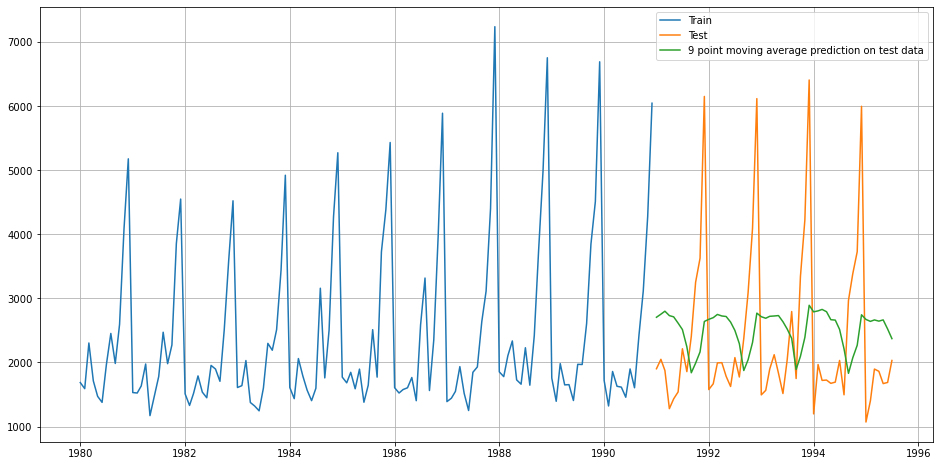

In [587]:
plt.figure(figsize=(16,8))
plt.plot(Trailing_Moving_Average_sparkling_train["Sparkling"], label = "Train")
plt.plot(Trailing_Moving_Average_sparkling_test["Sparkling"], label = "Test")
plt.plot(Trailing_Moving_Average_sparkling_test["Trailing_9"], label = "9 point moving average prediction on test data")
plt.legend(loc = "best")
plt.grid();

In [588]:
rmse_sparkling_test_moving_avg_9 = metrics.mean_squared_error(Trailing_Moving_Average_sparkling_test["Sparkling"],Trailing_Moving_Average_sparkling_test["Trailing_9"], squared = False)

In [589]:
rmse_sparkling_test_moving_avg_9

1346.2783154241804

In [590]:
MAPE_sparkling_mving_avg_9 = MAPE(Trailing_Moving_Average_sparkling_test["Sparkling"],Trailing_Moving_Average_sparkling_test["Trailing_9"])

In [591]:
MAPE_sparkling_mving_avg_9

46.86

In [592]:
resultsDF_sparkling_moving_avg_9 = pd.DataFrame({"RMSE_Test":(rmse_sparkling_test_moving_avg_9),
                                  "MAPE":(MAPE_sparkling_mving_avg_9)
                                  }, index = ["9 point moving average"])

In [593]:
resultsDF_sparkling_moving_avg_9

,RMSE_Test,MAPE
9 point moving average,1346.278315,46.86


In [594]:
resultsDF_sparkling = pd.concat([resultsDF_sparkling,resultsDF_sparkling_moving_avg_9])

In [595]:
resultsDF_sparkling

,RMSE_Test,MAPE
"Simple Exponential Smoothing, alpha = 0.049",1316.035487,45.47
"Simple Exponential Smoothing, alpha = 0.02",1279.495201,40.97
"Double Exponential Smoothing, alpha = 0.688, beta = 0.000100",2007.238526,68.23
"Double Exponential Smoothing, alpha = 0.02, beta = 0.50",1274.630824,38.90
"Triple Exponential Smoothing (Additive), alpha = 0.112, beta = 0.0374, gamma = 0.493",473.152417,16.53
"Triple Exponential Smoothing (Additive) , alpha = 0.1, beta = 0.9, gamma = 0.6",338.458417,9.93
Linear Regression,1389.135175,50.15
Naive Model,3864.279352,152.87
Simple Average Model,1275.081804,38.90
2 point moving average,813.400684,19.70


**5. Check for the stationarity of the data on which the model is being built on using appropriate statistical tests and also mention the hypothesis for the statistical test. If the data is found to be non-stationary, take appropriate steps to make it stationary. Check the new data for stationarity and comment.
Note: Stationarity should be checked at alpha = 0.05.**

To check for Stationarity, we will be performing the Augumented Dickey Fuller test

**Null Hypothesis Ho - The time series has a unit root and thus non-stationary.**

**Alternate Hypothesis Ha - The time series does not have a unit root and thus is stationary.**

Level of Significance - α -0.05

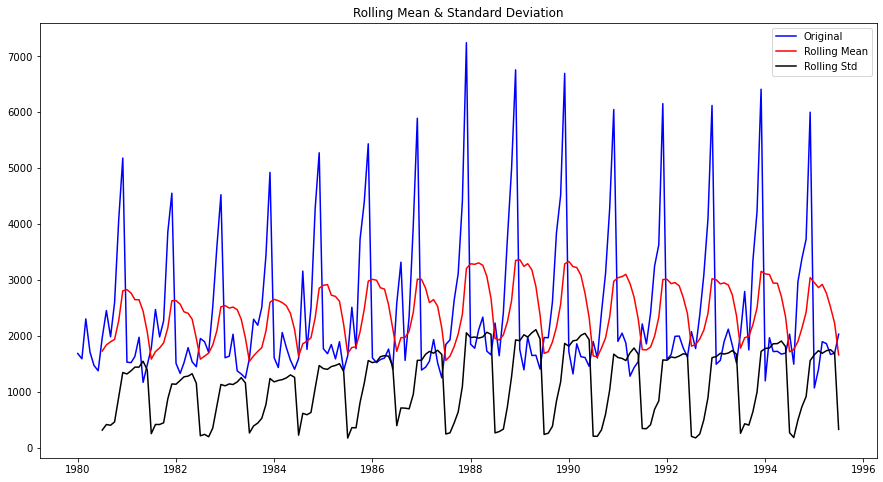

Results of Dickey-Fuller Test:
Test Statistic                  -1.360497
p-value                          0.601061
#Lags Used                      11.000000
Number of Observations Used    175.000000
Critical Value (1%)             -3.468280
Critical Value (5%)             -2.878202
Critical Value (10%)            -2.575653
dtype: float64 



In [596]:
test_stationarity(sparkling_df["Sparkling"])

**The p value (0.601) is more than α (0.05), the significance level.**

**So we fail to rejct the null hypothesis that the time series data is non-stationary,and hence we need to continue with the difference to make the time-series data stationary.**

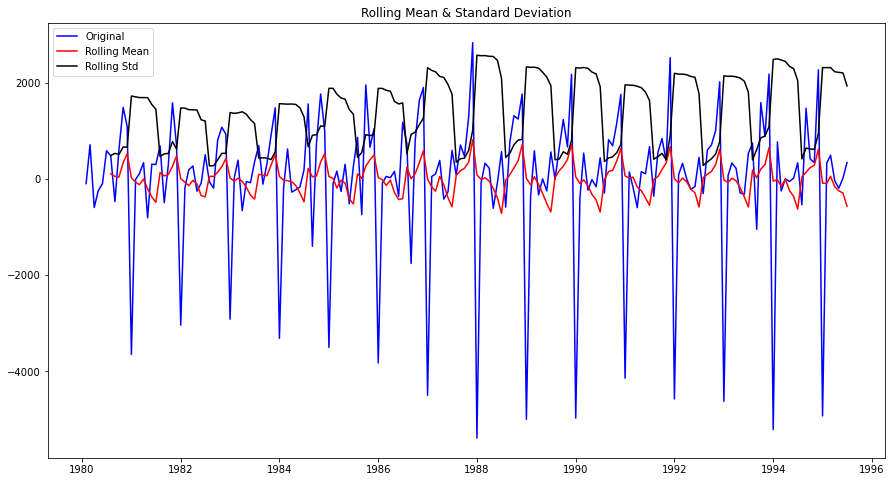

Results of Dickey-Fuller Test:
Test Statistic                 -45.050301
p-value                          0.000000
#Lags Used                      10.000000
Number of Observations Used    175.000000
Critical Value (1%)             -3.468280
Critical Value (5%)             -2.878202
Critical Value (10%)            -2.575653
dtype: float64 



In [597]:
test_stationarity(sparkling_df["Sparkling"].diff().dropna())

**After performing the difference, the value of p (0.0) is less than the α (0.05), the significance level.**

**Hence we reject the null hypothesis that the time-series data is non-stationary, and accepth the alternate hypothesis that the time-series data is stationary.  We have proved that the time series data is stationary at the first difference.**

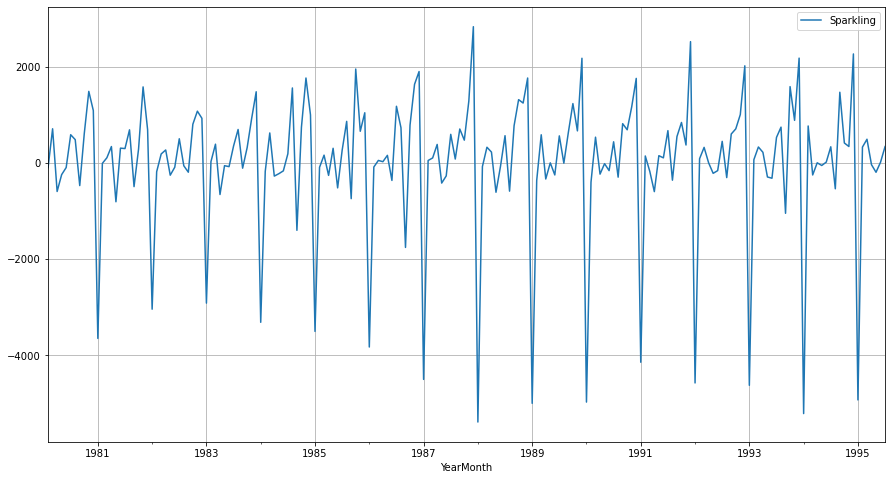

In [598]:
sparkling_df.diff().dropna().plot(grid = True);

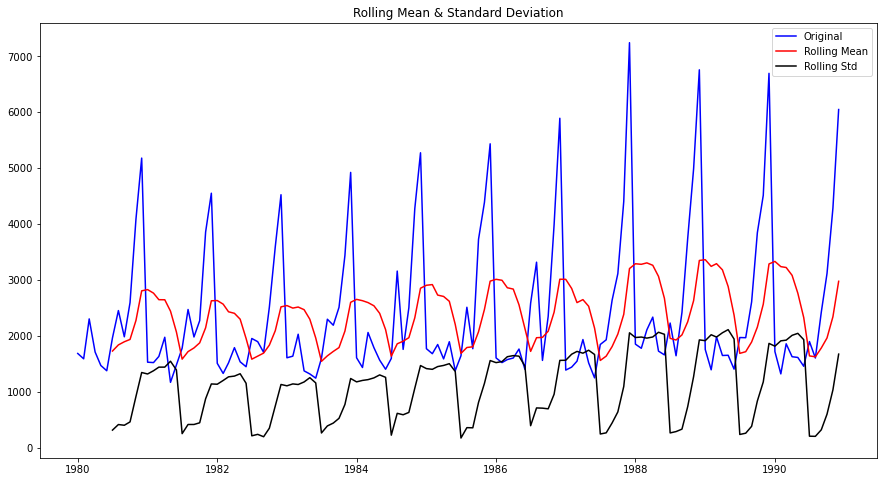

Results of Dickey-Fuller Test:
Test Statistic                  -1.208926
p-value                          0.669744
#Lags Used                      12.000000
Number of Observations Used    119.000000
Critical Value (1%)             -3.486535
Critical Value (5%)             -2.886151
Critical Value (10%)            -2.579896
dtype: float64 



In [599]:
test_stationarity(sparkling_train["Sparkling"])

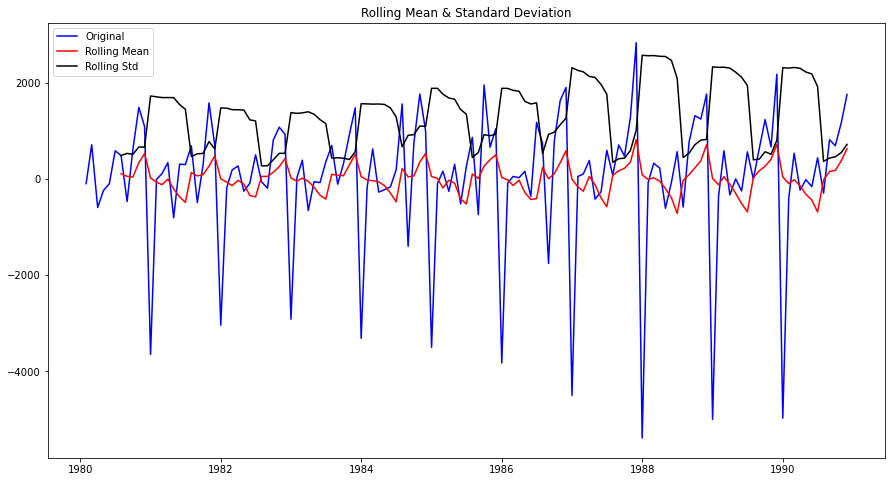

Results of Dickey-Fuller Test:
Test Statistic                -8.005007e+00
p-value                        2.280104e-12
#Lags Used                     1.100000e+01
Number of Observations Used    1.190000e+02
Critical Value (1%)           -3.486535e+00
Critical Value (5%)           -2.886151e+00
Critical Value (10%)          -2.579896e+00
dtype: float64 



In [600]:
test_stationarity(sparkling_train["Sparkling"].diff().dropna())

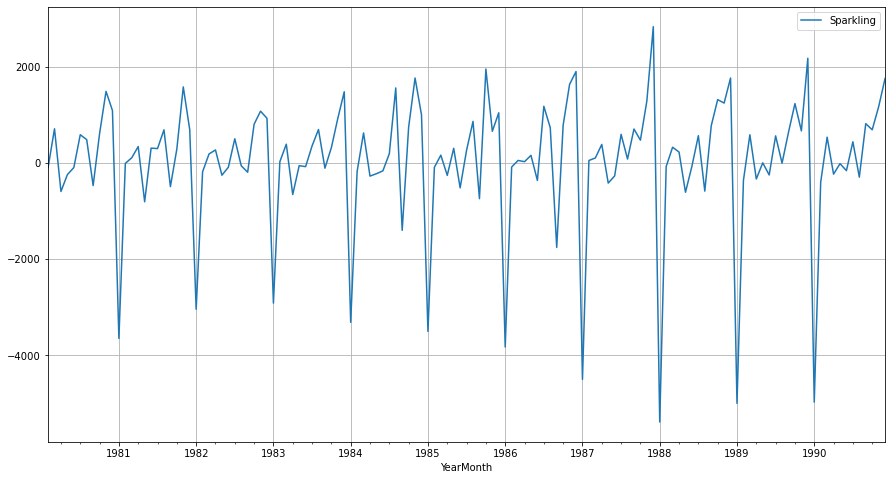

In [601]:
sparkling_train.diff().dropna().plot(grid = True);

**6. Build an automated version of the ARIMA/SARIMA model in which the parameters are selected using the lowest Akaike Information Criteria (AIC) on the training data and evaluate this model on the test data using RMSE.**

**ARIMA model using Lowest AIC value**

In [602]:
Arima_sparkling_train = sparkling_train.copy()
Arima_sparkling_test = sparkling_test.copy()

**Null Hypothesis Ho - The time series has a unit root and thus non-stationary.**

**Alternate Hypothesis Ha - The time series does not have a unit root and thus is stationary.**

Level of Significance - α = 0.05

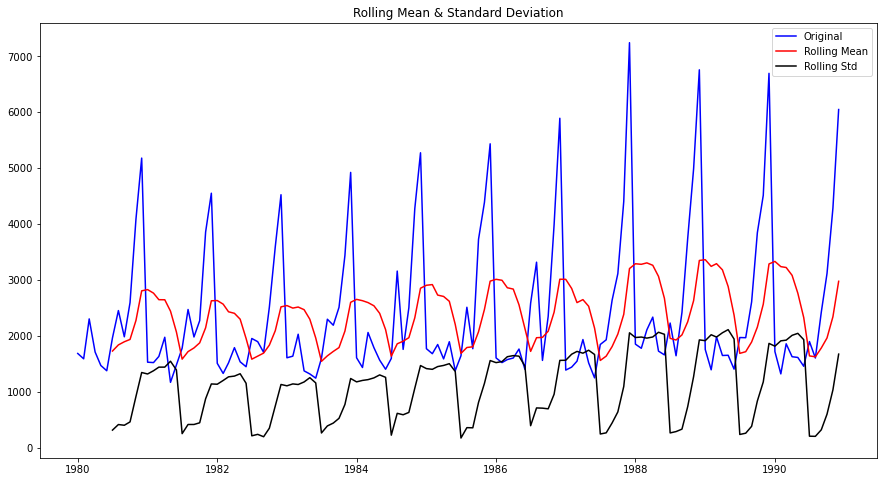

Results of Dickey-Fuller Test:
Test Statistic                  -1.208926
p-value                          0.669744
#Lags Used                      12.000000
Number of Observations Used    119.000000
Critical Value (1%)             -3.486535
Critical Value (5%)             -2.886151
Critical Value (10%)            -2.579896
dtype: float64 



In [603]:
test_stationarity(Arima_sparkling_train)

**The p value (0.669) is more than α (0.05), the significance level.**

**So we fail to rejct the null hypothesis that the time series data is non-stationary,and hence we need to continue with the difference to make the time-series data stationary.**

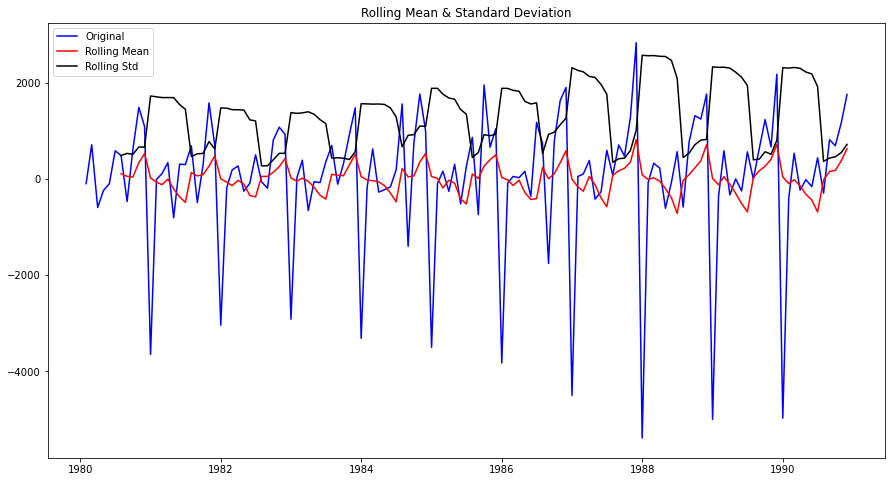

Results of Dickey-Fuller Test:
Test Statistic                -8.005007e+00
p-value                        2.280104e-12
#Lags Used                     1.100000e+01
Number of Observations Used    1.190000e+02
Critical Value (1%)           -3.486535e+00
Critical Value (5%)           -2.886151e+00
Critical Value (10%)          -2.579896e+00
dtype: float64 



In [604]:
test_stationarity(Arima_sparkling_train.diff().dropna())

**After performing the difference, the value of p (2.28e-12) is less than the α (0.05), the significance level.**

**Hence we reject the null hypothesis that the time-series data is non-stationary, and accepth the alternate hypothesis that the time-series data is stationary.  We have proved that the time series data is stationary at the first difference.**

<AxesSubplot:xlabel='YearMonth'>

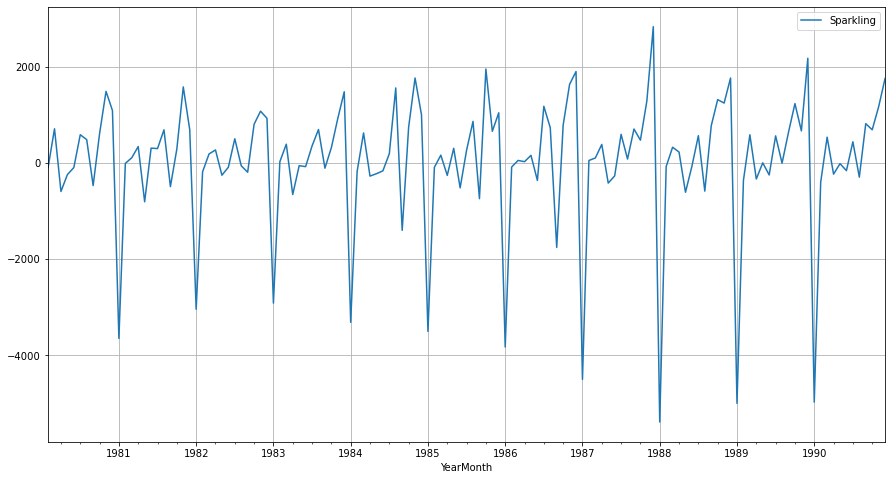

In [605]:
Arima_sparkling_train.diff().dropna().plot(grid = True)

In [606]:
p = range(0,4)
q = range(0,6)
d = range(1,2)

In [607]:
pdq = list(itertools.product(p, d, q))
print("Examples")
for i in range(0,len(pdq)):
    print("Model:{}".format(pdq[i]))

Examples
Model:(0, 1, 0)
Model:(0, 1, 1)
Model:(0, 1, 2)
Model:(0, 1, 3)
Model:(0, 1, 4)
Model:(0, 1, 5)
Model:(1, 1, 0)
Model:(1, 1, 1)
Model:(1, 1, 2)
Model:(1, 1, 3)
Model:(1, 1, 4)
Model:(1, 1, 5)
Model:(2, 1, 0)
Model:(2, 1, 1)
Model:(2, 1, 2)
Model:(2, 1, 3)
Model:(2, 1, 4)
Model:(2, 1, 5)
Model:(3, 1, 0)
Model:(3, 1, 1)
Model:(3, 1, 2)
Model:(3, 1, 3)
Model:(3, 1, 4)
Model:(3, 1, 5)


In [608]:
ARIMA_AIC_sparkling = pd.DataFrame(columns = ["param","AIC"])
ARIMA_AIC_sparkling

,param,AIC


In [609]:
for param in pdq:
    ARIMA_model_sparkling_12 = ARIMA(Arima_sparkling_train["Sparkling"].values, order= param).fit()
    print("ARIMA{} - AIC: {}".format(param, ARIMA_model_sparkling_12.aic))
    ARIMA_AIC_sparkling = ARIMA_AIC_sparkling.append({"param": param,
                                            "AIC" : ARIMA_model_sparkling_12.aic
                                           }, ignore_index = True)

ARIMA(0, 1, 0) - AIC: 2267.6630357855465
ARIMA(0, 1, 1) - AIC: 2263.060015591336
ARIMA(0, 1, 2) - AIC: 2234.408323131676
ARIMA(0, 1, 3) - AIC: 2233.9948577793975
ARIMA(0, 1, 4) - AIC: 2235.1737364695036

C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'



ARIMA(0, 1, 5) - AIC: 2237.5192364965333
ARIMA(1, 1, 0) - AIC: 2266.6085393190087
ARIMA(1, 1, 1) - AIC: 2235.755094673383
ARIMA(1, 1, 2) - AIC: 2234.5272004508324
ARIMA(1, 1, 3) - AIC: 2235.6078073353247
ARIMA(1, 1, 4) - AIC: 2227.7369769929273


C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ARIMA(1, 1, 5) - AIC: 2263.042153203207
ARIMA(2, 1, 0) - AIC: 2260.365743968086
ARIMA(2, 1, 1) - AIC: 2233.7776263084434
ARIMA(2, 1, 2) - AIC: 2213.5092122831566


C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ARIMA(2, 1, 3) - AIC: 2232.9370761971877
ARIMA(2, 1, 4) - AIC: 2222.921832371351


C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ARIMA(2, 1, 5) - AIC: 2350.804815554723
ARIMA(3, 1, 0) - AIC: 2257.72337899794
ARIMA(3, 1, 1) - AIC: 2235.498924009065


C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ARIMA(3, 1, 2) - AIC: 2230.952332594816


C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


ARIMA(3, 1, 3) - AIC: 2221.458954306803


C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ARIMA(3, 1, 4) - AIC: 2219.8494628492963
ARIMA(3, 1, 5) - AIC: 2380.99139569164


C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [610]:
ARIMA_AIC_sparkling.sort_values(by = "AIC", ascending = True).head()

,param,AIC
14,"(2, 1, 2)",2213.509212
22,"(3, 1, 4)",2219.849463
21,"(3, 1, 3)",2221.458954
16,"(2, 1, 4)",2222.921832
10,"(1, 1, 4)",2227.736977


In [611]:
auto_ARIMA_sparkling = ARIMA(Arima_sparkling_train, order = (2,1,2))
results_auto_ARIMA_sparkling = auto_ARIMA_sparkling.fit()

C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'
C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'
C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'


In [612]:
print(results_auto_ARIMA_sparkling.summary())

                               SARIMAX Results                                
Dep. Variable:              Sparkling   No. Observations:                  132
Model:                 ARIMA(2, 1, 2)   Log Likelihood               -1101.755
Date:                Sun, 01 May 2022   AIC                           2213.509
Time:                        10:25:28   BIC                           2227.885
Sample:                    01-01-1980   HQIC                          2219.351
                         - 12-01-1990                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.3121      0.046     28.781      0.000       1.223       1.401
ar.L2         -0.5593      0.072     -7.741      0.000      -0.701      -0.418
ma.L1         -1.9917      0.109    -18.218      0.0

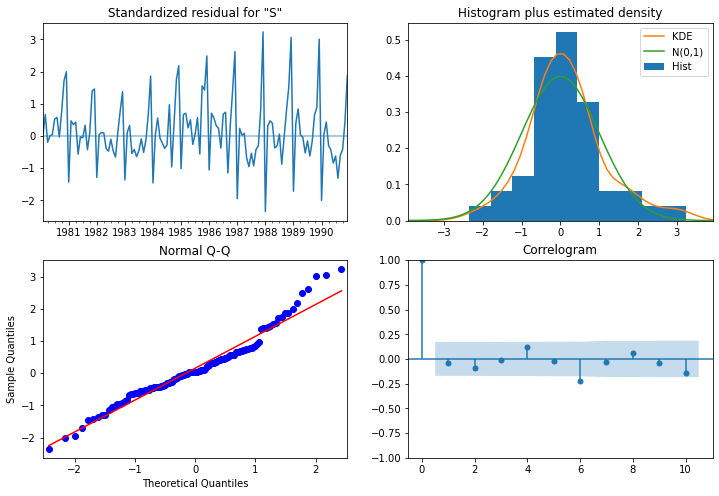

In [613]:
results_auto_ARIMA_sparkling.plot_diagnostics(figsize = (12,8));

In [614]:
sparkling_test_pred_Arima_12 = results_auto_ARIMA_sparkling.forecast(steps = len(Arima_sparkling_test))

In [615]:
sparkling_test_pred_Arima_12.head()

1991-01-01    4252.347924
1991-02-01    2863.090133
1991-03-01    2043.973171
1991-04-01    1746.207340
1991-05-01    1813.633672
Freq: MS, Name: predicted_mean, dtype: float64

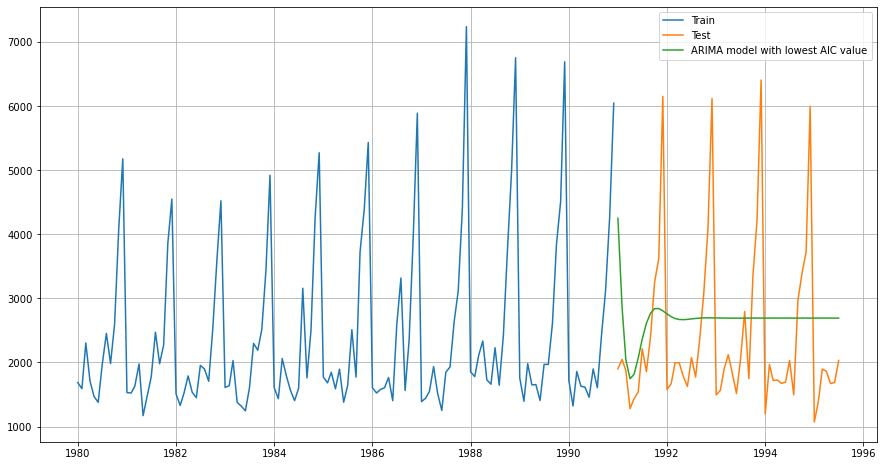

In [616]:
plt.plot(sparkling_train["Sparkling"], label = "Train")
plt.plot(sparkling_test["Sparkling"], label = "Test")
plt.plot(sparkling_test_pred_Arima_12, label = "ARIMA model with lowest AIC value")
plt.legend(loc = "best")
plt.grid();

In [617]:
rmse_sparkling_test_Arima_12 = metrics.mean_squared_error(Arima_sparkling_test["Sparkling"],sparkling_test_pred_Arima_12, squared = False)

In [618]:
rmse_sparkling_test_Arima_12

1299.9796397916396

In [619]:
MAPE_sparkling_Arima_12 = MAPE(Arima_sparkling_test["Sparkling"],sparkling_test_pred_Arima_12)

In [620]:
MAPE_sparkling_Arima_12

43.2

In [621]:
resultsDF_sparkling_Arima_12 = pd.DataFrame({"RMSE_Test":(rmse_sparkling_test_Arima_12),
                                  "MAPE":(MAPE_sparkling_Arima_12)
                                  }, index = ["ARIMA model using lowest AIC value parameters (2,1,2)"])

In [622]:
resultsDF_sparkling_Arima_12 

,RMSE_Test,MAPE
"ARIMA model using lowest AIC value parameters (2,1,2)",1299.97964,43.2


In [623]:
resultsDF_sparkling = pd.concat([resultsDF_sparkling,resultsDF_sparkling_Arima_12])

In [624]:
resultsDF_sparkling

,RMSE_Test,MAPE
"Simple Exponential Smoothing, alpha = 0.049",1316.035487,45.47
"Simple Exponential Smoothing, alpha = 0.02",1279.495201,40.97
"Double Exponential Smoothing, alpha = 0.688, beta = 0.000100",2007.238526,68.23
"Double Exponential Smoothing, alpha = 0.02, beta = 0.50",1274.630824,38.90
"Triple Exponential Smoothing (Additive), alpha = 0.112, beta = 0.0374, gamma = 0.493",473.152417,16.53
"Triple Exponential Smoothing (Additive) , alpha = 0.1, beta = 0.9, gamma = 0.6",338.458417,9.93
Linear Regression,1389.135175,50.15
Naive Model,3864.279352,152.87
Simple Average Model,1275.081804,38.90
2 point moving average,813.400684,19.70


**SARIMA model using lowest AIC value**

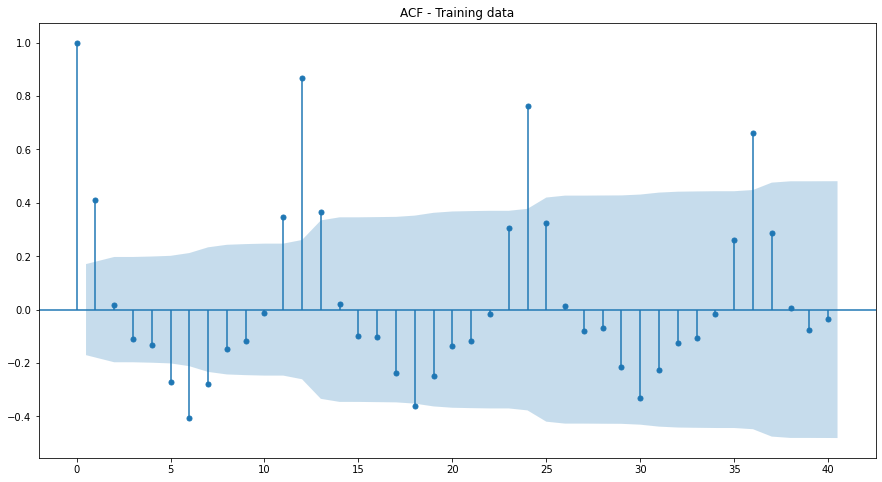

In [625]:
plot_acf(Arima_sparkling_train, title = "ACF - Training data", missing = "drop", lags = 40);

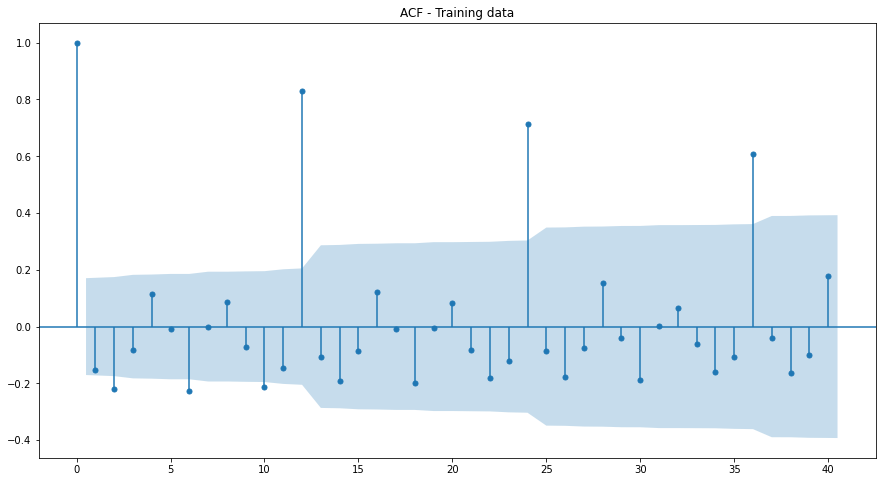

In [626]:
#Checking the acf plots for the training data
plot_acf(Arima_sparkling_train.diff(), title = "ACF - Training data", missing = "drop", lags = 40);

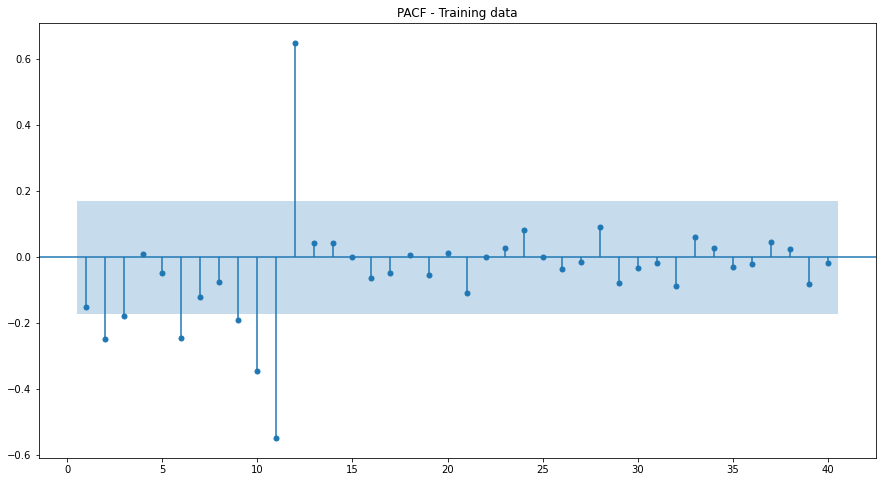

In [627]:
#Checking the pacf plot for the training data
plot_pacf(Arima_sparkling_train.diff().dropna(), title = "PACF - Training data", zero = False, method = "ywmle", lags = 40);

In [628]:
p = range(0,3)
q = range(0,3)
d = range(1,2)
D = range(0,2)

In [629]:
pdq = list(itertools.product(p,d,q))
PDQ = [(x[0],x[1],x[2],12) for x in list(itertools.product(p,D,q))]
print("Examples")
for i in range (1, len(pdq)):
    print("Model : {} {}".format(pdq[i], PDQ[i]))

Examples
Model : (0, 1, 1) (0, 0, 1, 12)
Model : (0, 1, 2) (0, 0, 2, 12)
Model : (1, 1, 0) (0, 1, 0, 12)
Model : (1, 1, 1) (0, 1, 1, 12)
Model : (1, 1, 2) (0, 1, 2, 12)
Model : (2, 1, 0) (1, 0, 0, 12)
Model : (2, 1, 1) (1, 0, 1, 12)
Model : (2, 1, 2) (1, 0, 2, 12)


In [630]:
SARIMA_AIC_sparkling = pd.DataFrame(columns = ["param","seasonal","AIC"])

In [631]:
SARIMA_AIC_sparkling 

,param,seasonal,AIC


In [632]:
for param in pdq:
    for param_seasonal in PDQ:
        Sarima_model_13 = sm.tsa.statespace.SARIMAX(Arima_sparkling_train["Sparkling"].values,
                                                    order = param, seasonal_order = param_seasonal,
                                                    enforce_stationarity = False, 
                                                    enforce_invertibility= False)
        results_Sarima_model_sparkling = Sarima_model_13.fit(maxiter = 1000)
        print("SARIMA {} X {}12 - AIC : {}".format(param, param_seasonal,results_Sarima_model_sparkling.aic ))
        SARIMA_AIC_sparkling = SARIMA_AIC_sparkling.append({"param": param,
                                                  "seasonal" : param_seasonal, 
                                                  "AIC" : results_Sarima_model_sparkling.aic
                                                 }, ignore_index = True)


SARIMA (0, 1, 0) X (0, 0, 0, 12)12 - AIC : 2251.3597196862966
SARIMA (0, 1, 0) X (0, 0, 1, 12)12 - AIC : 1956.2614616842675
SARIMA (0, 1, 0) X (0, 0, 2, 12)12 - AIC : 1723.1533640235496
SARIMA (0, 1, 0) X (0, 1, 0, 12)12 - AIC : 1822.9824851895298
SARIMA (0, 1, 0) X (0, 1, 1, 12)12 - AIC : 1626.8626334678963
SARIMA (0, 1, 0) X (0, 1, 2, 12)12 - AIC : 1452.6773574254655
SARIMA (0, 1, 0) X (1, 0, 0, 12)12 - AIC : 1837.4366022456675
SARIMA (0, 1, 0) X (1, 0, 1, 12)12 - AIC : 1806.9905301389083
SARIMA (0, 1, 0) X (1, 0, 2, 12)12 - AIC : 1633.2108735791944
SARIMA (0, 1, 0) X (1, 1, 0, 12)12 - AIC : 1646.377816766144
SARIMA (0, 1, 0) X (1, 1, 1, 12)12 - AIC : 1628.32439081859
SARIMA (0, 1, 0) X (1, 1, 2, 12)12 - AIC : 1454.5289621306997
SARIMA (0, 1, 0) X (2, 0, 0, 12)12 - AIC : 1648.3776153470856
SARIMA (0, 1, 0) X (2, 0, 1, 12)12 - AIC : 1647.2054158611443
SARIMA (0, 1, 0) X (2, 0, 2, 12)12 - AIC : 1630.9898053920774
SARIMA (0, 1, 0) X (2, 1, 0, 12)12 - AIC : 1466.6211360755017
SARIMA (0, 

SARIMA (2, 1, 1) X (1, 0, 1, 12)12 - AIC : 1740.0911276667364
SARIMA (2, 1, 1) X (1, 0, 2, 12)12 - AIC : 1571.9888282546003
SARIMA (2, 1, 1) X (1, 1, 0, 12)12 - AIC : 1574.3724067255444
SARIMA (2, 1, 1) X (1, 1, 1, 12)12 - AIC : 1571.8577388006777
SARIMA (2, 1, 1) X (1, 1, 2, 12)12 - AIC : 1401.9104199708304
SARIMA (2, 1, 1) X (2, 0, 0, 12)12 - AIC : 1577.123506089688
SARIMA (2, 1, 1) X (2, 0, 1, 12)12 - AIC : 1573.1595857703485
SARIMA (2, 1, 1) X (2, 0, 2, 12)12 - AIC : 1572.3428643854995
SARIMA (2, 1, 1) X (2, 1, 0, 12)12 - AIC : 1400.9854069823177
SARIMA (2, 1, 1) X (2, 1, 1, 12)12 - AIC : 1401.992473547397
SARIMA (2, 1, 1) X (2, 1, 2, 12)12 - AIC : 1403.8183454760037
SARIMA (2, 1, 2) X (0, 0, 0, 12)12 - AIC : 2176.8681149359595
SARIMA (2, 1, 2) X (0, 0, 1, 12)12 - AIC : 1892.2372612883312
SARIMA (2, 1, 2) X (0, 0, 2, 12)12 - AIC : 1661.5523433339908
SARIMA (2, 1, 2) X (0, 1, 0, 12)12 - AIC : 1742.2930709411937
SARIMA (2, 1, 2) X (0, 1, 1, 12)12 - AIC : 1556.946732412197
SARIMA (2, 

In [633]:
SARIMA_AIC_sparkling.sort_values(by = "AIC", ascending = True).head()

,param,seasonal,AIC
95,"(1, 1, 2)","(0, 1, 2, 12)",1382.347780
41,"(0, 1, 2)","(0, 1, 2, 12)",1382.484254
101,"(1, 1, 2)","(1, 1, 2, 12)",1384.137874
149,"(2, 1, 2)","(0, 1, 2, 12)",1384.317618
47,"(0, 1, 2)","(1, 1, 2, 12)",1384.398867


In [634]:
auto_SARIMA_sparkling = sm.tsa.statespace.SARIMAX(Arima_sparkling_train["Sparkling"].values,
                                                    order = (1,1,2), seasonal_order = (0,1,2,12),
                                                    enforce_stationarity = False, 
                                                    enforce_invertibility= False)

In [635]:
results_auto_SARIMA_sparkling = auto_SARIMA_sparkling.fit(maxiter = 1000)

In [636]:
print(results_auto_SARIMA_sparkling.summary())

                                     SARIMAX Results                                      
Dep. Variable:                                  y   No. Observations:                  132
Model:             SARIMAX(1, 1, 2)x(0, 1, 2, 12)   Log Likelihood                -685.174
Date:                            Sun, 01 May 2022   AIC                           1382.348
Time:                                    10:28:45   BIC                           1397.479
Sample:                                         0   HQIC                          1388.455
                                            - 132                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5507      0.287     -1.922      0.055      -1.112       0.011
ma.L1         -0.1612      0.235   

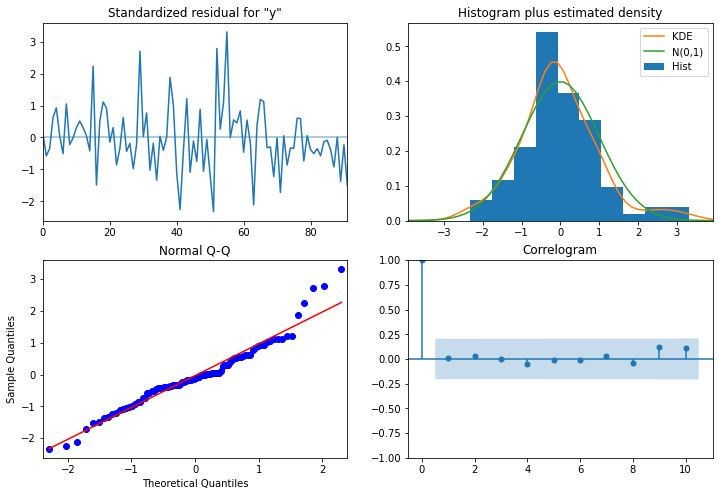

In [637]:
results_auto_SARIMA_sparkling.plot_diagnostics(figsize = (12,8));

In [638]:
sparkling_test_pred_Sarima_13 = results_auto_SARIMA_sparkling.forecast(steps = len(Arima_sparkling_test))

In [639]:
sparkling_test_pred_Sarima_13 =pd.DataFrame(sparkling_test_pred_Sarima_13, index = Arima_sparkling_test.index)

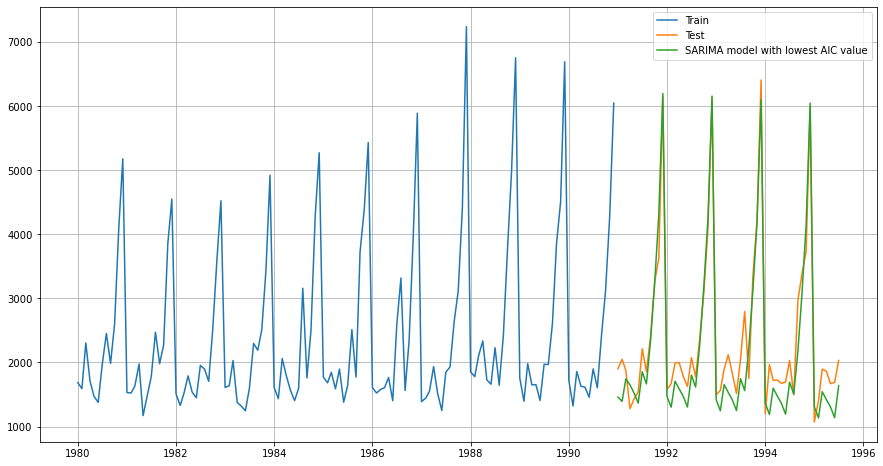

In [640]:
plt.plot(Arima_sparkling_train["Sparkling"], label = "Train")
plt.plot(Arima_sparkling_test["Sparkling"], label = "Test")
plt.plot(sparkling_test_pred_Sarima_13, label = "SARIMA model with lowest AIC value")
plt.legend(loc = "best")
plt.grid();

In [641]:
rmse_sparkling_test_Sarima_13 = metrics.mean_squared_error(Arima_sparkling_test["Sparkling"],sparkling_test_pred_Sarima_13, squared = False)

In [642]:
rmse_sparkling_test_Sarima_13

382.57673433476344

In [643]:
MAPE_sparkling_Sarima_13 = MAPE(Arima_sparkling_test["Sparkling"],sparkling_test_pred_Sarima_13)

In [644]:
MAPE_sparkling_Sarima_13

2932.67

In [645]:
resultsDF_sparkling_Sarima_13 = pd.DataFrame({"RMSE_Test":(rmse_sparkling_test_Sarima_13),
                                  "MAPE":(MAPE_sparkling_Sarima_13)
                                  }, index = ["SARIMA model using lowest AIC value parameters (1,1,2) (0,1,2,12)"])

In [646]:
resultsDF_sparkling_Sarima_13

,RMSE_Test,MAPE
"SARIMA model using lowest AIC value parameters (1,1,2) (0,1,2,12)",382.576734,2932.67


In [647]:
resultsDF_sparkling = pd.concat([resultsDF_sparkling,resultsDF_sparkling_Sarima_13])

In [648]:
resultsDF_sparkling 

,RMSE_Test,MAPE
"Simple Exponential Smoothing, alpha = 0.049",1316.035487,45.47
"Simple Exponential Smoothing, alpha = 0.02",1279.495201,40.97
"Double Exponential Smoothing, alpha = 0.688, beta = 0.000100",2007.238526,68.23
"Double Exponential Smoothing, alpha = 0.02, beta = 0.50",1274.630824,38.90
"Triple Exponential Smoothing (Additive), alpha = 0.112, beta = 0.0374, gamma = 0.493",473.152417,16.53
"Triple Exponential Smoothing (Additive) , alpha = 0.1, beta = 0.9, gamma = 0.6",338.458417,9.93
Linear Regression,1389.135175,50.15
Naive Model,3864.279352,152.87
Simple Average Model,1275.081804,38.90
2 point moving average,813.400684,19.70


**7. Build ARIMA/SARIMA models based on the cut-off points of ACF and PACF on the training data and evaluate this model on the test data using RMSE.**

**ARIMA model using ACF and PACF plots**

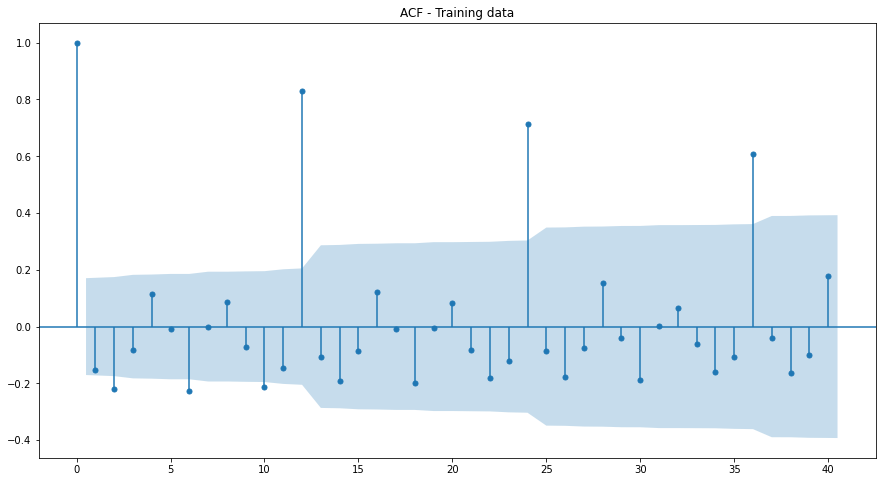

In [649]:
#Checking the acf plots for the training data
plot_acf(Arima_sparkling_train.diff(), title = "ACF - Training data", missing = "drop", lags = 40);

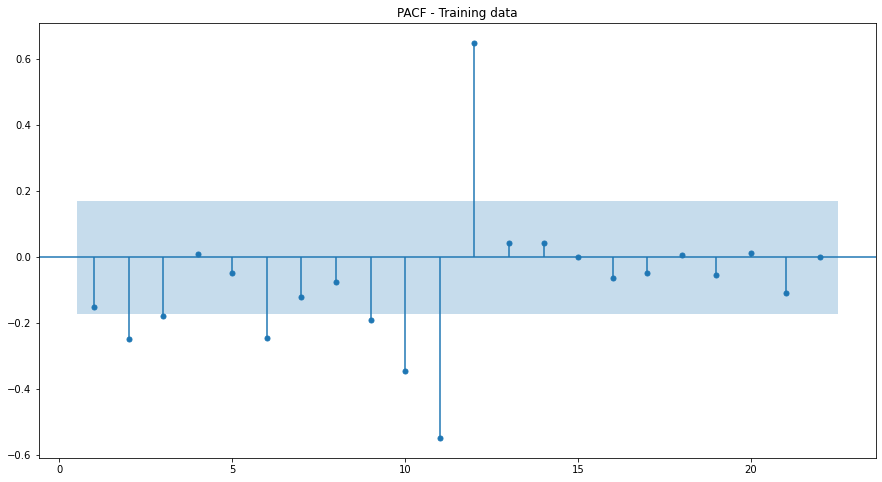

In [650]:
#Checking the pacf plot for the training data
plot_pacf(Arima_sparkling_train.diff().dropna(), title = "PACF - Training data", zero = False, method = "ywmle");

In [651]:
manual_ARIMA_sparkling = ARIMA(Arima_sparkling_train.astype("float64"), order = (0,1,0))
results_manual_ARIMA_sparkling = manual_ARIMA_sparkling.fit()

C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'
C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'
C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'


In [652]:
print(results_manual_ARIMA_sparkling.summary())

                               SARIMAX Results                                
Dep. Variable:              Sparkling   No. Observations:                  132
Model:                 ARIMA(0, 1, 0)   Log Likelihood               -1132.832
Date:                Sun, 01 May 2022   AIC                           2267.663
Time:                        10:28:48   BIC                           2270.538
Sample:                    01-01-1980   HQIC                          2268.831
                         - 12-01-1990                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      1.885e+06   1.29e+05     14.658      0.000    1.63e+06    2.14e+06
Ljung-Box (L1) (Q):                   3.07   Jarque-Bera (JB):               198.83
Prob(Q):                              0.08   Pr

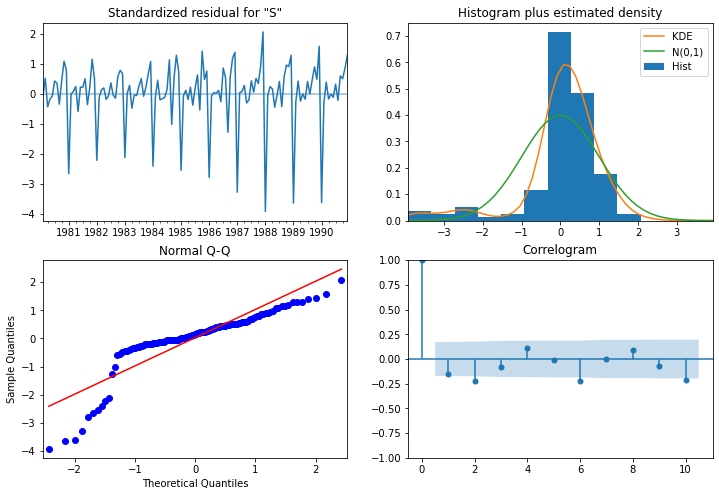

In [653]:
results_manual_ARIMA_sparkling.plot_diagnostics(figsize = (12,8));

In [654]:
sparkling_test_pred_Arima_14 = results_manual_ARIMA_sparkling.forecast(steps = len(Arima_sparkling_test))

In [655]:
sparkling_test_pred_Arima_14.head()

1991-01-01    6047.0
1991-02-01    6047.0
1991-03-01    6047.0
1991-04-01    6047.0
1991-05-01    6047.0
Freq: MS, Name: predicted_mean, dtype: float64

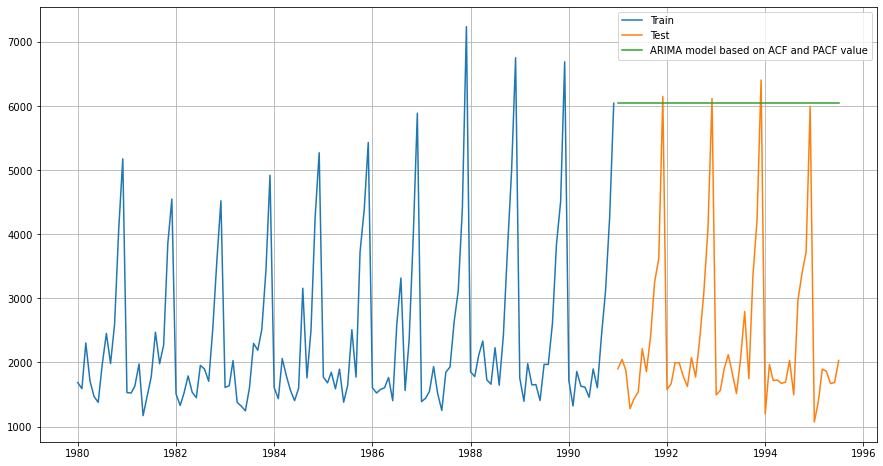

In [656]:
plt.plot(sparkling_train["Sparkling"], label = "Train")
plt.plot(sparkling_test["Sparkling"], label = "Test")
plt.plot(sparkling_test_pred_Arima_14, label = "ARIMA model based on ACF and PACF value")
plt.legend(loc = "best")
plt.grid();

In [657]:
rmse_sparkling_test_Arima_14 = metrics.mean_squared_error(Arima_sparkling_test["Sparkling"],sparkling_test_pred_Arima_14, squared = False)

In [658]:
rmse_sparkling_test_Arima_14

3864.2793518443914

In [659]:
MAPE_sparkling_Arima_14 = MAPE(Arima_sparkling_test["Sparkling"],sparkling_test_pred_Arima_14)

In [660]:
MAPE_sparkling_Arima_14

152.87

In [661]:
resultsDF_sparkling_Arima_14 = pd.DataFrame({"RMSE_Test":(rmse_sparkling_test_Arima_14),
                                  "MAPE":(MAPE_sparkling_Arima_14)
                                  }, index = ["ARIMA model based on ACF and PACF plot parameters (0,1,0)"])

In [662]:
resultsDF_sparkling_Arima_14

,RMSE_Test,MAPE
"ARIMA model based on ACF and PACF plot parameters (0,1,0)",3864.279352,152.87


In [663]:
resultsDF_sparkling = pd.concat([resultsDF_sparkling,resultsDF_sparkling_Arima_14])

In [664]:
resultsDF_sparkling

,RMSE_Test,MAPE
"Simple Exponential Smoothing, alpha = 0.049",1316.035487,45.47
"Simple Exponential Smoothing, alpha = 0.02",1279.495201,40.97
"Double Exponential Smoothing, alpha = 0.688, beta = 0.000100",2007.238526,68.23
"Double Exponential Smoothing, alpha = 0.02, beta = 0.50",1274.630824,38.90
"Triple Exponential Smoothing (Additive), alpha = 0.112, beta = 0.0374, gamma = 0.493",473.152417,16.53
"Triple Exponential Smoothing (Additive) , alpha = 0.1, beta = 0.9, gamma = 0.6",338.458417,9.93
Linear Regression,1389.135175,50.15
Naive Model,3864.279352,152.87
Simple Average Model,1275.081804,38.90
2 point moving average,813.400684,19.70


**SARIMA model based on ACF and PACF plot**

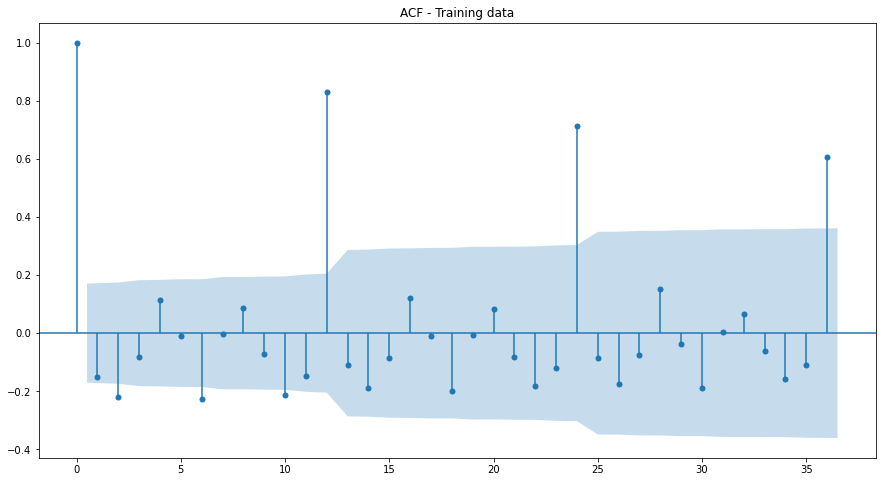

In [665]:
#Checking the acf plots for the training data
plot_acf(Arima_sparkling_train.diff(), title = "ACF - Training data", missing = "drop", lags = 36);

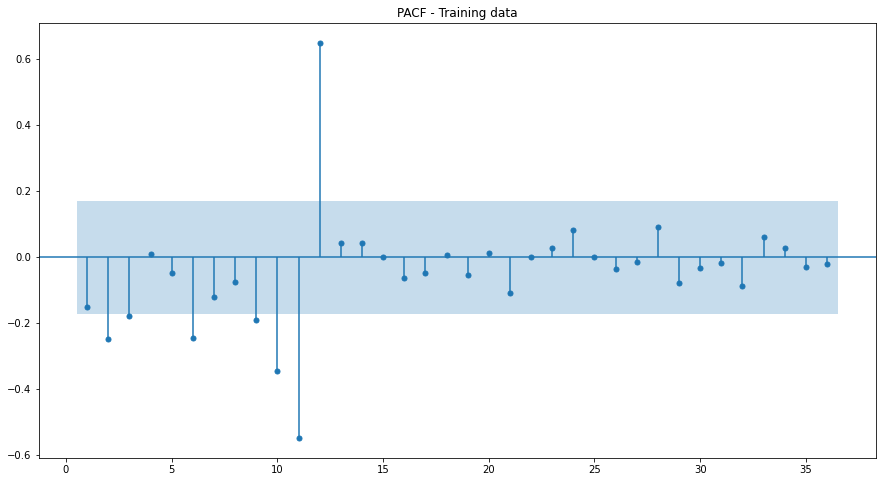

In [666]:
#Checking the pacf plot for the training data
plot_pacf(Arima_sparkling_train.diff().dropna(), title = "PACF - Training data", zero = False, method = "ywmle", lags = 36);

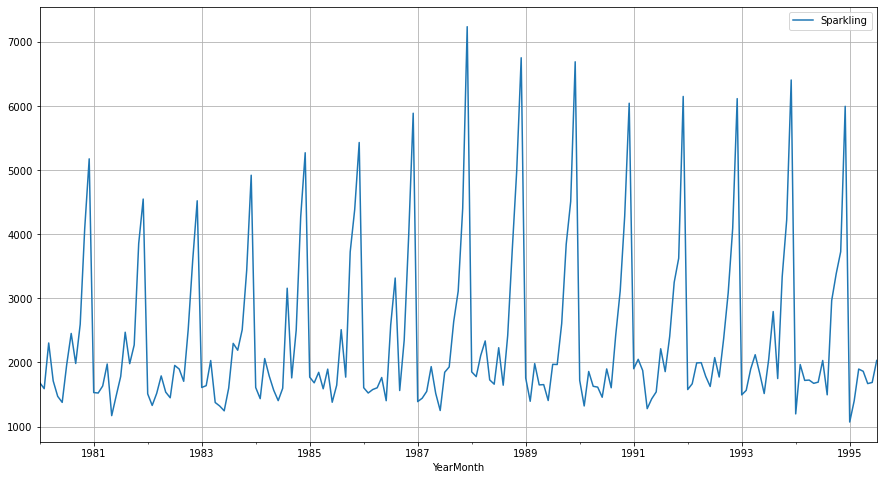

In [667]:
sparkling_df.plot()
plt.grid();

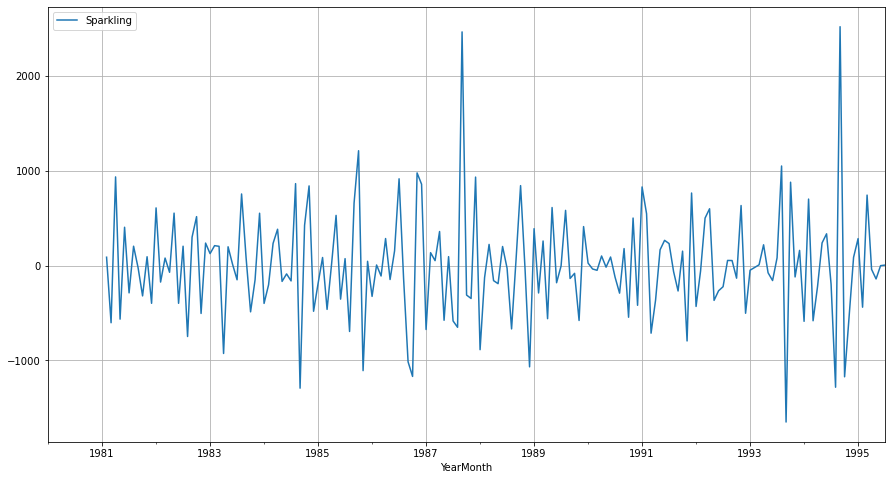

In [668]:
(sparkling_df.diff(12)).diff().plot()
plt.grid();

To check for Stationarity, we will be performing the Augumented Dickey Fuller test

**Null Hypothesis Ho - The time series has a unit root and thus non-stationary.**

**Alternate Hypothesis Ha - The time series does not have a unit root and thus is stationary.**

Level of Significance - α -0.05

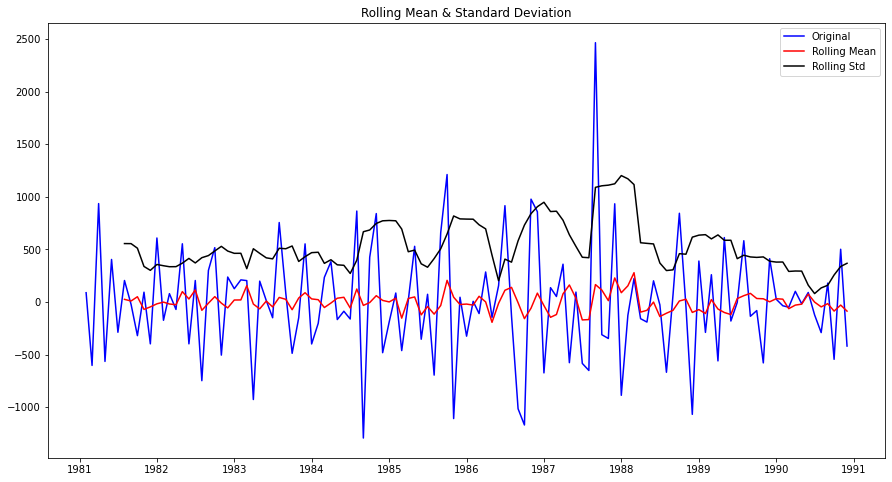

Results of Dickey-Fuller Test:
Test Statistic                  -3.342905
p-value                          0.013066
#Lags Used                      10.000000
Number of Observations Used    108.000000
Critical Value (1%)             -3.492401
Critical Value (5%)             -2.888697
Critical Value (10%)            -2.581255
dtype: float64 



In [669]:
test_stationarity((Arima_sparkling_train["Sparkling"].diff(12).dropna()).diff().dropna())

**After performing the difference, the value of p (0.0136) is less than the α (0.05), the significance level.**

**Hence we reject the null hypothesis that the time-series data is non-stationary, and accept the alternate hypothesis that the time-series data is stationary.**

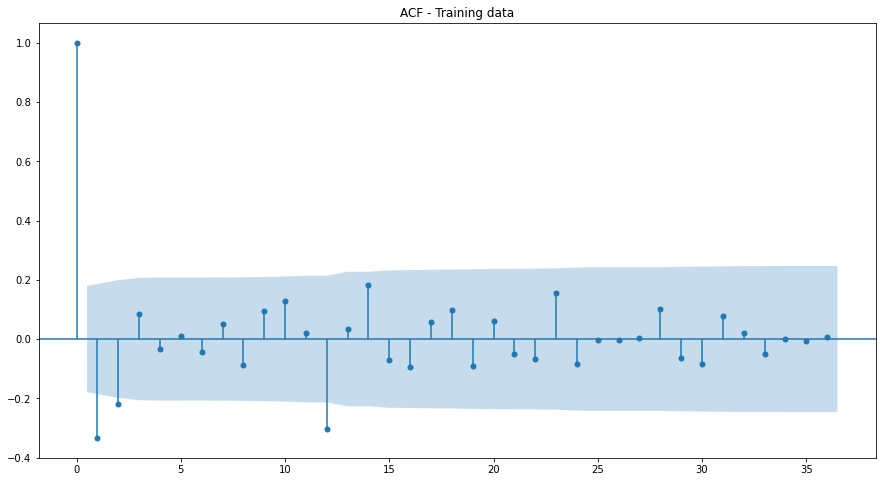

In [670]:
#Checking the acf plots for the training data
plot_acf((Arima_sparkling_train.diff(12).dropna()).diff().dropna(), title = "ACF - Training data", missing = "drop", lags = 36);

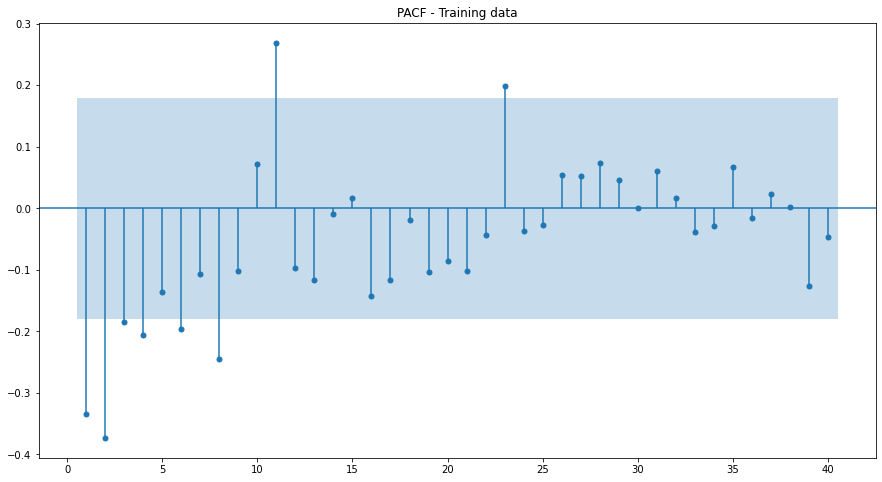

In [671]:
#Checking the pacf plot for the training data
plot_pacf((Arima_sparkling_train.diff(12).dropna()).diff().dropna(), title = "PACF - Training data", zero = False, method = "ywmle", lags = 40 );

In [672]:
manual_SARIMA_sparkling = sm.tsa.statespace.SARIMAX(Arima_sparkling_train["Sparkling"].astype("float64"),
                                                    order = (2,1,2), seasonal_order = (0,1,0,12),
                                                    enforce_stationarity = False, 
                                                    enforce_invertibility= False)


C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'
C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'


In [673]:
results_manual_SARIMA_sparkling = manual_SARIMA_sparkling.fit(maxiter = 1000)

In [674]:
print(results_manual_SARIMA_sparkling.summary())

                                      SARIMAX Results                                      
Dep. Variable:                           Sparkling   No. Observations:                  132
Model:             SARIMAX(2, 1, 2)x(0, 1, [], 12)   Log Likelihood                -866.147
Date:                             Sun, 01 May 2022   AIC                           1742.293
Time:                                     10:28:54   BIC                           1756.061
Sample:                                 01-01-1980   HQIC                          1747.882
                                      - 12-01-1990                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.6909      0.090     -7.701      0.000      -0.867      -0.515
ar.L2          0.1746      

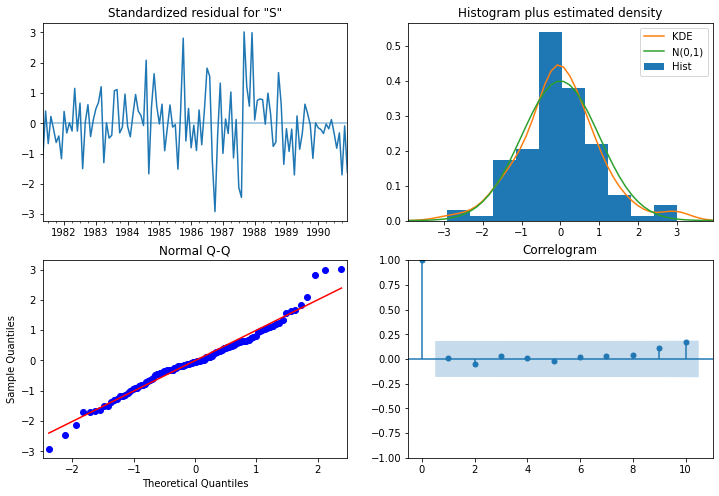

In [675]:
results_manual_SARIMA_sparkling.plot_diagnostics(figsize = (12,8));

In [676]:
sparkling_test_pred_Sarima_15 = results_manual_SARIMA_sparkling.forecast(steps = len(Arima_sparkling_test))

In [677]:
sparkling_test_pred_Sarima_15 =pd.DataFrame(sparkling_test_pred_Sarima_15, index = Arima_sparkling_test.index)

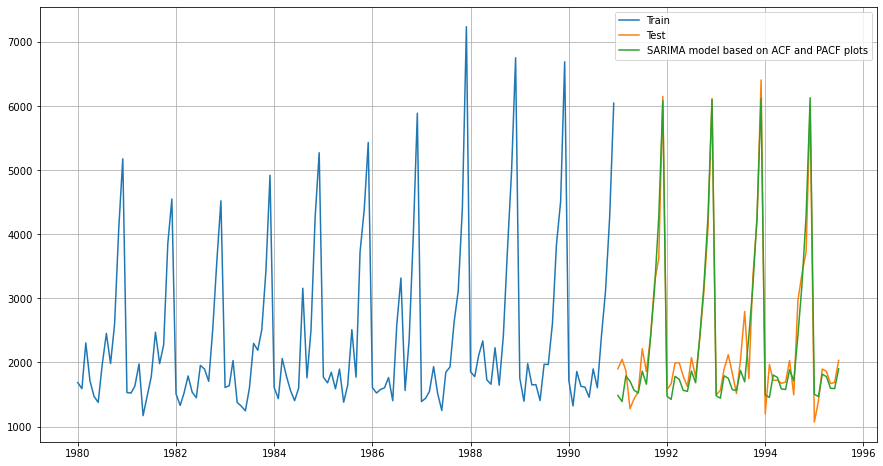

In [678]:
plt.plot(Arima_sparkling_train["Sparkling"], label = "Train")
plt.plot(Arima_sparkling_test["Sparkling"], label = "Test")
plt.plot(sparkling_test_pred_Sarima_15, label = "SARIMA model based on ACF and PACF plots")
plt.legend(loc = "best")
plt.grid();

In [679]:
rmse_sparkling_test_Sarima_15 = metrics.mean_squared_error(Arima_sparkling_test["Sparkling"],sparkling_test_pred_Sarima_15, squared = False)

In [680]:
rmse_sparkling_test_Sarima_15

304.45433725630346

In [681]:
MAPE_sparkling_Sarima_15 = MAPE(Arima_sparkling_test["Sparkling"],sparkling_test_pred_Sarima_15)

In [682]:
MAPE_sparkling_Sarima_15

2769.96

In [683]:
resultsDF_sparkling_Sarima_15 = pd.DataFrame({"RMSE_Test":(rmse_sparkling_test_Sarima_15),
                                  "MAPE":(MAPE_sparkling_Sarima_15)
                                  }, index = ["SARIMA model based on ACF and PACF plot parameters(2,1,2)(0,1,0,12)"])

In [684]:
resultsDF_sparkling_Sarima_15

,RMSE_Test,MAPE
"SARIMA model based on ACF and PACF plot parameters(2,1,2)(0,1,0,12)",304.454337,2769.96


In [685]:
resultsDF_sparkling = pd.concat([resultsDF_sparkling,resultsDF_sparkling_Sarima_15])

In [686]:
resultsDF_sparkling

,RMSE_Test,MAPE
"Simple Exponential Smoothing, alpha = 0.049",1316.035487,45.47
"Simple Exponential Smoothing, alpha = 0.02",1279.495201,40.97
"Double Exponential Smoothing, alpha = 0.688, beta = 0.000100",2007.238526,68.23
"Double Exponential Smoothing, alpha = 0.02, beta = 0.50",1274.630824,38.90
"Triple Exponential Smoothing (Additive), alpha = 0.112, beta = 0.0374, gamma = 0.493",473.152417,16.53
"Triple Exponential Smoothing (Additive) , alpha = 0.1, beta = 0.9, gamma = 0.6",338.458417,9.93
Linear Regression,1389.135175,50.15
Naive Model,3864.279352,152.87
Simple Average Model,1275.081804,38.90
2 point moving average,813.400684,19.70


**8. Build a table with all the models built along with their corresponding parameters and the respective RMSE values on the test data.**

In [687]:
resultsDF_sparkling.sort_values(by = "RMSE_Test", ascending = True)

,RMSE_Test,MAPE
"SARIMA model based on ACF and PACF plot parameters(2,1,2)(0,1,0,12)",304.454337,2769.96
"Triple Exponential Smoothing (Additive) , alpha = 0.1, beta = 0.9, gamma = 0.6",338.458417,9.93
"SARIMA model using lowest AIC value parameters (1,1,2) (0,1,2,12)",382.576734,2932.67
"Triple Exponential Smoothing (Additive), alpha = 0.112, beta = 0.0374, gamma = 0.493",473.152417,16.53
2 point moving average,813.400684,19.70
4 point moving average,1156.589694,35.96
"Double Exponential Smoothing, alpha = 0.02, beta = 0.50",1274.630824,38.90
Simple Average Model,1275.081804,38.90
"Simple Exponential Smoothing, alpha = 0.02",1279.495201,40.97
6 point moving average,1283.927428,43.86


The first three models with the best test RMSE value have made good predictions also, based on the test values that were plotted. So we can continue with those three itself.

**9. Based on the model-building exercise, build the most optimum model(s) on the complete data and predict 12 months into the future with appropriate confidence intervals/bands.**

**SARIMA model based on ACF and PACF plot**

In [688]:
manual_SARIMA_sparkling_final_1 = sm.tsa.statespace.SARIMAX(sparkling_df["Sparkling"].astype("float64"),
                                                    order = (2,1,2), seasonal_order = (0,1,0,12),
                                                    enforce_stationarity = False, 
                                                    enforce_invertibility= False)

C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'
C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'


In [689]:
results_manual_SARIMA_sparkling_final_1 = manual_SARIMA_sparkling_final_1.fit(maxiter = 1000)

In [690]:
print(results_manual_SARIMA_sparkling_final_1.summary())

                                      SARIMAX Results                                      
Dep. Variable:                           Sparkling   No. Observations:                  187
Model:             SARIMAX(2, 1, 2)x(0, 1, [], 12)   Log Likelihood               -1275.395
Date:                             Sun, 01 May 2022   AIC                           2560.791
Time:                                     10:28:57   BIC                           2576.499
Sample:                                 01-01-1980   HQIC                          2567.165
                                      - 07-01-1995                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.8387      0.064    -13.138      0.000      -0.964      -0.714
ar.L2          0.0577      

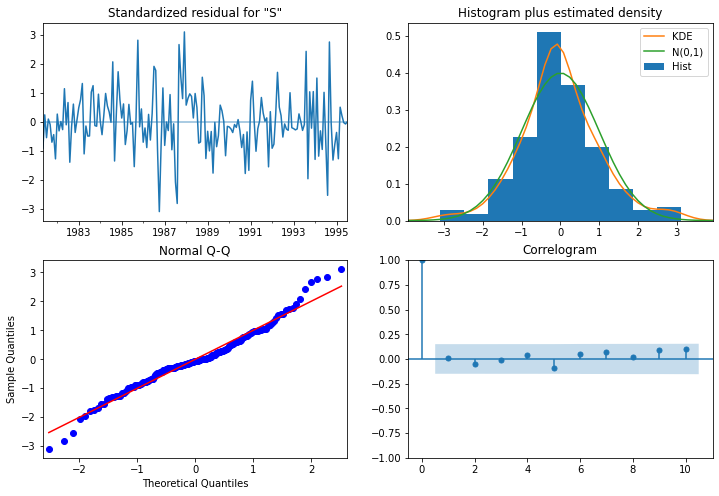

In [691]:
results_manual_SARIMA_sparkling_final_1.plot_diagnostics(figsize = (12,8));

In [692]:
sparkling_pred_Sarima_final_1 = results_manual_SARIMA_sparkling_final_1.fittedvalues

In [693]:
sparkling_pred_Sarima_final_1 = pd.DataFrame(sparkling_pred_Sarima_final_1, index = sparkling_df.index, columns = ["Sparkling"])

In [694]:
rmse_sparkling_predict_final_1 = metrics.mean_squared_error(sparkling_df["Sparkling"],sparkling_pred_Sarima_final_1, squared = False)

In [695]:
rmse_sparkling_predict_final_1

576.4645605331127

In [696]:
MAPE_sparkling_final_1 = MAPE(sparkling_df["Sparkling"],sparkling_pred_Sarima_final_1)

In [697]:
MAPE_sparkling_final_1

9736.91

In [698]:
SARIMA_sparkling_predict_1 = results_manual_SARIMA_sparkling_final_1.forecast(steps = 12)

In [699]:
predict_sparkling_1_df = pd.DataFrame({"Lower_CI" : SARIMA_sparkling_predict_1 - 1.96*np.std(results_manual_SARIMA_sparkling_final_1.resid, ddof = 1), 
                                       "Prediction" : SARIMA_sparkling_predict_1, 
                                       "Upper_CI" : SARIMA_sparkling_predict_1 + 1.96*np.std(results_manual_SARIMA_sparkling_final_1.resid, ddof = 1)   
})

In [700]:
predict_sparkling_1_df.head()

,Lower_CI,Prediction,Upper_CI
1995-08-01,385.444220,1518.342180,2651.240139
1995-09-01,1834.619651,2967.517610,4100.415570
1995-10-01,2272.947094,3405.845054,4538.743013
1995-11-01,2597.686157,3730.584117,4863.482076
1995-12-01,4885.069942,6017.967901,7150.865861


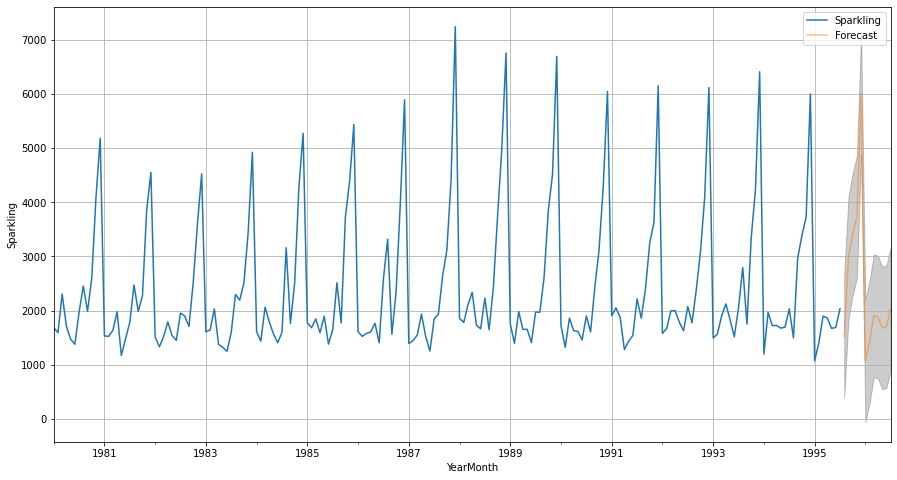

In [701]:
axis = sparkling_df.plot(label = "Actual Data", figsize = (15,8))
predict_sparkling_1_df["Prediction"].plot(ax = axis, label = "Forecast", alpha = 0.5)
axis.fill_between(predict_sparkling_1_df.index, predict_sparkling_1_df["Lower_CI"], predict_sparkling_1_df["Upper_CI"], color = "k", alpha = 0.2)
axis.set_xlabel("YearMonth")
axis.set_ylabel("Sparkling")
plt.legend(loc = "best")
plt.grid();

In [702]:
predict_sparkling_1_df

,Lower_CI,Prediction,Upper_CI
1995-08-01,385.444220,1518.342180,2651.240139
1995-09-01,1834.619651,2967.517610,4100.415570
1995-10-01,2272.947094,3405.845054,4538.743013
1995-11-01,2597.686157,3730.584117,4863.482076
1995-12-01,4885.069942,6017.967901,7150.865861
1996-01-01,-59.620331,1073.277629,2206.175588
1996-02-01,286.541366,1419.439325,2552.337285
1996-03-01,768.759326,1901.657285,3034.555245
1996-04-01,745.296117,1878.194077,3011.092036
1996-05-01,542.883260,1675.781219,2808.679179


**Triple Exponential Manual Additive Model**

In [703]:
TES_sparkling_final_2 = ExponentialSmoothing(sparkling_df["Sparkling"], trend = "additive", seasonal = "additive")

C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'
C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:427: FutureWarning: After 0.13 initialization must be handled at model creation
  warnings.warn(


In [704]:
TES_model_alpha_1_beta_9_gamma_6 = TES_sparkling_final_2.fit(smoothing_level = 0.1, smoothing_trend = 0.9, smoothing_seasonal = 0.6,  optimized = False, use_brute = True)

In [705]:
TES_sparkling_predict_final_2 = TES_model_alpha_1_beta_9_gamma_6.fittedvalues

In [706]:
TES_sparkling_predict_final_2 = pd.DataFrame(TES_sparkling_predict_final_2, columns = ["Sparkling"], index = sparkling_df.index)

In [707]:
rmse_sparkling_predict_final_2 = metrics.mean_squared_error(sparkling_df["Sparkling"],TES_sparkling_predict_final_2, squared = False)

In [708]:
rmse_sparkling_predict_final_2

477.0430780540488

In [709]:
MAPE_sparkling_final_2 = MAPE(sparkling_df["Sparkling"],TES_sparkling_predict_final_2)

In [710]:
MAPE_sparkling_final_2

9870.85

In [711]:
TES_sparkling_predict_2 = TES_model_alpha_1_beta_9_gamma_6.forecast(steps = 12)

In [712]:
predict_sparkling_2_df = pd.DataFrame({"Lower_CI" : TES_sparkling_predict_2 - 1.96*np.std(TES_model_alpha_1_beta_9_gamma_6.resid, ddof = 1), 
                                       "Prediction" : TES_sparkling_predict_2, 
                                       "Upper_CI" : TES_sparkling_predict_2 + 1.96*np.std(TES_model_alpha_1_beta_9_gamma_6.resid, ddof = 1)   
})

In [713]:
predict_sparkling_2_df.head()

,Lower_CI,Prediction,Upper_CI
1995-08-01,1586.577993,2524.054723,3461.531454
1995-09-01,2485.585091,3423.061821,4360.538552
1995-10-01,3236.307246,4173.783976,5111.260706
1995-11-01,3780.477108,4717.953838,5655.430569
1995-12-01,6009.729254,6947.205984,7884.682714


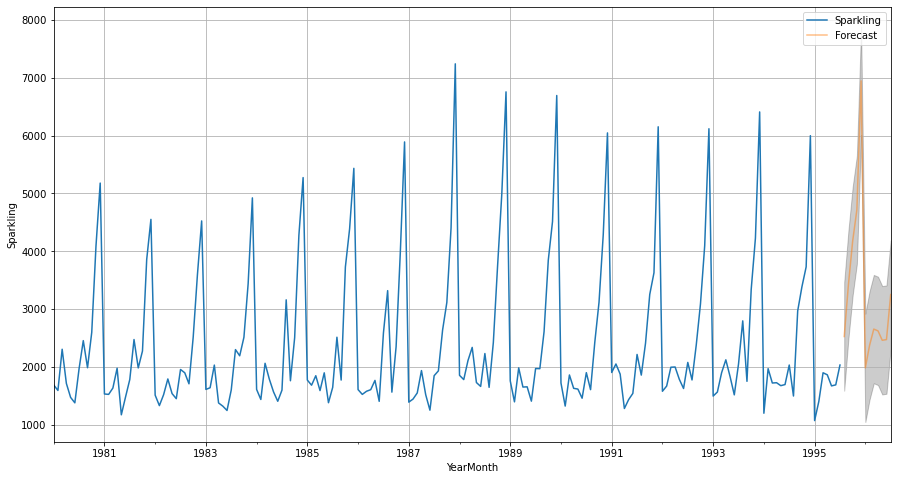

In [714]:
axis = sparkling_df.plot(label = "Actual Data", figsize = (15,8))
predict_sparkling_2_df["Prediction"].plot(ax = axis, label = "Forecast", alpha = 0.5)
axis.fill_between(predict_sparkling_2_df.index, predict_sparkling_2_df["Lower_CI"], predict_sparkling_2_df["Upper_CI"], color = "k", alpha = 0.2)
axis.set_xlabel("YearMonth")
axis.set_ylabel("Sparkling")
plt.legend(loc = "best")
plt.grid();

In [715]:
predict_sparkling_2_df

,Lower_CI,Prediction,Upper_CI
1995-08-01,1586.577993,2524.054723,3461.531454
1995-09-01,2485.585091,3423.061821,4360.538552
1995-10-01,3236.307246,4173.783976,5111.260706
1995-11-01,3780.477108,4717.953838,5655.430569
1995-12-01,6009.729254,6947.205984,7884.682714
1996-01-01,1044.807827,1982.284557,2919.761287
1996-02-01,1433.434123,2370.910853,3308.387583
1996-03-01,1715.545345,2653.022076,3590.498806
1996-04-01,1684.255103,2621.731833,3559.208564
1996-05-01,1521.600694,2459.077424,3396.554154


**SARIMA with Lowest AIC value**

In [716]:
auto_SARIMA_sparkling_final_3 = sm.tsa.statespace.SARIMAX(sparkling_df["Sparkling"].astype("float64"),
                                                    order = (1,1,2), seasonal_order = (0,1,2,12),
                                                    enforce_stationarity = False, 
                                                    enforce_invertibility= False)

C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'
C:\Users\srikanth\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'


In [717]:
results_auto_SARIMA_sparkling_final_3 = auto_SARIMA_sparkling_final_3.fit(maxiter = 1000)

In [718]:
print(results_auto_SARIMA_sparkling_final_3.summary())

                                     SARIMAX Results                                      
Dep. Variable:                          Sparkling   No. Observations:                  187
Model:             SARIMAX(1, 1, 2)x(0, 1, 2, 12)   Log Likelihood               -1086.537
Date:                            Sun, 01 May 2022   AIC                           2185.074
Time:                                    10:29:04   BIC                           2203.017
Sample:                                01-01-1980   HQIC                          2192.364
                                     - 07-01-1995                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5604      0.367     -1.527      0.127      -1.280       0.159
ma.L1         -0.2810      0.339   

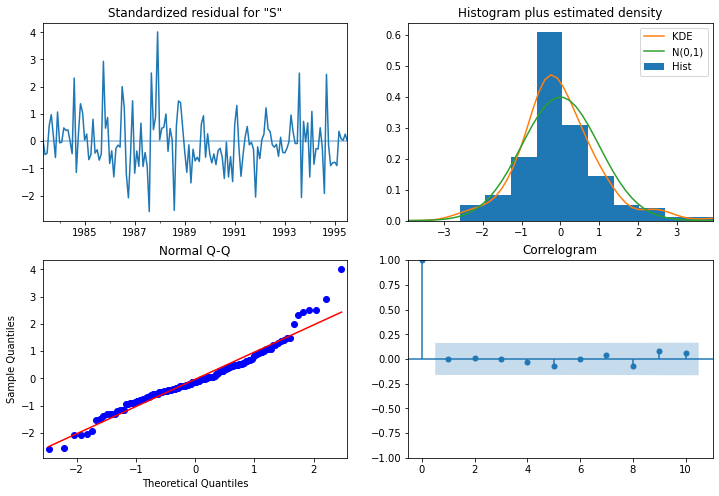

In [719]:
results_auto_SARIMA_sparkling_final_3.plot_diagnostics(figsize = (12,8));

In [720]:
sparkling_pred_Sarima_final_3 = results_auto_SARIMA_sparkling_final_3.fittedvalues

In [721]:
sparkling_pred_Sarima_final_3 = pd.DataFrame(sparkling_pred_Sarima_final_3, index = sparkling_df.index, columns = ["Sparkling"])

In [722]:
rmse_sparkling_predict_final_3 = metrics.mean_squared_error(sparkling_df["Sparkling"],sparkling_pred_Sarima_final_3, squared = False)

In [723]:
rmse_sparkling_predict_final_3

555.3935031971962

In [724]:
MAPE_sparkling_final_3 = MAPE(sparkling_df["Sparkling"],sparkling_pred_Sarima_final_3)

In [725]:
MAPE_sparkling_final_3

9517.29

In [726]:
SARIMA_sparkling_predict_3 = results_auto_SARIMA_sparkling_final_3.forecast(steps = 12)

In [727]:
predict_sparkling_3_df = pd.DataFrame({"Lower_CI" : SARIMA_sparkling_predict_3 - 1.96*np.std(results_auto_SARIMA_sparkling_final_3.resid, ddof = 1), 
                                       "Prediction" : SARIMA_sparkling_predict_3, 
                                       "Upper_CI" : SARIMA_sparkling_predict_3 + 1.96*np.std(results_auto_SARIMA_sparkling_final_3.resid, ddof = 1)   
})

In [728]:
predict_sparkling_3_df.head()

,Lower_CI,Prediction,Upper_CI
1995-08-01,778.447323,1869.761482,2961.075640
1995-09-01,1393.175431,2484.489589,3575.803748
1995-10-01,2202.739771,3294.053930,4385.368088
1995-11-01,2841.552366,3932.866524,5024.180683
1995-12-01,5040.365620,6131.679779,7222.993937


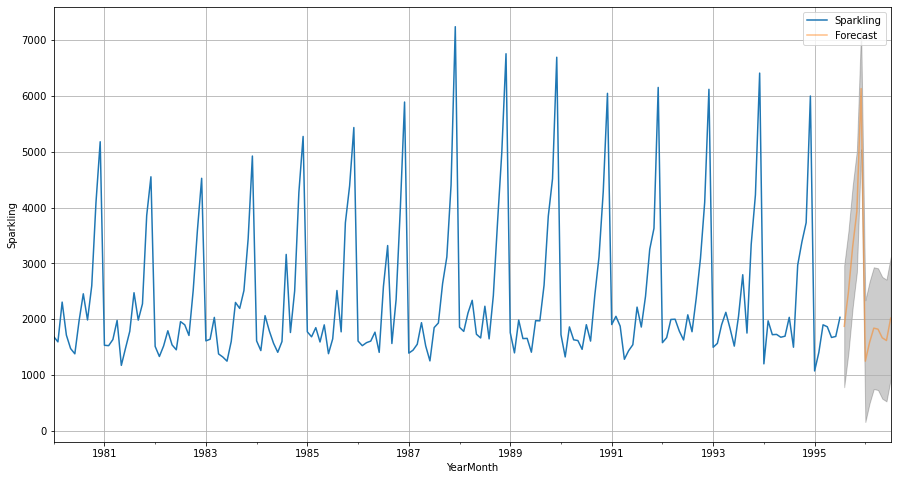

In [729]:
axis = sparkling_df.plot(label = "Actual Data", figsize = (15,8))
predict_sparkling_3_df["Prediction"].plot(ax = axis, label = "Forecast", alpha = 0.5)
axis.fill_between(predict_sparkling_3_df.index, predict_sparkling_3_df["Lower_CI"], predict_sparkling_3_df["Upper_CI"], color = "k", alpha = 0.2)
axis.set_xlabel("YearMonth")
axis.set_ylabel("Sparkling")
plt.legend(loc = "best")
plt.grid();

In [730]:
predict_sparkling_3_df

,Lower_CI,Prediction,Upper_CI
1995-08-01,778.447323,1869.761482,2961.075640
1995-09-01,1393.175431,2484.489589,3575.803748
1995-10-01,2202.739771,3294.053930,4385.368088
1995-11-01,2841.552366,3932.866524,5024.180683
1995-12-01,5040.365620,6131.679779,7222.993937
1996-01-01,153.876503,1245.190662,2336.504820
1996-02-01,488.777779,1580.091938,2671.406096
1996-03-01,746.194477,1837.508635,2928.822794
1996-04-01,727.339498,1818.653656,2909.967815
1996-05-01,572.818041,1664.132200,2755.446359


**Final Model Prediction**

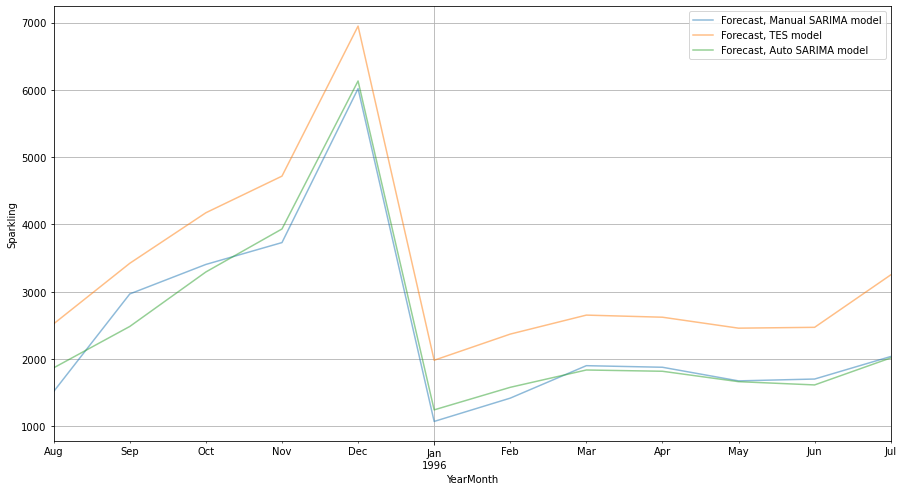

In [731]:
axis = predict_sparkling_1_df["Prediction"].plot(label = "Forecast, Manual SARIMA model", alpha = 0.5)
axis = predict_sparkling_2_df["Prediction"].plot(label = "Forecast, TES model", alpha = 0.5)
axis = predict_sparkling_3_df["Prediction"].plot(label = "Forecast, Auto SARIMA model", alpha = 0.5)
axis.set_xlabel("YearMonth")
axis.set_ylabel("Sparkling")
plt.legend(loc = "best")
plt.grid();

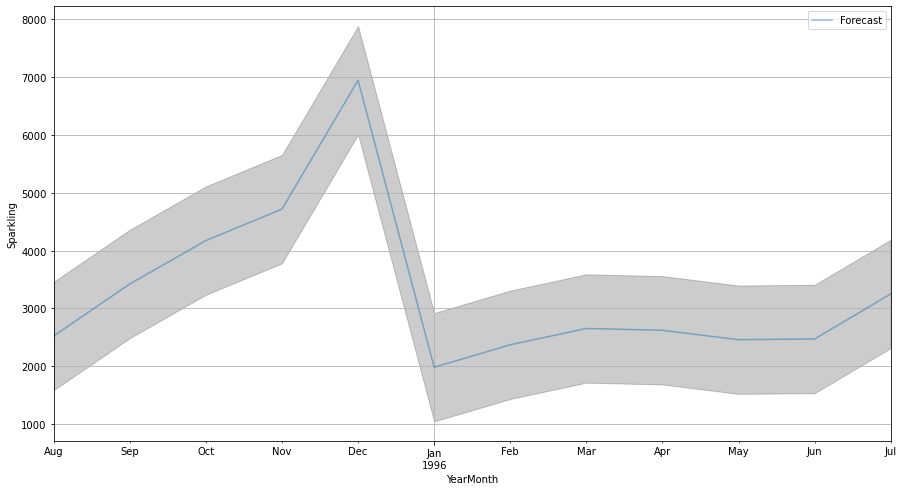

In [732]:
axis = predict_sparkling_2_df["Prediction"].plot(label = "Forecast", alpha = 0.5)
axis.fill_between(predict_sparkling_2_df.index, predict_sparkling_2_df["Lower_CI"], predict_sparkling_2_df["Upper_CI"], color = "k", alpha = 0.2)
axis.set_xlabel("YearMonth")
axis.set_ylabel("Sparkling")
plt.legend(loc = "best")
plt.grid();

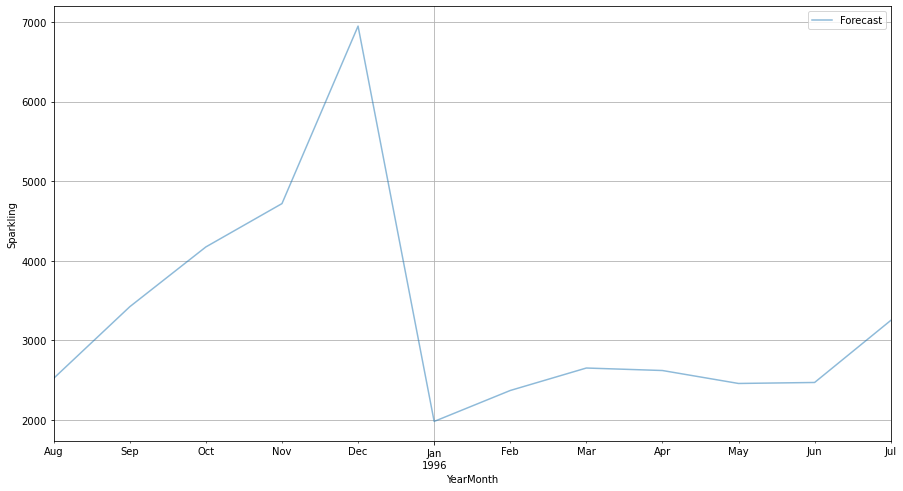

In [733]:
axis = predict_sparkling_2_df["Prediction"].plot(label = "Forecast", alpha = 0.5)
axis.set_xlabel("YearMonth")
axis.set_ylabel("Sparkling")
plt.legend(loc = "best")
plt.grid();

In [734]:
predict_sparkling_2_df["Prediction"].sum()

39594.971229429604

In [735]:
predict_sparkling_2_df["Lower_CI"].sum()

28345.250466613354

In [736]:
predict_sparkling_2_df["Upper_CI"].sum()

50844.69199224585

**10. Comment on the model thus built and report your findings and suggest the measures that the company should be taking for future sales.**

Comments on the Final Models

1.	The best model out of the final three models was the Manual Additive Triple Exponential Smoothing, which gave a total RMSE of 477.043.
2.	The SARIMA models also gave a good performance, but the RMSE was little more than the Triple Exponential Smoothing model.
3.	We can also try to take the forecast based on the three models by taking the mean or by assigning weights to these models, and finding the best values.

Findings
1.	There is no significant upward or downward trend. Over the years, this could mean that the sales would remain fairly the same.
2.	There is a spike in the sales during the last quarter, between October and December.
3.	The sales reaches the peak in the December month, during the holiday season.
4.	There is a slow increase in the wine sales from August to October, coinciding with the fall season.
5.	Immediately after the holiday season there is a slowdown in the wine sales.
6.	During the next twelve months, sales would be high during the December month, and will be the lowest in the months of January.
7.	The total number of units expected to be sold is 39595 units.
8.	In case we take the extremities, there could be a sales of 50844 units maximum and 28345 units minimum.
9.	Without taking the confidence band into the equation, the sales is expected to have a healthy rise from the August of 1995 to end of November of 1995.
10.	The peak of the sales is expected to hit in the December of 1995 with close to 7000 units.
11.	The sales will then drop to almost 2000 units at the end of January of 1996.
12.	The sales is expected to rise slowly from January till end of March, after which the sales is expected slowly decline until end of May.
13.	 After the end of May, the sales will start picking up again till July, which is the end of our forecast period.


Suggestions based on the Final Model

1.	The winery should stock up the wine for the Holiday season.
2.	There is an increasing in the wine sales during August and September. The sales during these months can be increased by providing promoting the wine though advertisements.
3.	The low sales during the initial months of the year can be countered by providing offers and rewards.
4.	These sparkling wines are most used for celebratory parties or christening parties. However there would a considerable wastage of the wine when the bottle is busted. So the company can look to produce cheaper versions of the sparkling wine just for the sake of these parties. This would help to increase the sales during the off-season and will increase the profits.
5.	The trend overall for the sparkling wine is overall flat. There is an increase in some years, but then there is a similar decrease in the next few years, or the vice versa.
6.	The company should introduce classic cocktails with the sparkling wine as the base alcohol. The better the cocktail is more the sales, as most of the people who go to a bar, generally order cocktails.
7.	Tie-up with casinos, wedding and funeral caterers to improve the sales.
8.	The company should offer memberships to people to be a part of their wine-club and offer discounts and invitations to special occasions.
9.	Promote a wine tasting festival, and offer special packages or offers to winners. This would help to improve the sales, as people tend to buy products they have tried to be good.
10.	In this age of social media, consistently keep on posting on social media, and also avail the service of social media influencers.

Steps taken in the project

1.	Initially the dataset was read as a time-series data, and the basic info, missing values imputation, descriptive statistics and EDA was performed.
2.	Based on the EDA, insights were identified.
3.	The train test split was made.
4.	Different models were made with Simple Exponential Smoothing, Double Exponential Smoothing, Triple Exponential Smoothing, Linear Regression, Naïve model, simple and Moving average models, ARIMA and SARIMA models
5.	The stationarity of the dataset was checked using the Augmented Dickey Fuller (ADF) Test, and if the data was found not stationarity, steps were taken to make it stationary.
6.	The performance metrics were calculated for all the models.
7.	Based on the performance metrics, the best model was found.
8.	The final model was made to include the entire dataset, and the model was made to forecast for the next 12 months.
9.	Based on the EDA, insights were gathered.


